Autores: "Canary Software"

# Exploratory Data Analysis - Analisis Exploratorio (EDA)

El análisis exploratorio de datos es el primer paso para resolver cualquier problema de ciencia de datos o aprendizaje automático. Se refiere al proceso crítico de realizar investigaciones iniciales sobre los datos que tenemos disponibles y familiarizarse con ellos. EDA realiza un examen exhaustivo de nuestro conjunto de datos para encontrar tendencias, patrones y relaciones entre las características dentro de los datos con la ayuda de gráficos y diagramas utilizando bibliotecas como Matplotlib y Seaborn. También usaremos la biblioteca Pandas. Pandas facilita mucho la importación, el análisis y la visualización.


### Entender el Problema


El problema a abordar es que hoy no hay indicadores ni predicciones con respecto al presupuesto o los tiempos de la AGENCIA en su portafolio de proyectos.

## Objetivo de la tarea
Objetivo general

El objetivo general es poder generar un cuadro de mando integral, del área de Planificación estratégica en particular de los portafolios de AGESIC, donde permita tener indicadores a la hora de la toma de decisiones. 

Objetivos específicos

Los objetivos específicos del proyecto son los siguientes:
Tener un cuadro de mando integral con los indicadores del portafolio (programa, proyectos y operaciones) al 30 de diciembre del 2022.
Integrar los sistemas WEKAN y SIGES. Para aquellos proyectos donde exista esa integración formarán parte del cuadro de mando integral. Se tendrá resuelta dicha integración al 15 octubre 2022.
Tener un modelo de machine learning con el fin de predecir el comportamiento de un nuevo proyecto con respecto a los existentes al 30 de diciembre del 2022.



## Sobre el dataset
En este caso son dos BD una relacion sql SIGES y otra BD no relacional Mongo DB. Ambas fueron transformadas a SQL mediante pentaho de PDI.
Es una base de datos que tiene mas de 5 años de datos, y se busca poder predecir si un proyecto terminara en, fuera o por debajo de presupuesto en base a ciertas variables. Asimismo se realizara el EDA y nos quedaremos con las variables que efectivamente tienen impacto asi como tambien generar otros modelos apartir de la lectura de los datos.


## Orignal uso

Los datos son brindados por AGESIC son confidenciales.

Debajo se lista todo lo que se instalo para que puedan correr los modelos ademas de que este en el requirements.txt

%pip install runtime.txt
%pip install streamlit
%pip install requirements.txt
%pip install seaborn
%pip install statsmodels
%pip install yfinance
%pip install optuna
%pip install --upgrade pip
%pip install Cython
%pip install fbprophet --quiet
%python -m pip install prophet
%%capture
%pip install fbprophet
%pip install prophet
%pip install pystan==2.19.1.1 prophet
%pip install --upgrade plotl
%pip install pmdarima
%pip install pandas-profiling
%pip install ipywidgets
%pip install wordcloud
%pip install figure
%python3 -m pip install scikit-learn

In [81]:
#Aplicamos los imports primero
# linear algebra
import numpy as np 

#Pandas profile
import pandas_profiling as pp # exploratory data analysis EDA

# data processing, CSV file I/O (e.g. pd.read_csv)
import pandas as pd 

# data visualization
import matplotlib.pyplot as plt # data visualisation
import seaborn as sns #data visualisation
import plotly.express as px #data visualisation
import plotly.graph_objects as go
from scipy.stats import chi2_contingency, norm # Calculo de chi2

# stocks related missing info
import yfinance as yf

# ignoring the warnings
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

%matplotlib inline

#ranking the stocks
import matplotlib.pyplot as plt
import matplotlib.dates as dates
import optuna
from wordcloud import WordCloud, STOPWORDS #es para la nube de palabras

# Evaluar si las elimino
import statsmodels.api as sm

#Timer series
import datetime

#!pip install fbprophet --quiet
import plotly.offline as py
py.init_notebook_mode()

#Guardar modelo
import pickle

#Aplicamos los from luego de los imports

# Evaluar si las elimino
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from matplotlib.pyplot import figure
#ranking the stocks
from plotly.subplots import make_subplots

#Prophet Model Stuff
#!pip install fbprophet --quiet

from prophet import Prophet
from prophet.plot import plot_plotly
from prophet.plot import plot_yearly
from prophet.plot import add_changepoints_to_plot




In [82]:
!pip list

Package                      Version
---------------------------- -----------
absl-py                      1.2.0
aggdraw                      1.3.15
alembic                      1.8.1
altair                       4.2.0
asgiref                      3.5.2
asttokens                    2.0.5
astunparse                   1.6.3
async-generator              1.10
async-timeout                4.0.2
attrs                        22.1.0
autopage                     0.5.1
backcall                     0.2.0
blinker                      1.5
by                           0.0.2
cachetools                   5.2.0
certifi                      2022.6.15
cffi                         1.15.1
charset-normalizer           2.1.0
click                        8.1.3
cliff                        4.0.0
cmaes                        0.8.2
cmd2                         2.4.2
cmdstanpy                    1.0.4
colorama                     0.4.5
colorlog                     6.6.0
commonmark                   0.9.1
convertd

## EDA 
SIGES COMPLETO

Debajo se analiza el dataset completo de SIGES con el fin de analizar los datos. 

In [83]:
df_siges = pd.read_csv('siges_dataset_proyecto.csv', engine='python')

In [49]:
df_siges.info(verbose = True, null_counts = True, buf=None, max_cols=None, memory_usage=None, show_counts=None)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15778 entries, 0 to 15777
Data columns (total 362 columns):
 #    Column                            Non-Null Count  Dtype  
---   ------                            --------------  -----  
 0    proy_pk                           15778 non-null  int64  
 1    proy_org_fk                       15778 non-null  int64  
 2    proy_est_fk                       15778 non-null  int64  
 3    proy_est_pendiente_fk             6 non-null      float64
 4    proy_sol_aceptacion               0 non-null      float64
 5    proy_area_fk                      15778 non-null  int64  
 6    proy_usr_adjunto_fk               15778 non-null  int64  
 7    proy_usr_sponsor_fk               15778 non-null  int64  
 8    proy_usr_gerente_fk               15778 non-null  int64  
 9    proy_usr_pmofed_fk                15762 non-null  float64
 10   proy_prog_fk                      11684 non-null  float64
 11   proy_risk_fk                      0 non-null      fl

In [84]:
df_siges.head()

,proy_pk,proy_org_fk,proy_est_fk,proy_est_pendiente_fk,proy_sol_aceptacion,proy_area_fk,proy_usr_adjunto_fk,proy_usr_sponsor_fk,proy_usr_gerente_fk,proy_usr_pmofed_fk,...,version_7,int_pk,int_rolint_fk,int_observaciones,int_pers_fk,int_orga_fk,int_ent_fk,version_8,int_tipo,int_usuario_fk
0,1,1,5,NaN,NaN,1,46,165,165,50.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,1,5,NaN,NaN,4,216,270,267,91.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,1,5,NaN,NaN,1,187,165,40,50.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,1,5,NaN,NaN,1,46,165,120,50.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,1,5,NaN,NaN,1,46,165,23,50.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Crear reporte de Pandas profile

In [152]:
profile = pp.ProfileReport(df_siges, title = "EDA")
#profile.to_file(output_file="reporte.html") 

profile.to_notebook_iframe() # Genera el reporte directamente en el notebook 
En este caso lo que hicimos los generamos el reporte en json por la cantidad de variables 362 se nos tranca el reporte en el navegador.

In [81]:
# As a string
json_data = profile.to_json()

# As a file
profile.to_file("reporte.json")

Render JSON:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Eliminaremos las columnas innecesarias, nos basamos en el reporte emitido donde nos indica las columnas de alta correlacion y asimismo lo contrastamos con las columnas claves de proyectos. las que posee alta correlacion y alta cardinalidad son las candidatas a dejar. En resumen se extrajeron 145 columnas.

In [85]:
data=df_siges.drop(['proy_latlng_fk','proy_id_migrado','proy_leccion_aprendida','proy_risk_fk','proy_org_fk','proy_est_pendiente_fk','proy_sol_aceptacion','proy_grp','proy_ult_usuario','proy_ult_mod','proy_ult_origen','proy_version','fecha_cambio_activacion','usuario_cambio_activacion','risk_superado','version','risk_observaciones','ent_codigo','ent_status','ent_horas_estimadas','ent_inicio_es_hito','ent_fin_es_hito','ent_collapsed','ent_assigs','ent_predecesor_dias','version_1','ent_inicio_periodo','ent_fin_periodo','ent_es_referencia','ent_referido','gas_pk','gas_tipo_fk','gas_usu_fk','gas_mon_fk','gas_importe','gas_fecha','gas_obs','gas_aprobado','cal_pk','cal_peso','cal_vca_fk','cal_actualizacion','cal_tipo','cal_ent_fk','cal_prod_fk','cal_tca_fk','latlang_dep_fk','latlang_loc_fk','latlang_codigopostal','latlang_barrio','latlang_loc','media_estado','media_principal','media_orden','media_pub_fecha','media_usr_mod_fk','media_mod_fecha','media_usr_rech_fk','media_rech_fecha','media_contenttype','part_activo','rh_comentario','rh_aprobado','proy_publica_pk','proy_publica_fecha','proy_publica_usu_fk','lecapr_org_fk','lecapr_activo','area_org_fk','area_padre','version_2','area_activo','cro_proy_resources','cro_proy_permiso_escritura','cro_proy_version','est_proy_label','est_proy_version','est_pendiente_pk','est_pendiente_codigo','est_pendiente_nombre','est_pendiente_label','est_pendiente_orden_proceso','est_pendiente_version','org_logo_nombre','org_direccion','org_logo','org_activo','org_token','org_version','org_activo_siges_ind','pre_version','pre_ocultar_pagos_confirmados','fue_org_fk','version_3','version_4','prog_est_pendiente_fk','prog_sol_aceptacion','prog_cro_fk','prog_grp','prog_version','prog_ult_usuario','prog_ult_mod','prog_ult_origen','prog_factor_impacto','progpre_prog_fk','progpre_pre_fk','version_5','fue_prog_pre_org_fk','fue_prog_pre_version','fue_prog_pre_habilitada','cro_prog_pk','cro_prog_ent_seleccionado','cro_prog_ent_borrados','cro_prog_resources','cro_prog_permiso_escritura','cro_prog_permiso_escritura_padre','cro_prog_version','est_prog_lablel','est_prog_version','obj_est_prog_org_fk','proyind_porc_peso_total','proyind_cal_ind','proyind_cal_pend','proyind_avance_par_verde','proyind_avance_fin_verde','proyind_version','proy_otr_cont_fk','proy_otr_ins_eje_fk','proy_otr_ent_fk','proy_otr_origen','proy_otr_plazo','proy_otr_observaciones','proy_otr_cat_fk','proyint_proy_pk','proyint_int_pk','version_7','int_pk','int_rolint_fk','int_observaciones','int_pers_fk','int_orga_fk','int_ent_fk','version_8','int_tipo','int_usuario_fk',],axis=1)
data.shape

(15778, 217)

In [86]:
data.info(verbose = True, null_counts = True, buf=None, max_cols=None, memory_usage=None, show_counts=None)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15778 entries, 0 to 15777
Data columns (total 217 columns):
 #    Column                            Non-Null Count  Dtype  
---   ------                            --------------  -----  
 0    proy_pk                           15778 non-null  int64  
 1    proy_est_fk                       15778 non-null  int64  
 2    proy_area_fk                      15778 non-null  int64  
 3    proy_usr_adjunto_fk               15778 non-null  int64  
 4    proy_usr_sponsor_fk               15778 non-null  int64  
 5    proy_usr_gerente_fk               15778 non-null  int64  
 6    proy_usr_pmofed_fk                15762 non-null  float64
 7    proy_prog_fk                      11684 non-null  float64
 8    proy_cro_fk                       15583 non-null  float64
 9    proy_pre_fk                       15693 non-null  float64
 10   proy_proyindices_fk               15778 non-null  int64  
 11   proy_peso                         15778 non-null  in

En el caso de los proyectos existen distintos estados posibles que transcurre el proceso del proyecto los mismos son, inicio, planificado, ejecuccion y finalizado. Existen estado intermedios de pendientes. En nuestro caso para el analisis solo nos interesan los proyectos estado_pk =5 de la tabla estado que son los finalizados.

In [87]:
# Get names of indexes for which column Stock has value No
from pickle import FALSE


indexNames = data[ data['proy_est_fk'] != 5 ].index
# Delete these row indexes from dataFrame

data.drop(indexNames,inplace=True)


Analizamos los datos del campo   proy_cro_fk  y observamos que hay 16 registros que no contiene cronograma. De los cuales 15 no tiene cronograma, no tiene presupuesto y no tiene riesgos. Por tanto no agregan valor al analisis. Asimismo hay uno que posee presupuesto que es una linea de capacitacion pero la misma no posee datos y es un registro en 12929 representa el 0.007% lo cual es un valor despreciable y se eliminara las filas de esos registros.

In [88]:
#Eliminan las filas de esos registros
indexNames = data[ data['proy_cro_fk'].isnull()].index
# Delete these row indexes from dataFrame

data.drop(indexNames,inplace=True)

Analizamos cada una de las columnas y las que digan 0 non-null se van a borrar, dado que no tiene registros o tiene un registro.

In [89]:
data=data.drop(['cro_proy_ent_borrados','mon_proy_cod_pais','mon_pk','mon_nombre','mon_signo','mon_cod_pais','prog_pre_fk',
'pre_pk','pre_base_1','pre_moneda_1','pre_fuente_organi_fk_1','version_6',
'pre_ocultar_pagos_confirmados_1','mon_prog_pre_pk','mon_prog_pre_nombre','mon_prog_pre_signo','mon_prog_pre_cod_pais','mon_prog_pre_version', 
'fue_prog_pre_pk','fue_prog_pre_nombre','proyind_periodo_inicio_ent_fk','proyind_periodo_fin_ent_fk',],axis=1)
data.shape


(12952, 195)

Dado que la tabla media de publicidad, de longitud y latitud y de media no son datos que los tomemos dado que var al mirador, el mirados es una aplicacion que sale de siges y es para publicar avance para el publico externo pero no lleva presupuesto ni datos de proyecto solo informacion para publicar, es por ello que estos proyectos peresentan estado , en ejecuccion, media y location, decidimos extraerlos dado que no forman parte de nuestra variable objetivo.

In [90]:
data=data.drop(['rh_pk','rh_usu_fk','rh_ent_fk','rh_fecha','rh_horas','media_publicable','media_comentario','media_pk','media_tipo_fk','media_link','media_usr_pub_fk','media_pk','media_tipo_fk','media_link','media_usr_pub_fk','media_comentario','media_publicable','latlng_pk','latlng_lat','latlng_lng', ],axis=1)
data.shape 

(12952, 181)

In [91]:
# 1) Se realiza el punto un 1.
data=data.drop(['proy_est_fk','part_pk','part_usu_fk','part_ent_fk','part_horas_plan','prog_obj_est_fk','obj_est_prog_pk','obj_est_prog_nombre','obj_est_prog_habilitado' ],axis=1)
data.shape 

(12952, 172)

In [92]:
data.info(verbose = True, null_counts = True, buf=None, max_cols=None, memory_usage=None, show_counts=None)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12952 entries, 0 to 15763
Data columns (total 172 columns):
 #    Column                            Non-Null Count  Dtype  
---   ------                            --------------  -----  
 0    proy_pk                           12952 non-null  int64  
 1    proy_area_fk                      12952 non-null  int64  
 2    proy_usr_adjunto_fk               12952 non-null  int64  
 3    proy_usr_sponsor_fk               12952 non-null  int64  
 4    proy_usr_gerente_fk               12952 non-null  int64  
 5    proy_usr_pmofed_fk                12952 non-null  float64
 6    proy_prog_fk                      9196 non-null   float64
 7    proy_cro_fk                       12952 non-null  float64
 8    proy_pre_fk                       12920 non-null  float64
 9    proy_proyindices_fk               12952 non-null  int64  
 10   proy_peso                         12952 non-null  int64  
 11   proy_descripcion                  11229 non-null  ob

Vamos a analizar cada uno de los object para ver si amerita cambiar string.

In [113]:
data = data.astype({'proy_descripcion': 'string', 'proy_objetivo': 'string','proy_obj_publico': 'string',
'proy_situacion_actual': 'string',
'proy_nombre': 'string',
'proy_factor_impacto':'string',
'risk_nombre':'string',
'risk_efecto':'string',
'risk_estategia':'string',
'risk_disparador':'string',
'risk_contingencia':'string',
'risk_fecha_superado':'string',
'ent_nombre':'string',
'ent_descripcion':'string',
'lecapr_fecha':'string',
'lecapr_desc':'string',
'tipolec_lecc_apre_codigo':'string',
'tipolec_lecc_apre_nombre':'string',
'con_nombre':'string',
'area_nombre':'string',
'area_abreviacion':'string',
'obj_est_proy_nombre':'string',
'obj_est_proy_descripcion':'string',
'mon_proy_nombre':'string',
'mon_proy_signo':'string',
'fue_nombre':'string',
'prog_nombre':'string',
'prog_descripcion':'string',
'prog_objetivo':'string',
'prog_obj_publico':'string',
'prog_usu_cod_adjunto':'string',
'prog_usu_primer_apellido_adjunto':'string',
'prog_usu_primer_nombre_adjunto':'string',
'prog_usu_cod_gerente':'string',
'prog_usu_primer_apellido_gerente':'string',
'prog_usu_primer_nombre_gerente':'string',
'prog_usu_cod_pmofed':'string',
'prog_usu_primer_apellido_pmofed':'string',
'prog_usu_primer_nombre_pmofed':'string',
'prog_usu_cod_sponsor':'string',
'prog_usu_primer_apellido_sponsor':'string',
'prog_usu_primer_nombre_sponsor':'string',
'proy_usu_adjunto_primer_apellido':'string',
'proy_usu_adjunto_primer_nombre':'string',
'proy_usu_adjunto_cod':'string',
'proy_usu_gerente_primer_apellido':'string',
'proy_usu_gerente_primer_nombre':'string',
'proy_usu_gerente_cod':'string',
'proy_usu_pmofed_primer_apellido':'string',
'proy_usu_pmofed_primer_nombre':'string',
'proy_usu_pmofed_cod':'string',
'proy_usu_sponsor_primer_apellido':'string',
'proy_usu_sponsor_primer_nombre' :'string',
'proy_usu_sponsor_cod':'string',})
data.dtypes 

proy_pk                              int64
proy_area_fk                         int64
proy_usr_adjunto_fk                  int64
proy_usr_sponsor_fk                  int64
proy_usr_gerente_fk                  int64
                                     ...  
proy_usu_pmofed_cod                 string
proy_usu_sponsor_id                  int64
proy_usu_sponsor_primer_apellido    string
proy_usu_sponsor_primer_nombre      string
proy_usu_sponsor_cod                string
Length: 172, dtype: object

Se analizan los NaN de las columnas

In [114]:
data.isna().sum()

proy_pk                                0
proy_area_fk                           0
proy_usr_adjunto_fk                    0
proy_usr_sponsor_fk                    0
proy_usr_gerente_fk                    0
                                    ... 
proy_usu_pmofed_cod                 3936
proy_usu_sponsor_id                    0
proy_usu_sponsor_primer_apellido       0
proy_usu_sponsor_primer_nombre         0
proy_usu_sponsor_cod                 282
Length: 172, dtype: int64

In [115]:
data.describe(include='all')

,proy_pk,proy_area_fk,proy_usr_adjunto_fk,proy_usr_sponsor_fk,proy_usr_gerente_fk,proy_usr_pmofed_fk,proy_prog_fk,proy_cro_fk,proy_pre_fk,proy_proyindices_fk,...,proy_usu_gerente_primer_nombre,proy_usu_gerente_cod,proy_usu_pmofed_id,proy_usu_pmofed_primer_apellido,proy_usu_pmofed_primer_nombre,proy_usu_pmofed_cod,proy_usu_sponsor_id,proy_usu_sponsor_primer_apellido,proy_usu_sponsor_primer_nombre,proy_usu_sponsor_cod
count,12952.000000,12952.000000,12952.000000,12952.000000,12952.000000,12952.000000,9196.000000,12952.000000,12920.000000,12952.000000,...,12952,10007,12952.000000,12952,12952,9016,12952.000000,12952,12952,12670
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,189,154,NaN,37,37,21,NaN,27,26,21
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Gustavo,gustavogarcen,NaN,Garca,Juan Pablo,juanpablogarcia,NaN,Guinovart,Marcelo,marceloguinovart
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3908,3894,NaN,5155,5155,5155,NaN,9241,9241,9241
mean,2085.210778,83.568252,191.078521,176.040920,287.359095,317.476683,235.537081,2241.939778,1976.327167,2974.588095,...,NaN,NaN,317.476683,NaN,NaN,NaN,176.040920,NaN,NaN,NaN
std,1329.488010,57.591861,256.490800,94.112734,252.555201,296.289445,136.018416,1666.813914,1308.905674,1467.144963,...,NaN,NaN,296.289445,NaN,NaN,NaN,94.112734,NaN,NaN,NaN
min,1.000000,1.000000,1.000000,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.000000,...,NaN,NaN,1.000000,NaN,NaN,NaN,20.000000,NaN,NaN,NaN
25%,1741.000000,3.000000,20.000000,165.000000,105.000000,136.000000,122.000000,1686.000000,1594.000000,2734.000000,...,NaN,NaN,136.000000,NaN,NaN,NaN,165.000000,NaN,NaN,NaN
50%,1904.000000,116.000000,120.000000,165.000000,240.000000,136.000000,240.000000,1921.000000,1758.000000,2897.000000,...,NaN,NaN,136.000000,NaN,NaN,NaN,165.000000,NaN,NaN,NaN
75%,2092.000000,117.000000,220.000000,165.000000,264.000000,709.000000,240.000000,2175.000000,1947.000000,3082.000000,...,NaN,NaN,709.000000,NaN,NaN,NaN,165.000000,NaN,NaN,NaN


In [90]:
profile = pp.ProfileReport(data, title = "EDA")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\perez\AppData\Local\Programs\Python\Python310\lib\site-packages\pandas_profiling\model\correlations.py:55: UserWarning:

There was an attempt to calculate the cramers correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"cramers": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/pandas-profiling/issues
(include the error message: 'No data; `observed` has size 0.')

c:\Users\perez\AppData\Local\Programs\Python\Python310\lib\site-packages\missingno\missingno.py:254: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\perez\AppData\Local\Programs\Python\Python310\lib\site-packages\pandas_profiling\model\missing.py:89: UserWarning:

There was an attempt to generate the Count missing values diagrams, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(missing_diagrams={"Count

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

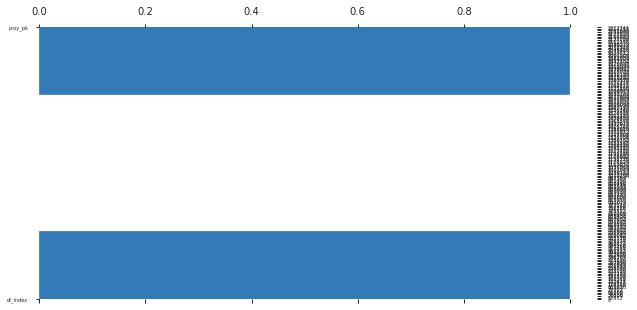

In [91]:
profile.to_file(output_file="reportedata.html") 

In [96]:
data.info(verbose = True, null_counts = True, buf=None, max_cols=None, memory_usage=None, show_counts=None)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12952 entries, 0 to 15763
Data columns (total 172 columns):
 #    Column                            Non-Null Count  Dtype  
---   ------                            --------------  -----  
 0    proy_pk                           12952 non-null  int64  
 1    proy_area_fk                      12952 non-null  int64  
 2    proy_usr_adjunto_fk               12952 non-null  int64  
 3    proy_usr_sponsor_fk               12952 non-null  int64  
 4    proy_usr_gerente_fk               12952 non-null  int64  
 5    proy_usr_pmofed_fk                12952 non-null  float64
 6    proy_prog_fk                      9196 non-null   float64
 7    proy_cro_fk                       12952 non-null  float64
 8    proy_pre_fk                       12920 non-null  float64
 9    proy_proyindices_fk               12952 non-null  int64  
 10   proy_peso                         12952 non-null  int64  
 11   proy_descripcion                  11229 non-null  st

# Recomendaciones: 
Generar dataset con el fin de particionar el analsis: Lecciones aprendidas, riesgos, programas y otro con datos del proyecto.

# Analisis de Riesgos

Debajo en base al analisis se seleccionaron las columnas de Riesgo para realizar este analisis nos basamos en el profile, en base a los datos estadisticos del profile.

In [97]:
riesgos= data[['proy_pk','risk_pk','risk_nombre','risk_fecha_actu','risk_probabilidad','risk_impacto','risk_ent_fk','risk_fecha_limite','risk_efecto','risk_estategia','risk_disparador','risk_contingencia','risk_fecha_superado','risk_usuario_superado_fk','risk_exposicion']]


In [98]:
riesgos.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12952 entries, 0 to 15763
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   proy_pk                   12952 non-null  int64  
 1   risk_pk                   11600 non-null  float64
 2   risk_nombre               11600 non-null  string 
 3   risk_fecha_actu           11600 non-null  object 
 4   risk_probabilidad         11600 non-null  float64
 5   risk_impacto              11600 non-null  float64
 6   risk_ent_fk               7251 non-null   float64
 7   risk_fecha_limite         11600 non-null  object 
 8   risk_efecto               7697 non-null   string 
 9   risk_estategia            7075 non-null   string 
 10  risk_disparador           4694 non-null   string 
 11  risk_contingencia         2581 non-null   string 
 12  risk_fecha_superado       10424 non-null  string 
 13  risk_usuario_superado_fk  10424 non-null  float64
 14  risk_e

In [99]:
riesgos.sample(10)

,proy_pk,risk_pk,risk_nombre,risk_fecha_actu,risk_probabilidad,risk_impacto,risk_ent_fk,risk_fecha_limite,risk_efecto,risk_estategia,risk_disparador,risk_contingencia,risk_fecha_superado,risk_usuario_superado_fk,risk_exposicion
7871,1741,915.0,No disponibilidad de infraestructura de comuni...,2016-03-10 00:00:00,40.0,8.0,NaN,2016-02-29 00:00:00,<NA>,<NA>,<NA>,<NA>,2016-03-10 00:00:00,240.0,3.0
8166,1741,2138.0,Atrasos en desarrollo de nuevos requerimientos,2016-11-23 00:00:00,20.0,8.0,15396.0,2016-11-23 00:00:00,<NA>,<NA>,<NA>,<NA>,2016-11-23 00:00:00,240.0,2.0
12095,1904,1819.0,Dificultades en publicacin web,2016-08-24 00:00:00,20.0,4.0,17938.0,2016-08-26 00:00:00,Demora en la publicacin y difusin de los trmit...,Seguimiento cercano Asesoramiento por parte de...,<NA>,<NA>,2016-08-24 00:00:00,105.0,1.0
1273,607,252.0,Cambio de autoridades impactan en la publicaci...,2015-02-25 00:00:00,60.0,8.0,NaN,2015-03-31 00:00:00,No se publican los formularios en el sitio del...,<NA>,<NA>,<NA>,2015-02-25 00:00:00,240.0,5.0
6224,502,230.0,Coordinacin con DNIC,2015-08-18 00:00:00,40.0,6.0,NaN,2015-07-31 00:00:00,Prdida de una fuente de identificacin nacional,Reunin de Direccin de Saluduy con autoridades ...,Falta de respuesta de DNIC,Gestionar Directorio de Saluduy,2015-08-18 00:00:00,164.0,2.0
1272,607,252.0,Cambio de autoridades impactan en la publicaci...,2015-02-25 00:00:00,60.0,8.0,NaN,2015-03-31 00:00:00,No se publican los formularios en el sitio del...,<NA>,<NA>,<NA>,2015-02-25 00:00:00,240.0,5.0
233,232,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,<NA>,<NA>,<NA>,<NA>,<NA>,NaN,NaN
3072,2332,3537.0,23320 Probabilidad de No alcanzar la meta,2019-04-24 00:00:00,20.0,2.0,NaN,2019-02-01 00:00:00,<NA>,<NA>,<NA>,<NA>,<NA>,NaN,0.0
3975,3625,2939.0,Que no haya disponibilidad de tiempo para ejec...,2019-01-10 00:00:00,60.0,8.0,NaN,2018-10-30 00:00:00,<NA>,<NA>,<NA>,<NA>,2019-01-10 00:00:00,1.0,5.0
9552,1741,2216.0,No lograr Atestacin en versin 20,2017-04-24 00:00:00,20.0,6.0,15396.0,2017-07-31 00:00:00,<NA>,<NA>,<NA>,<NA>,<NA>,NaN,1.0


In [104]:
riesgos.sample(5)

,proy_pk,risk_pk,risk_nombre,risk_fecha_actu,risk_probabilidad,risk_impacto,risk_ent_fk,risk_fecha_limite,risk_efecto,risk_estategia,risk_disparador,risk_contingencia,risk_fecha_superado,risk_usuario_superado_fk,risk_exposicion
9027,1741,912.0,Cambios en tecnologas de la solucin,2015-12-08 00:00:00,80.0,8.0,NaN,2015-12-31 00:00:00,Demoras en el desarrollo,<NA>,<NA>,<NA>,2015-12-08 00:00:00,240.0,6.0
3863,3314,3168.0,R0 Riesgo de NO cumplimiento de Meta,2018-06-28 00:00:00,40.0,6.0,NaN,2018-12-28 00:00:00,<NA>,<NA>,No conseguir establecer una mesa de trabajo co...,<NA>,2018-06-28 00:00:00,891.0,2.0
13205,1904,1328.0,Cambios a Formulario de Registro de Instituciones,2016-04-29 00:00:00,40.0,4.0,17929.0,2016-04-25 00:00:00,Cambios pedidos no cumplen requerimientos de a...,Reunin conjunta con proveedor oficinas del MEC...,Falta de acuerdo entre lo producido por el LAB...,<NA>,2016-04-29 00:00:00,105.0,2.0
9121,1741,1386.0,No disponibilidad de la infraestructura en pro...,2016-06-15 00:00:00,40.0,4.0,15396.0,2016-06-17 00:00:00,<NA>,<NA>,<NA>,<NA>,2016-06-15 00:00:00,240.0,2.0
10732,1904,1580.0,Fallas en Gateway de Pagos en Produccin,2016-06-21 00:00:00,20.0,4.0,17938.0,2016-06-21 00:00:00,Retrasos por ajustes que se tengan que dar en ...,Anticipar todos los posibles errores conocidos...,Errores en las transacciones pagas en ambiente...,<NA>,2016-06-21 00:00:00,105.0,1.0


In [101]:
riesgos.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12952 entries, 0 to 15763
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   proy_pk                   12952 non-null  int64  
 1   risk_pk                   11600 non-null  float64
 2   risk_nombre               11600 non-null  string 
 3   risk_fecha_actu           11600 non-null  object 
 4   risk_probabilidad         11600 non-null  float64
 5   risk_impacto              11600 non-null  float64
 6   risk_ent_fk               7251 non-null   float64
 7   risk_fecha_limite         11600 non-null  object 
 8   risk_efecto               7697 non-null   string 
 9   risk_estategia            7075 non-null   string 
 10  risk_disparador           4694 non-null   string 
 11  risk_contingencia         2581 non-null   string 
 12  risk_fecha_superado       10424 non-null  string 
 13  risk_usuario_superado_fk  10424 non-null  float64
 14  risk_e

In [102]:
riesgos.describe()

,proy_pk,risk_pk,risk_probabilidad,risk_impacto,risk_ent_fk,risk_usuario_superado_fk,risk_exposicion
count,12952.000000,11600.000000,11600.000000,11600.000000,7251.000000,10424.000000,11600.000000
mean,2085.210778,1719.156207,45.646552,5.447241,22821.571094,245.168266,2.502586
std,1329.488010,1027.055715,25.003407,2.383228,11778.235715,207.088495,1.901396
min,1.000000,1.000000,20.000000,2.000000,4394.000000,1.000000,0.000000
25%,1741.000000,1287.000000,20.000000,4.000000,17739.000000,105.000000,1.000000
50%,1904.000000,1406.000000,40.000000,6.000000,17938.000000,240.000000,2.000000
75%,2092.000000,2167.000000,60.000000,8.000000,21622.000000,240.000000,4.000000
max,7476.000000,5272.000000,100.000000,10.000000,68032.000000,1319.000000,10.000000


<Figure size 720x576 with 0 Axes>

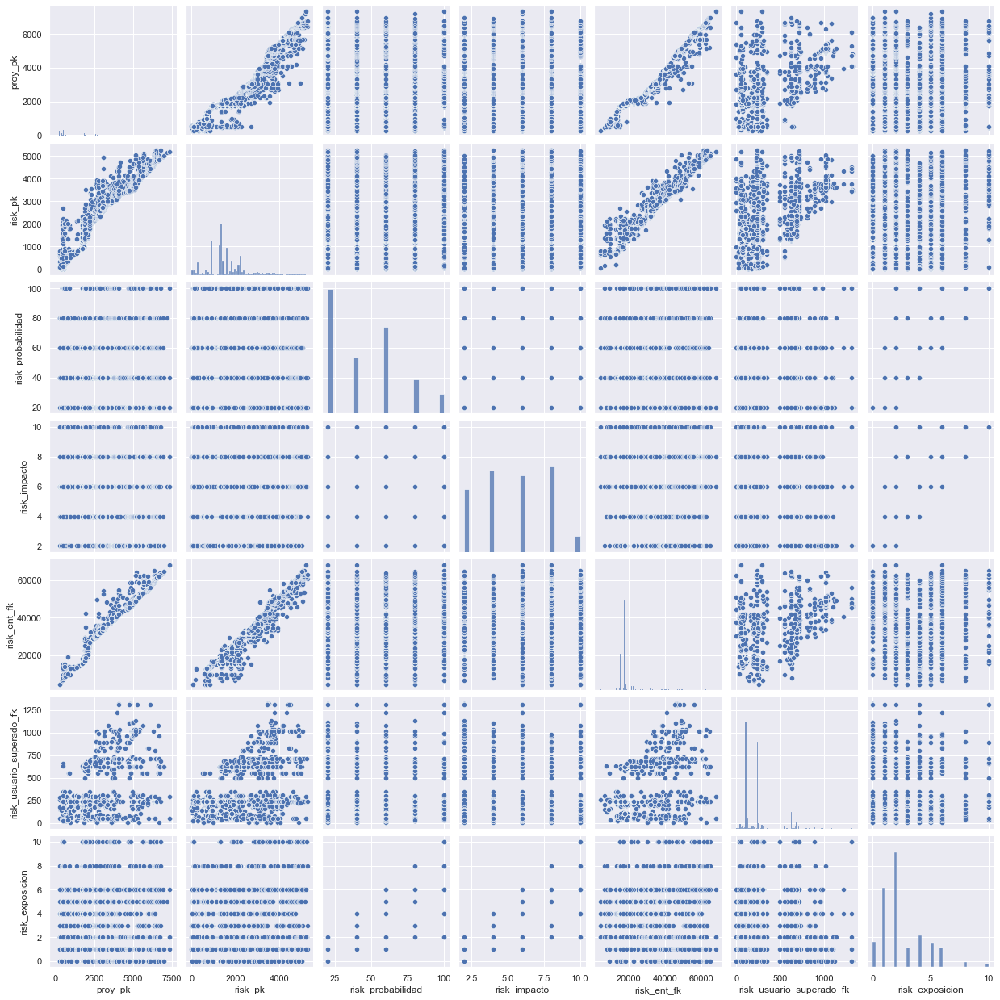

In [112]:
plt.figure(figsize=((10,8)))
sns.pairplot(data=riesgos)
plt.show()

In [116]:

riesgos.corr()["proy_pk"]

proy_pk                     1.000000
risk_pk                     0.920339
risk_probabilidad          -0.016422
risk_impacto               -0.067685
risk_ent_fk                 0.974067
risk_usuario_superado_fk    0.393826
risk_exposicion            -0.005537
Name: proy_pk, dtype: float64

In [117]:
riesgos_corr = riesgos.corr().transpose()
riesgos_corr

,proy_pk,risk_pk,risk_probabilidad,risk_impacto,risk_ent_fk,risk_usuario_superado_fk,risk_exposicion
proy_pk,1.000000,0.920339,-0.016422,-0.067685,0.974067,0.393826,-0.005537
risk_pk,0.920339,1.000000,-0.032820,-0.068581,0.913971,0.429769,-0.000943
risk_probabilidad,-0.016422,-0.032820,1.000000,-0.012782,-0.074601,-0.003657,0.673085
risk_impacto,-0.067685,-0.068581,-0.012782,1.000000,0.106109,0.208739,0.644831
risk_ent_fk,0.974067,0.913971,-0.074601,0.106109,1.000000,0.464230,0.086849
risk_usuario_superado_fk,0.393826,0.429769,-0.003657,0.208739,0.464230,1.000000,0.172702
risk_exposicion,-0.005537,-0.000943,0.673085,0.644831,0.086849,0.172702,1.000000


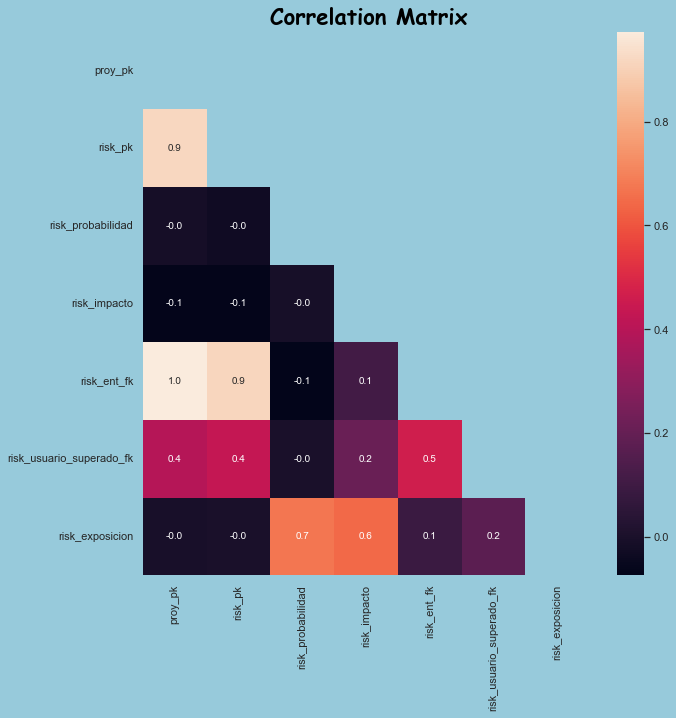

In [118]:
# Using a different way of correlation matrix

background_color = "#97CADB"

fig = plt.figure(figsize=(10,10))
gs = fig.add_gridspec(1,1)
gs.update(wspace=0.3, hspace=0.15)
ax0 = fig.add_subplot(gs[0,0])
fig.patch.set_facecolor(background_color) 
ax0.set_facecolor(background_color) 

# train_data_corr = train_data[['Age', 'Fare', 'SibSp', 'Parch', 'Pclass','Survived']].corr().transpose()
mask = np.triu(np.ones_like(riesgos_corr))
ax0.text(2,-0.1,"Correlation Matrix",fontsize=22, fontweight='bold', fontfamily='cursive', color="#000000")
sns.heatmap(riesgos_corr ,mask=mask,fmt=".1f",annot=True)
plt.show()

Se puede observar que la pk_proyecto esta relacionada en 0.9 por la pk de riesgos donde exite una correlacion positiva alta, si cambia una tiene un impacto directo en la otra variable.

In [39]:
riesgos2=riesgos[riesgos['risk_nombre'].str.contains('Desarrollo|pago|Gateway|equipo|soluciones|ws|integracion|proyectos|pasarela|pagos|produccin|dificultades|autoridades|asignacin|disponibilidad|sponsor|retrasos|demoras|autoridades|organismo|proveedor|institucin|institucion|involucramiento|fallas|dificultades|publicacin|personal|cambios|gestion|clave|recursos|contrataciones|compras|adquisiciones|personal|infraestructura', case=False)]

In [40]:
riesgos2.isna().sum()

proy_pk                        0
risk_pk                        0
risk_nombre                    0
risk_fecha_actu                0
risk_probabilidad              0
risk_impacto                   0
risk_ent_fk                 2042
risk_fecha_limite              0
risk_efecto                 1335
risk_estategia              1679
risk_disparador             2837
risk_contingencia           4392
risk_fecha_superado          222
risk_usuario_superado_fk     222
risk_exposicion                0
dtype: int64

Proyecto tiene una alta correlacion con los riesgos de los entregables. Posee una alta correlacion negativa riesgos con exposicon al riesgo.

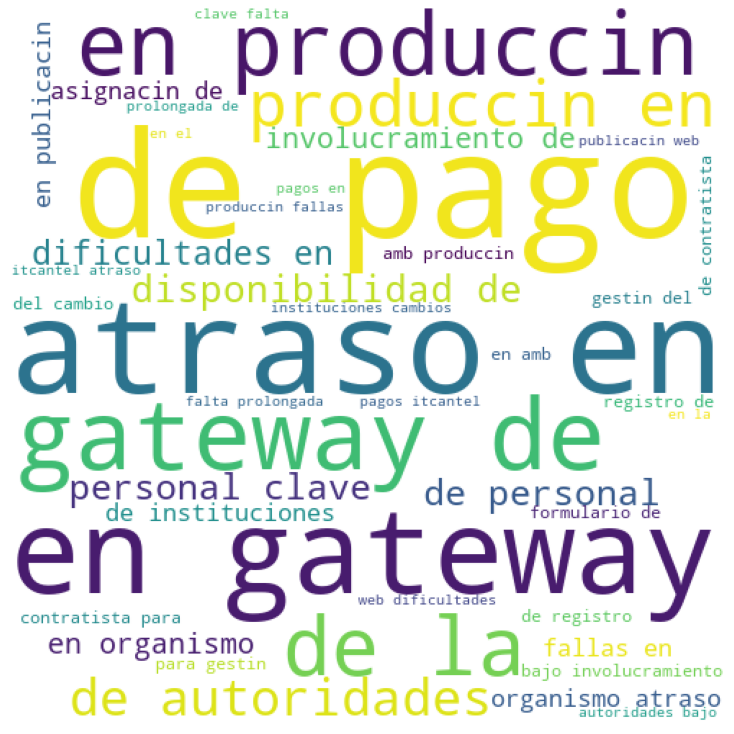

In [41]:
#Nube de palabras para “Group of weather parameters“.
# Python program to generate WordCloud
comment_words = ''
stopwords = set(STOPWORDS)
# iterate through the csv file
for val in riesgos2.risk_nombre:
# typecaste each val to string
    val = str(val)
# split the value
    tokens = val.split()
# Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()   
    comment_words += " ".join(tokens)+" "
wordcloud = WordCloud(width = 500, height = 500,
                    background_color ='white',
                    stopwords = stopwords,
                    min_font_size = 10).generate(comment_words)
# plot the WordCloud image
plt.figure(figsize = (10, 10), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

En este caso lo que podemos identificar son los riesgos mas alto:
1.Atraso en los pagos
2.Atraso en los proyectos
3.Demoras en la pasarela de pagos
4.Bajo involucramiento de autoridades
5.Fallas en el ambiente de produccion
6.Demoras en el inicio de proyecto 
7.Demoras en la asignacion de recursos al proyecto 
8.Demoras en las contrataciones
9.Demoras en las publicaciones
10.Cambio de personal
11.Bajo involucramiento
12.Bajo gestion de dificulades
13.Ausencia de personal clave

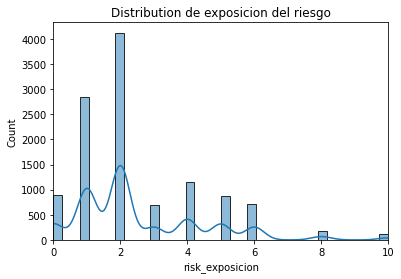

In [42]:
sns.histplot(data=riesgos, x="risk_exposicion", kde=True)
plt.title('Distribution de exposicion del riesgo')
plt.xlim(0, 10)
plt.show()

Los intervalos de exposicion del riesgo segun siges son 0 - 1.5 es un riesgo verde, 1.5 - 5.9 es un riesgo amarillo, y luego de 6-10 es un riesgo rojo. Visualizamos que tenemos 2.800 registros con riesgo verde, superior a 4000 con riesgo amarillo y aproximadamente 700 registros con riesgo rojo. El 6% de los registros que tiene riesgos son riesgos altos(rojos). El 57% de los registros con riesgo son medios. Y los restantes 37% son de riesgo bajo en verde. 

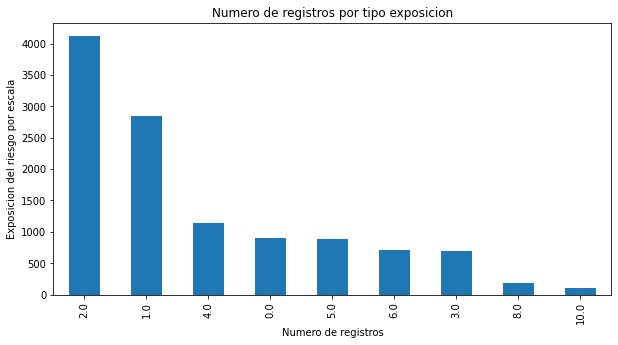

In [45]:
riesgos.risk_exposicion.value_counts().nlargest(40).plot(kind='bar', figsize=(10,5))
plt.title('Numero de registros por tipo exposicion')
plt.ylabel('Exposicion del riesgo por escala')
plt.xlabel('Numero de registros');

In [61]:
riesgos.describe(include='all')

,proy_pk,risk_pk,risk_nombre,risk_fecha_actu,risk_probabilidad,risk_impacto,risk_ent_fk,risk_fecha_limite,risk_efecto,risk_estategia,risk_disparador,risk_contingencia,risk_fecha_superado,risk_usuario_superado_fk,risk_exposicion
count,12952.000000,11600.000000,11600,11600,11600.000000,11600.000000,7251.000000,11600,7697,7075,4694,2581,10424,10424.000000,11600.000000
unique,NaN,NaN,2278,951,NaN,NaN,NaN,747,1048,1061,719,680,770,NaN,NaN
top,NaN,NaN,Dificultades en publicacin web,2016-06-21 00:00:00,NaN,NaN,NaN,2016-06-21 00:00:00,Si hay bajo apoyo de las Autoridades del Organ...,Determinar camino crtico en plan de trabajo pa...,Enfermedades clima et,Reunin con DGS y rea de Comunicaciones del MEC...,2016-06-21 00:00:00,NaN,NaN
freq,NaN,NaN,384,779,NaN,NaN,NaN,768,384,400,384,384,772,NaN,NaN
mean,2085.210778,1719.156207,NaN,NaN,45.646552,5.447241,22821.571094,NaN,NaN,NaN,NaN,NaN,NaN,245.168266,2.502586
std,1329.488010,1027.055715,NaN,NaN,25.003407,2.383228,11778.235715,NaN,NaN,NaN,NaN,NaN,NaN,207.088495,1.901396
min,1.000000,1.000000,NaN,NaN,20.000000,2.000000,4394.000000,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,0.000000
25%,1741.000000,1287.000000,NaN,NaN,20.000000,4.000000,17739.000000,NaN,NaN,NaN,NaN,NaN,NaN,105.000000,1.000000
50%,1904.000000,1406.000000,NaN,NaN,40.000000,6.000000,17938.000000,NaN,NaN,NaN,NaN,NaN,NaN,240.000000,2.000000
75%,2092.000000,2167.000000,NaN,NaN,60.000000,8.000000,21622.000000,NaN,NaN,NaN,NaN,NaN,NaN,240.000000,4.000000


In [62]:
len(riesgos['proy_pk'].unique())

1725

In [63]:
#Lista cuantos proyectos hay con riesgos altos
riesgos_altos=riesgos[riesgos['risk_exposicion']>= 6.0]
len(riesgos_altos['proy_pk'].unique())




236

En este caso hay 236 proyectos con riesgos altos que representan el 14% de la cartera total de proyectos.
El 14% de los proyectos posee altos riesgos.

In [64]:
len(riesgos['risk_ent_fk'].unique())

1227

In [65]:
#Lista cuantos proyectos hay con riesgos altos
entregables_riesgos_altos=riesgos[riesgos['risk_exposicion']>= 6.0]
len(riesgos_altos['risk_ent_fk'].unique())


253

El 20.6% de los entregables que contienen riesgos son altos, donde se aplica la ley del paleto 80 a 20.

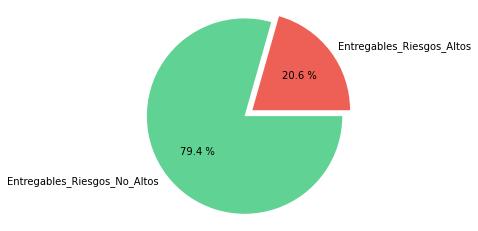

In [69]:
riesgos= [20.6,79.4]
nombres = ["Entregables_Riesgos_Altos","Entregables_Riesgos_No_Altos"]
colores = ["#EE6055","#60D394"]
desfase = (0, 0.1)
plt.pie(riesgos, labels=nombres, autopct="%0.1f %%", colors=colores, explode=desfase)
plt.axis("equal")
plt.show()

In [190]:
len(riesgos['risk_pk'].unique()) 


2896

In [189]:
len(riesgos['risk_estategia'].unique()) 

1062

El 36.67% de los riesgos poseen una estrategia de respuesta.

In [192]:
len(riesgos['risk_contingencia'].unique()) 

681

El 23.51% posee contigencia por lo tanto son riesgos que su respuesta es la aceptacion.
Asimismo se observa que el 40% no tiene respuesta de ningun tipo, se recomienda revisar los mismos

# Resumen del Analisis de Riesgos:
Se analizaron 15 variables de las cuales representan 12952 riesgos. Lo motivos de los riesgos en base a una nube de palabra se pude detectar 13 riesgos que resaltan, apriori parecen pocos en base a la cantidad de registros asimismo la distribucio de los riesgos parece con una distribucion a conciencia donde el 37% son riesgos bajos, el 57% son riesgos medios y finalmente el 6% son riesgos altos. Asimismo cuando analizamos los riesgos altos el 14$ de los proyectos poseen riesgos altos, Con respecto a los entregables son el 20.6%, posee una distribucion pareto. Con respecto a la estrategia el 36.67% posee respuesta el 23.67% contigencia, lo que se traduce que un 40% de los riesgos no posee respuesta. 
# Recomendaciones
1. Mejorar el registro de riesgos mas exhaustivo y con mayor detalle, dado que solo 13 representan los mas aplicados.
2. El promedio da entre 7 y 8 riesgos por proyecto se visualiza pocos riesgos por proyectos.
3. Se recomienda tener indvidualizadas las oportunidades por alguna forma
4. Seria bueno tener una categorizacion de los riesgos estandarizada.
5. Se recomienda generar respuesta a los riesgos dado que el 40% no se tiene.
6. Mantener los criterios de ponderacion de los riesgos dado que su distribucion es adecuada.



# Analisis de Lecciones Aprendidas 

A continuacion se muestra el analisis de las lecciones aprendidas de los proyectos:

In [70]:
lecciones_app=data[['proy_pk','con_padre_fk','con_org_fk','con_nombre','con_pk','lecaprcon_con_fk','lecaprcon_lecapr_fk','lecapr_pk','lecapr_tipo_fk','lecapr_usr_fk','lecapr_fecha','lecapr_desc','tipolec_lecc_apre_pk','tipolec_lecc_apre_codigo','tipolec_lecc_apre_nombre']]


In [71]:
lecciones_app.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12952 entries, 0 to 15763
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   proy_pk                   12952 non-null  int64  
 1   con_padre_fk              4442 non-null   float64
 2   con_org_fk                4442 non-null   float64
 3   con_nombre                4442 non-null   string 
 4   con_pk                    4442 non-null   float64
 5   lecaprcon_con_fk          4442 non-null   float64
 6   lecaprcon_lecapr_fk       4442 non-null   float64
 7   lecapr_pk                 4601 non-null   float64
 8   lecapr_tipo_fk            4601 non-null   float64
 9   lecapr_usr_fk             4601 non-null   float64
 10  lecapr_fecha              4601 non-null   string 
 11  lecapr_desc               4601 non-null   string 
 12  tipolec_lecc_apre_pk      4601 non-null   float64
 13  tipolec_lecc_apre_codigo  4601 non-null   string 
 14  tipole

In [32]:
lecciones_app.sample(5)

,proy_pk,con_padre_fk,con_org_fk,con_nombre,con_pk,lecaprcon_con_fk,lecaprcon_lecapr_fk,lecapr_pk,lecapr_tipo_fk,lecapr_usr_fk,lecapr_fecha,lecapr_desc,tipolec_lecc_apre_pk,tipolec_lecc_apre_codigo,tipolec_lecc_apre_nombre
11769,1904,406.0,15.0,Cronograma,438.0,438.0,739.0,739.0,1.0,30.0,2016-08-29 00:00:00,2Evitar tiempo excesivo entre relevamientos e ...,1.0,AEVITAR,Evitar
3093,2365,NaN,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,<NA>,NaN,<NA>,<NA>
48,49,NaN,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,<NA>,NaN,<NA>,<NA>
682,475,NaN,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,<NA>,NaN,<NA>,<NA>
4978,5489,NaN,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,<NA>,NaN,<NA>,<NA>


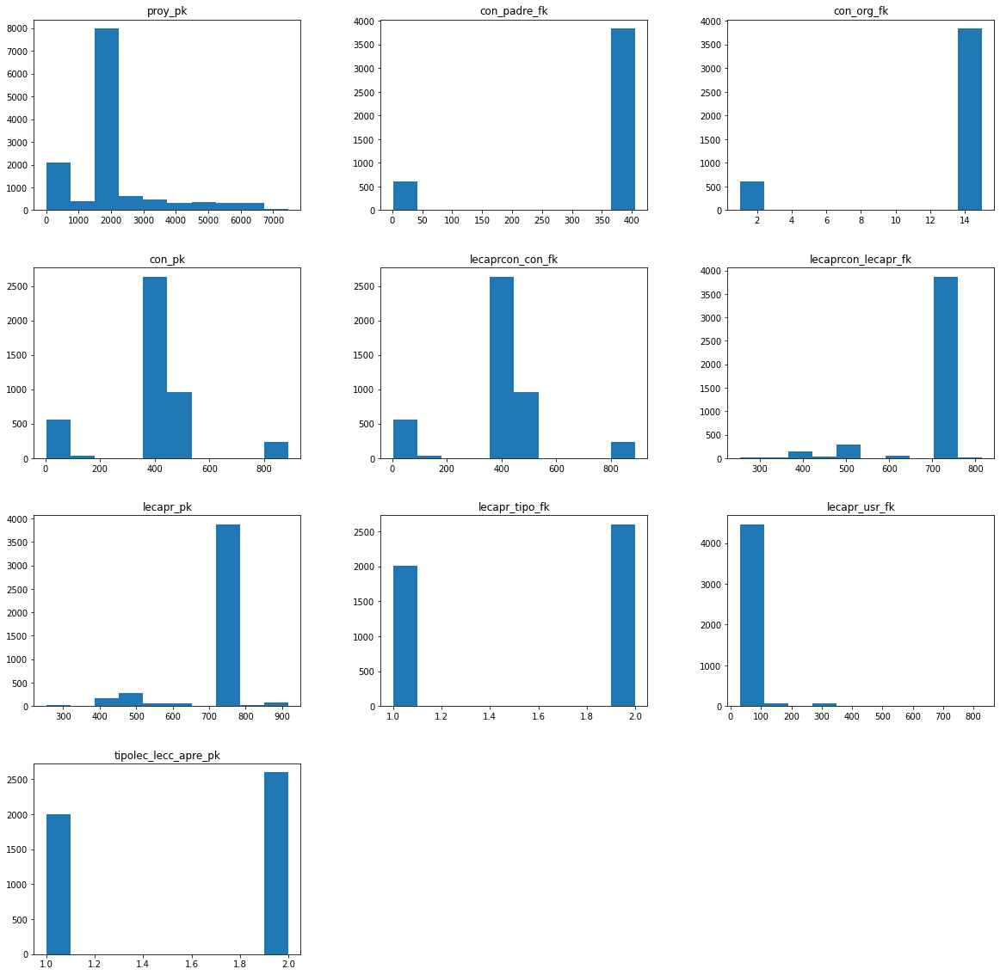

In [37]:
lecciones_app.hist(bins=10,figsize=(20,20),grid=False);

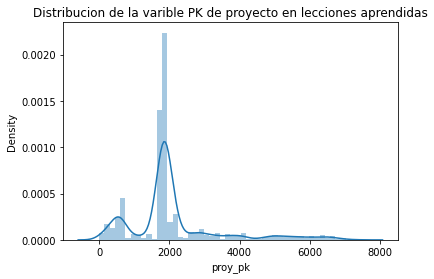

In [72]:
sns.distplot(lecciones_app['proy_pk'])
plt.title('Distribucion de la varible PK de proyecto en lecciones aprendidas')
plt.show()

(0.0, 2.0519744931744195)

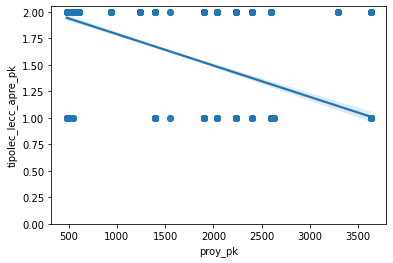

In [73]:
# View if there is a linear relation between continuous numerical variable Fare & target variable Survived.

sns.regplot(x = "proy_pk", y = "tipolec_lecc_apre_pk", data = lecciones_app)
plt.ylim(0,)

In [74]:
df_indice_recet1=lecciones_app.reset_index()

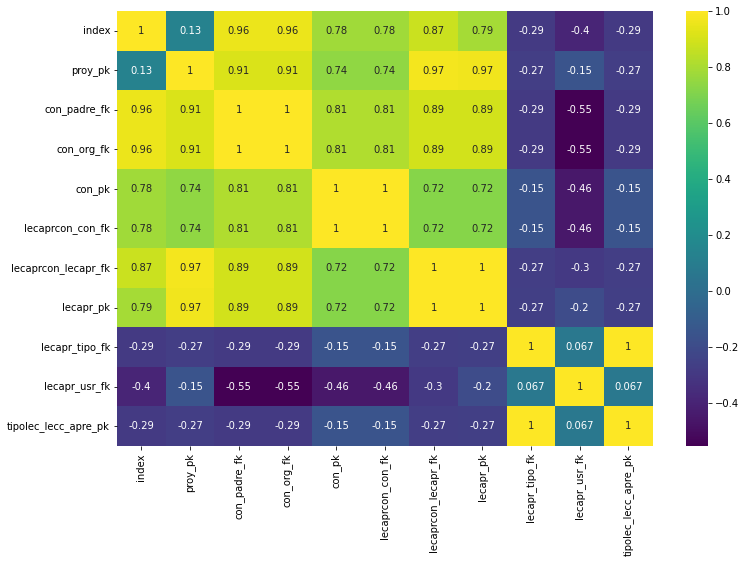

In [75]:
plt.figure(figsize=(12, 8))
sns.heatmap(df_indice_recet1.corr(), annot=True, cmap='viridis')
plt.show()

En la matriz se observa que lecciones aprendidas con proyecto_pk tiene una correlacion de 0.97

En base a la matriz de correlacion las areas de conocimiento y lecciones aprendidas posee una lata correlacion positiva de  0.91, dado eso se analizan debajo. Tambien se relacionan de igual manera con Organismo pero como es AGESIC y tramites decsrtamos el analisis. 

Variables Categoricas repetir y evitar

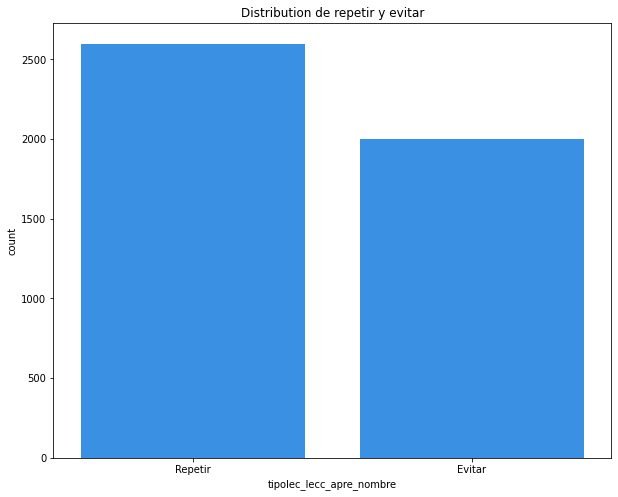

In [35]:
plt.figure(figsize=(10,8))
plt.title('Distribution de repetir y evitar')
d0 = sns.countplot(data=df_indice_recet1, x='tipolec_lecc_apre_nombre', color='dodgerblue')

In [27]:
data['tipolec_lecc_apre_nombre'].value_counts() 

Repetir    2598
Evitar     2003
Name: tipolec_lecc_apre_nombre, dtype: Int64

Se observa que las lecciones de repetir simbolizan un 61% de total por lo tanto tiene una orientacion positiva al realizarse. Mientras que las de evitar representan un 39%.

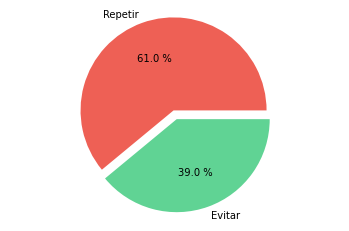

In [258]:
lecciones = [61,39]
nombres = ["Repetir","Evitar"]
colores = ["#EE6055","#60D394"]
desfase = (0, 0.1)
plt.pie(lecciones, labels=nombres, autopct="%0.1f %%", colors=colores, explode=desfase)
plt.axis("equal")
plt.show()

In [251]:
lecciones_app1=lecciones_app[lecciones_app['lecapr_desc'].str.contains('Involucrar|personas|organismo|personal|clave|motivado|tiempos|excesivos|implantaciones', case=False)]

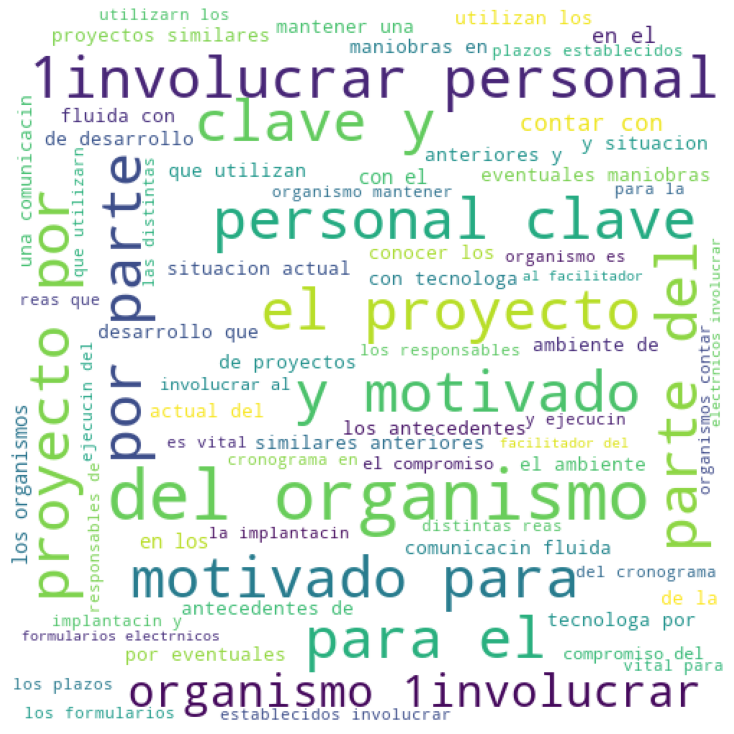

In [253]:
#Nube de palabras para “Group of weather parameters“.
# Python program to generate WordCloud
comment_words = ''
stopwords = set(STOPWORDS)
# iterate through the csv file
for val in lecciones_app1.lecapr_desc:
# typecaste each val to string
    val = str(val)
# split the value
    tokens = val.split()
# Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()   
    comment_words += " ".join(tokens)+" "
wordcloud = WordCloud(width = 500, height = 500,
                    background_color ='white',
                    stopwords = stopwords,
                    min_font_size = 10).generate(comment_words)
# plot the WordCloud image
plt.figure(figsize = (10, 10), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

Se observa de las lecciones aprendidas tiene un alta vinculacion con los tipos de riesgos que se mencionan:
1. Involucrar a las personas y al organismo.
2. Tener el personal clave
3. Evitar destinar tiempos excesivos
4. Evitar implantaciones por parte del organismo
5. Motivar al personal


In [254]:
lecciones_app2=lecciones_app[lecciones_app['con_nombre'].str.contains('Liderazgo|Humanos|Cronograma|Implantacin|Riesgos|Calidad|Costos|Alcance|Plazos|Comunicaciones|Requerimiento|Recursos', case=False)]

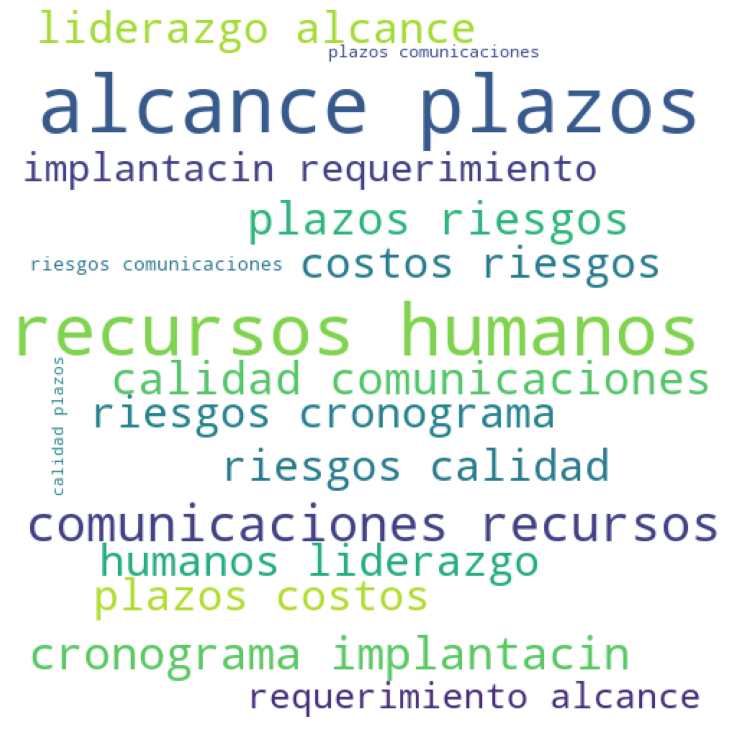

In [255]:
#Nube de palabras para “Group of weather parameters“.
# Python program to generate WordCloud
comment_words = ''
stopwords = set(STOPWORDS)
# iterate through the csv file
for val in lecciones_app2.con_nombre:
# typecaste each val to string
    val = str(val)
# split the value
    tokens = val.split()
# Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()   
    comment_words += " ".join(tokens)+" "
wordcloud = WordCloud(width = 500, height = 500,
                    background_color ='white',
                    stopwords = stopwords,
                    min_font_size = 10).generate(comment_words)
# plot the WordCloud image
plt.figure(figsize = (10, 10), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

De las lecciones aprendidas las areas de conocimiento que se destacan son:
1. Liderazgo
2. Gestiona Humana
3. Alcance 
4. Comunicaciones
5. Tiempos (Cronograma,plazos)
6. Riesgo
7. Calidad
8. Costos

Resumen:

Se analizaron 15 variables con 12925 registros donde, el 61% las lecciones Aprendidas con de repetir lo que tienen una tendencia positiva y 39% Evitar. De la nube de palabras se observa 5 que son las que se replican con 10 categorias de agrupacion.

Recomendacion: Se recomienda revisar la documentacion de las lecciones aprendidas asi como el proceso de generacion de las mismas.

# Analisis de la Tabla Progama

A continuacion se realiza el EDA de programas

In [125]:
programa=data[['prog_usr_sponsor_fk','prog_usr_pmofed_fk','prog_progindices_fk','prog_nombre','prog_descripcion','prog_objetivo','prog_obj_publico','prog_semaforo_amarillo','prog_semaforo_rojo','prog_activo','prog_fecha_crea','prog_fecha_act','prog_id_migrado','prog_habilitado','est_prog_pk','est_prog_codigo','est_prog_nombre','est_prog_orden_proceso','obj_est_prog_descripcion','prog_usu_id_adjunto','prog_usu_cod_adjunto','prog_usu_primer_apellido_adjunto','prog_usu_primer_nombre_adjunto','prog_usu_id_gerente','prog_usu_cod_gerente','prog_usu_primer_apellido_gerente','prog_usu_primer_nombre_gerente','prog_usu_id_pmofed','prog_usu_cod_pmofed','prog_usu_primer_apellido_pmofed','prog_usu_primer_nombre_pmofed','prog_usu_id_sponsor','prog_usu_cod_sponsor','prog_usu_primer_apellido_sponsor','prog_usu_primer_nombre_sponsor',]]


In [117]:
programa.info(verbose = True, null_counts = True, buf=None, max_cols=None, memory_usage=None, show_counts=None)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12952 entries, 0 to 15763
Data columns (total 35 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   prog_usr_sponsor_fk               9196 non-null   float64
 1   prog_usr_pmofed_fk                9196 non-null   float64
 2   prog_progindices_fk               9196 non-null   float64
 3   prog_nombre                       9196 non-null   string 
 4   prog_descripcion                  7619 non-null   string 
 5   prog_objetivo                     8153 non-null   string 
 6   prog_obj_publico                  7713 non-null   string 
 7   prog_semaforo_amarillo            9196 non-null   float64
 8   prog_semaforo_rojo                9196 non-null   float64
 9   prog_activo                       9196 non-null   float64
 10  prog_fecha_crea                   7322 non-null   object 
 11  prog_fecha_act                    9196 non-null   object 
 12  prog

In [118]:
programa.sample(5)

,prog_usr_sponsor_fk,prog_usr_pmofed_fk,prog_progindices_fk,prog_nombre,prog_descripcion,prog_objetivo,prog_obj_publico,prog_semaforo_amarillo,prog_semaforo_rojo,prog_activo,...,prog_usu_primer_apellido_gerente,prog_usu_primer_nombre_gerente,prog_usu_id_pmofed,prog_usu_cod_pmofed,prog_usu_primer_apellido_pmofed,prog_usu_primer_nombre_pmofed,prog_usu_id_sponsor,prog_usu_cod_sponsor,prog_usu_primer_apellido_sponsor,prog_usu_primer_nombre_sponsor
1976,139.0,50.0,44.0,Soluciones Reutilizables de eGobierno,pp,pp,pp,60.0,90.0,1.0,...,Alamos,Dahiana,50.0,danielaconza,Conza,Daniela,139.0,karimeruibal,Ruibal,Karime
490,54.0,22.0,64.0,Consolidacin TI del Estado 2013,<NA>,<NA>,<NA>,7.0,10.0,1.0,...,Martnez,Claudio,22.0,andressaavedra,Saavedra,Andrs,54.0,diamelabello,Bello,Diamela
10691,165.0,136.0,249.0,Implantacin Piloto,p Descp,p Objetivop,p Beneficiop,10.0,20.0,1.0,...,Garcn,Gustavo,136.0,juanpablogarcia,Garca,Juan Pablo,165.0,marceloguinovart,Guinovart,Marcelo
2927,165.0,20.0,236.0,Inicio de Todos los Trmites de la Administraci...,p Lograr que se puedan iniciar por Internet to...,p Disponibilizar en liacutenea el inicio de to...,p Ciudadaniacutea en general y organismos de l...,10.0,20.0,1.0,...,Cedrani,Federico,20.0,analauragomez,Gmez,Ana Laura,165.0,marceloguinovart,Guinovart,Marcelo
10856,165.0,136.0,249.0,Implantacin Piloto,p Descp,p Objetivop,p Beneficiop,10.0,20.0,1.0,...,Garcn,Gustavo,136.0,juanpablogarcia,Garca,Juan Pablo,165.0,marceloguinovart,Guinovart,Marcelo


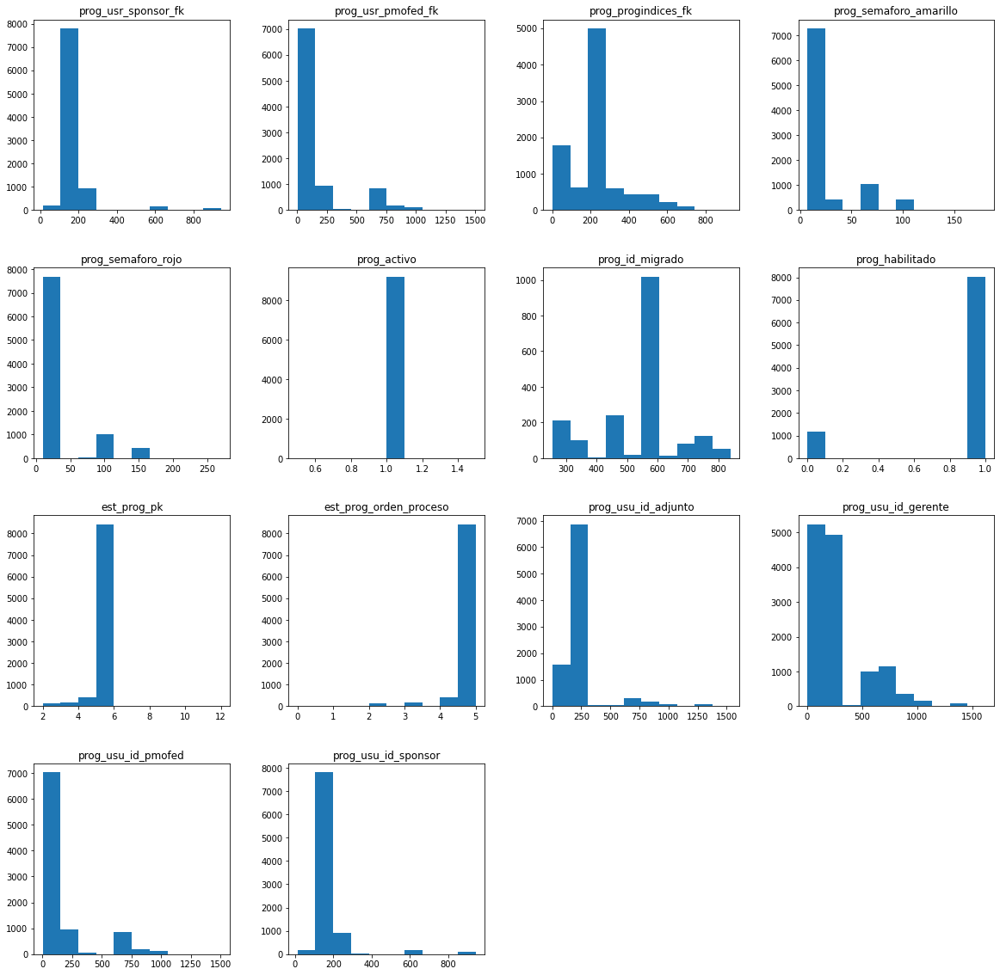

In [119]:
programa.hist(bins=10,figsize=(20,20),grid=False);

In [126]:
#Drop irrelevant columns in train data

drop_cols = ['prog_usr_sponsor_fk','prog_usr_pmofed_fk', 'prog_usu_id_adjunto', 'prog_usu_primer_apellido_sponsor','prog_usu_primer_nombre_sponsor','prog_semaforo_amarillo','prog_semaforo_rojo','prog_activo','prog_id_migrado','prog_usu_id_adjunto','prog_usu_id_sponsor','prog_usu_id_gerente','prog_usu_id_pmofed']
programa.drop(drop_cols, axis = 1, inplace = True)

C:\Users\perez\AppData\Local\Temp\ipykernel_20156\3052372219.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



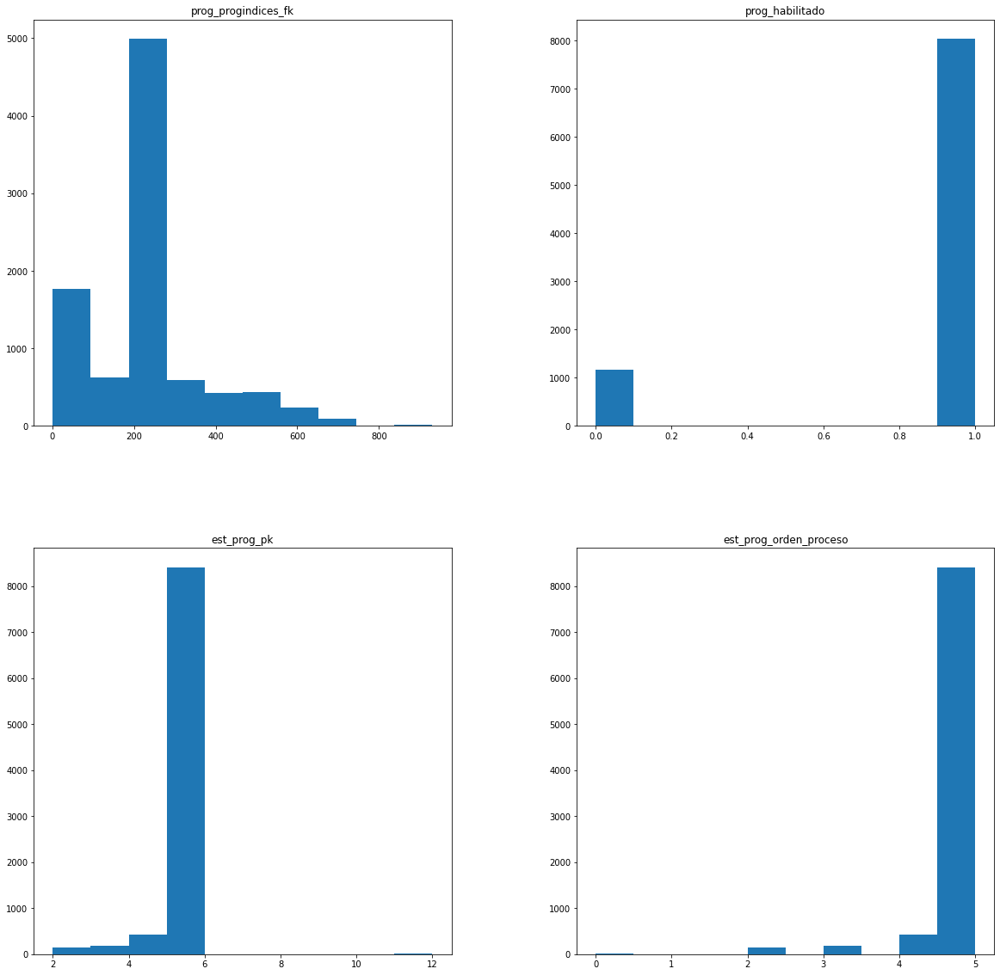

In [127]:
programa.hist(bins=10,figsize=(20,20),grid=False);

In [134]:
df_indice_recet4=programa.reset_index()

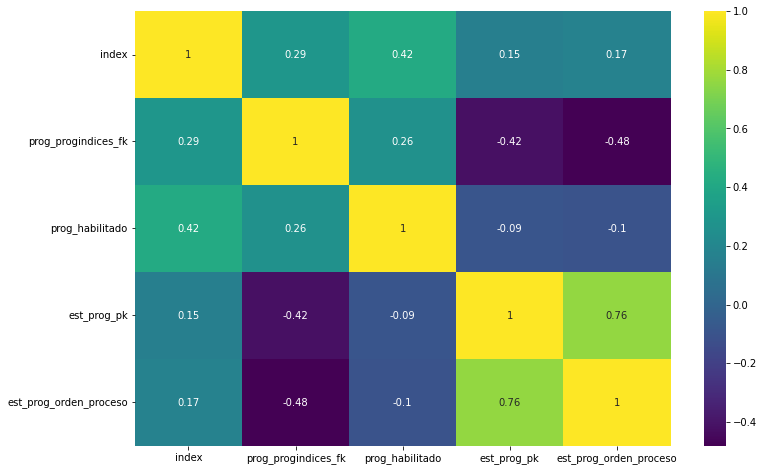

In [135]:
plt.figure(figsize=(12, 8))
sns.heatmap(df_indice_recet4.corr(), annot=True, cmap='viridis')
plt.show()

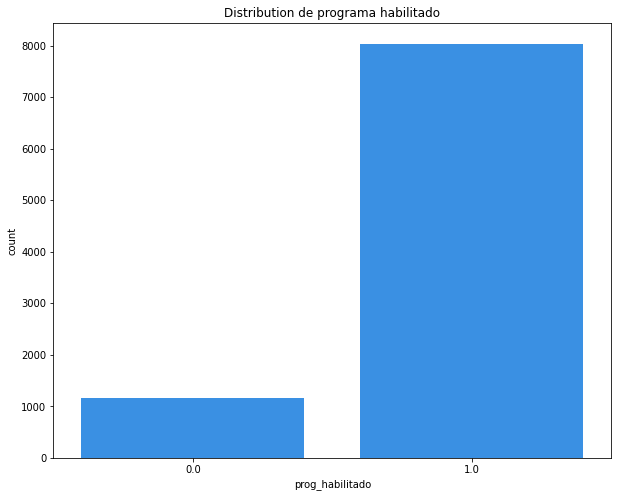

In [304]:
plt.figure(figsize=(10,8))
plt.title('Distribution de programa habilitado')
d0 = sns.countplot(data=df_indice_recet4, x='prog_habilitado', color='dodgerblue')

In [306]:
df_indice_recet4['prog_habilitado'].value_counts() 

1.0    8035
0.0    1161
Name: prog_habilitado, dtype: int64

In [307]:
habilitado=8035
no_habilitado=1161
total=habilitado + no_habilitado


In [308]:
(habilitado/total)*100

87.37494562853415

In [309]:
(no_habilitado/total)*100

12.625054371465854

Como es un 13% decidimos dejar para analizar su incidencia.

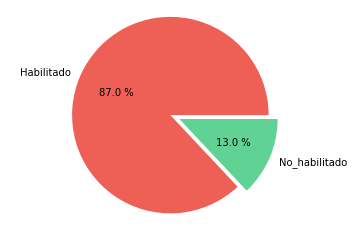

In [310]:
programa = [87,13]
nombres = ["Habilitado","No_habilitado"]
colores = ["#EE6055","#60D394"]
desfase = (0, 0.1)
plt.pie(programa, labels=nombres, autopct="%0.1f %%", colors=colores, explode=desfase)
plt.axis("equal")
plt.show()

Del analisis arroja que las variables con alta correlacion para nuestro estudio son semaforo rojo y semaforo amarillo, en este caso no lo tomaremos en cuenta dado que el criterio de amarillo y rojo no es uniforme para todos los datos lo que produce un sesgo. 
En ese entendido como no queremos aplicar sesgo a nuestro analisis optamos por aplicar un criterio cuantitativo donde es fecha de planificado con respecto a ficha de finalizacion y si esta es distinta en cuantos dias es distinta, como dato objetivo que esto lo analizaremos en el dataset de proyecto.
Hemos identifcado que la variable habilitados programas posee un 87% de habilitados los mismos mientras que un 13% no habilitados.
Asimismo es interesante generar una nube de palabras para el campo prog_nombre y ver cual programa tiene mayores proyectos.

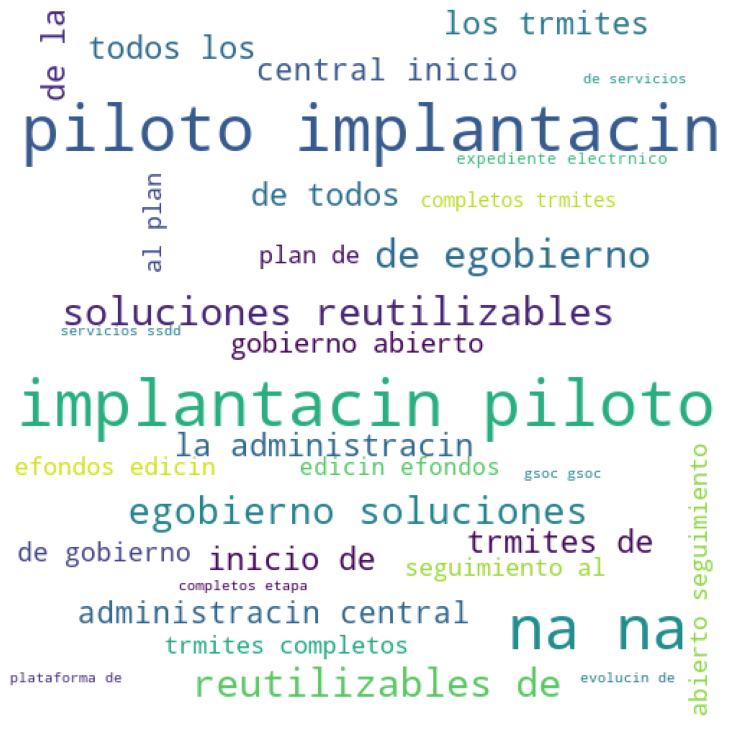

In [144]:
#Nube de palabras para “Group of weather parameters“.
# Python program to generate WordCloud
comment_words = ''
stopwords = set(STOPWORDS)
# iterate through the csv file
for val in df_indice_recet4.prog_nombre:
# typecaste each val to string
    val = str(val)
# split the value
    tokens = val.split()
# Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()   
    comment_words += " ".join(tokens)+" "
wordcloud = WordCloud(width = 500, height = 500,
                    background_color ='white',
                    stopwords = stopwords,
                    min_font_size = 10).generate(comment_words)
# plot the WordCloud image
plt.figure(figsize = (10, 10), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

Los programas con mayor canitidad de proyectos son:

1.Tramites
2.Implantacion piloto 
3.Gobierno abierto
4.Expediente electronico
5.Efondos
6.E gobieno
7.Administracion Central

# Resumen
Se analizan 35 columnas de 12952 registros. Se obtiene que 87% de los programas estan habilitados y los programas con mayor cantidad de proyectos son:

1.Tramites
2.Implantacion piloto 
3.Gobierno abierto
4.Expediente electronico
5.Efondos
6.E gobieno
7.Administracion Central

# Analisis de Dataset sin Riesgos, Lecciones Aprendidas y Programas

In [78]:
completo=data.drop(['risk_pk','risk_nombre','risk_fecha_actu','risk_probabilidad','risk_impacto','risk_ent_fk','risk_fecha_limite','risk_efecto','risk_estategia','risk_disparador','risk_contingencia','risk_fecha_superado','risk_usuario_superado_fk','risk_exposicion','lecapr_tipo_fk','lecapr_usr_fk','lecapr_fecha','lecapr_desc','tipolec_lecc_apre_pk','tipolec_lecc_apre_codigo','tipolec_lecc_apre_nombre','lecaprcon_con_fk','lecaprcon_lecapr_fk','prog_pk','prog_org_fk','prog_area_fk','prog_est_fk','prog_usr_gerente_fk','prog_usr_adjunto_fk','prog_usr_sponsor_fk','prog_usr_pmofed_fk','prog_progindices_fk','prog_nombre','prog_descripcion','prog_objetivo','prog_obj_publico','prog_semaforo_amarillo','prog_semaforo_rojo','prog_activo','prog_fecha_crea','prog_fecha_act','prog_id_migrado','prog_habilitado','est_prog_pk','est_prog_codigo','est_prog_nombre','est_prog_orden_proceso','obj_est_prog_descripcion','prog_usu_id_adjunto','prog_usu_cod_adjunto','prog_usu_primer_apellido_adjunto','prog_usu_primer_nombre_adjunto','prog_usu_id_gerente','prog_usu_cod_gerente','prog_usu_primer_apellido_gerente','prog_usu_primer_nombre_gerente','prog_usu_id_pmofed','prog_usu_cod_pmofed','prog_usu_primer_apellido_pmofed','prog_usu_primer_nombre_pmofed','prog_usu_id_sponsor','prog_usu_cod_sponsor','prog_usu_primer_apellido_sponsor','prog_usu_primer_nombre_sponsor'],axis=1)
completo.shape

(12952, 108)

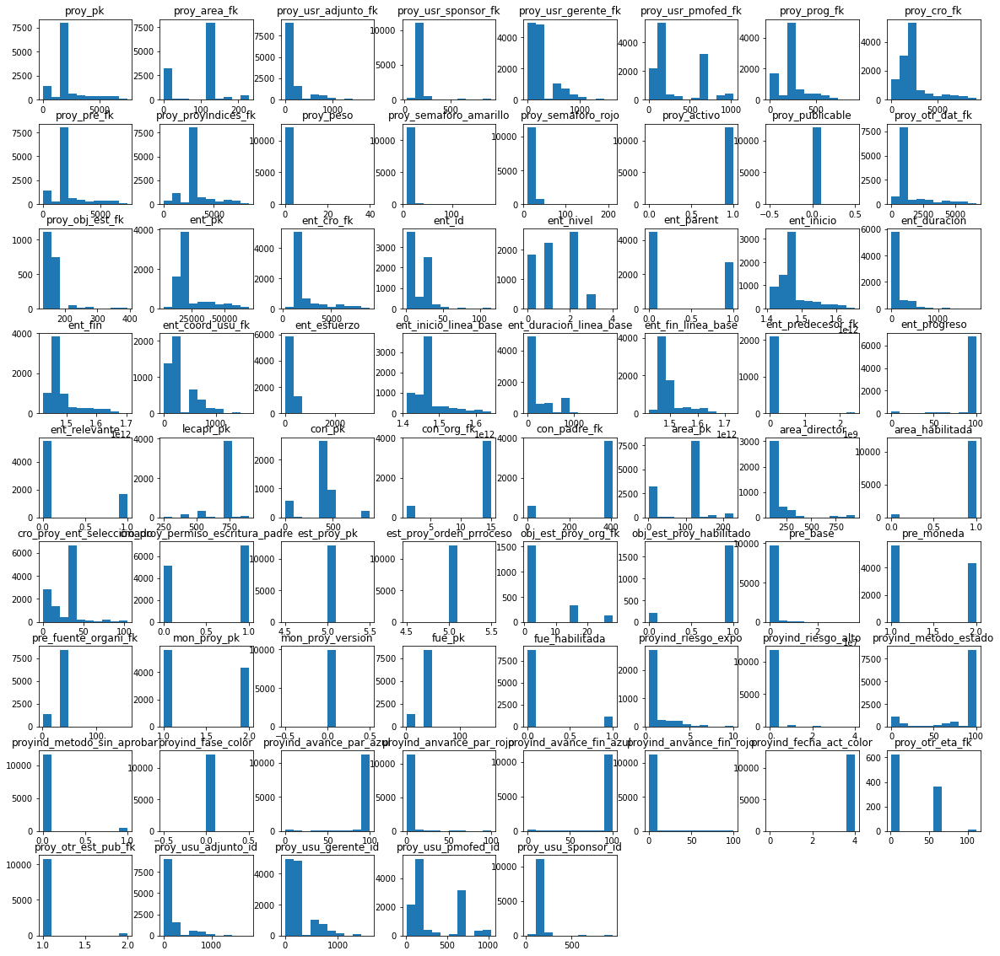

In [281]:
completo.hist(bins=10,figsize=(20,20),grid=False);

In [282]:
completo.info(verbose = True, null_counts = True, buf=None, max_cols=None, memory_usage=None, show_counts=None)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12098 entries, 1 to 15763
Data columns (total 108 columns):
 #    Column                            Non-Null Count  Dtype  
---   ------                            --------------  -----  
 0    proy_pk                           12098 non-null  int64  
 1    proy_area_fk                      12098 non-null  int64  
 2    proy_usr_adjunto_fk               12098 non-null  int64  
 3    proy_usr_sponsor_fk               12098 non-null  int64  
 4    proy_usr_gerente_fk               12098 non-null  int64  
 5    proy_usr_pmofed_fk                12098 non-null  float64
 6    proy_prog_fk                      8746 non-null   float64
 7    proy_cro_fk                       12098 non-null  float64
 8    proy_pre_fk                       12075 non-null  float64
 9    proy_proyindices_fk               12098 non-null  int64  
 10   proy_peso                         12098 non-null  int64  
 11   proy_descripcion                  10651 non-null  st

Del analisis anterior se extrae las personas del analisis como se comunico antes no se analizaran el nombre de los intervinientes: 'proy_usr_adjunto_fk','proy_usr_sponsor_fk','proy_usr_gerente_fk','proy_usr_pmofed_fk'
Se extraer la configuracion del semaforo: proy_semaforo_amarillo, proy_semaforo_rojo
Se extrae cuales son activos porque son todos comose ven en la grafica  proy_activo
Se extre lo que tiene que ver con el indcador de color en la grafica porque como son finalizados es el ultimo estado proyind_fase_color,  proyind_avance_par_azul,proyind_anvance_par_rojo,proyind_avance_fin_azul,proyind_anvance_fin_rojo,proyind_fecha_act,               proyind_fecha_act_color 
Mismo tema de personas se extraen del analisis: proy_usu_adjunto_id,proy_usu_adjunto_primer_apellido,proy_usu_adjunto_primer_nombre,
proy_usu_adjunto_cod,proy_usu_gerente_id,proy_usu_gerente_primer_apellido,proy_usu_gerente_primer_nombre,
proy_usu_gerente_cod,proy_usu_pmofed_id,proy_usu_pmofed_primer_apellido,proy_usu_pmofed_primer_nombre,
proy_usu_pmofed_cod,proy_usu_sponsor_id,proy_usu_sponsor_primer_apellido,proy_usu_sponsor_primer_nombre,proy_usu_sponsor_cod
Luego proy_peso tiene valor 0  como unico valor se extrae.

In [79]:
completo=data.drop(['proy_usr_adjunto_fk','proy_usr_sponsor_fk','proy_usr_gerente_fk','proy_usr_pmofed_fk','proy_semaforo_amarillo','proy_semaforo_rojo','proy_activo','proyind_fase_color','proyind_avance_par_azul','proyind_anvance_par_rojo','proyind_avance_fin_azul','proyind_anvance_fin_rojo','proyind_fecha_act','proyind_fecha_act_color','proy_usu_adjunto_id','proy_usu_adjunto_primer_apellido','proy_usu_adjunto_primer_nombre','proy_usu_adjunto_cod','proy_usu_gerente_id','proy_usu_gerente_primer_apellido','proy_usu_gerente_primer_nombre','proy_usu_gerente_cod','proy_usu_pmofed_id','proy_usu_pmofed_primer_apellido','proy_usu_pmofed_primer_nombre','proy_usu_pmofed_cod','proy_usu_sponsor_id','proy_usu_sponsor_primer_apellido','proy_usu_sponsor_primer_nombre','proy_usu_sponsor_cod','proy_peso','risk_pk','risk_nombre','risk_fecha_actu','risk_probabilidad','risk_impacto','risk_ent_fk','risk_fecha_limite','risk_efecto','risk_estategia','risk_disparador','risk_contingencia','risk_fecha_superado','risk_usuario_superado_fk','risk_exposicion','lecapr_pk','lecapr_tipo_fk','lecapr_usr_fk','lecapr_fecha','lecapr_desc','tipolec_lecc_apre_pk','tipolec_lecc_apre_codigo','tipolec_lecc_apre_nombre','lecaprcon_con_fk','lecaprcon_lecapr_fk','prog_pk','prog_org_fk','prog_area_fk','prog_est_fk','prog_usr_gerente_fk','prog_usr_adjunto_fk','prog_usr_sponsor_fk','prog_usr_pmofed_fk','prog_progindices_fk','prog_nombre','prog_descripcion','prog_objetivo','prog_obj_publico','prog_semaforo_amarillo','prog_semaforo_rojo','prog_activo','prog_fecha_crea','prog_fecha_act','prog_id_migrado','prog_habilitado','est_prog_pk','est_prog_codigo','est_prog_nombre','est_prog_orden_proceso','obj_est_prog_descripcion','prog_usu_id_adjunto','prog_usu_cod_adjunto','prog_usu_primer_apellido_adjunto','prog_usu_primer_nombre_adjunto','prog_usu_id_gerente','prog_usu_cod_gerente','prog_usu_primer_apellido_gerente','prog_usu_primer_nombre_gerente','prog_usu_id_pmofed','prog_usu_cod_pmofed','prog_usu_primer_apellido_pmofed','prog_usu_primer_nombre_pmofed','prog_usu_id_sponsor','prog_usu_cod_sponsor','prog_usu_primer_apellido_sponsor','prog_usu_primer_nombre_sponsor'],axis=1)
completo.shape

(12952, 76)

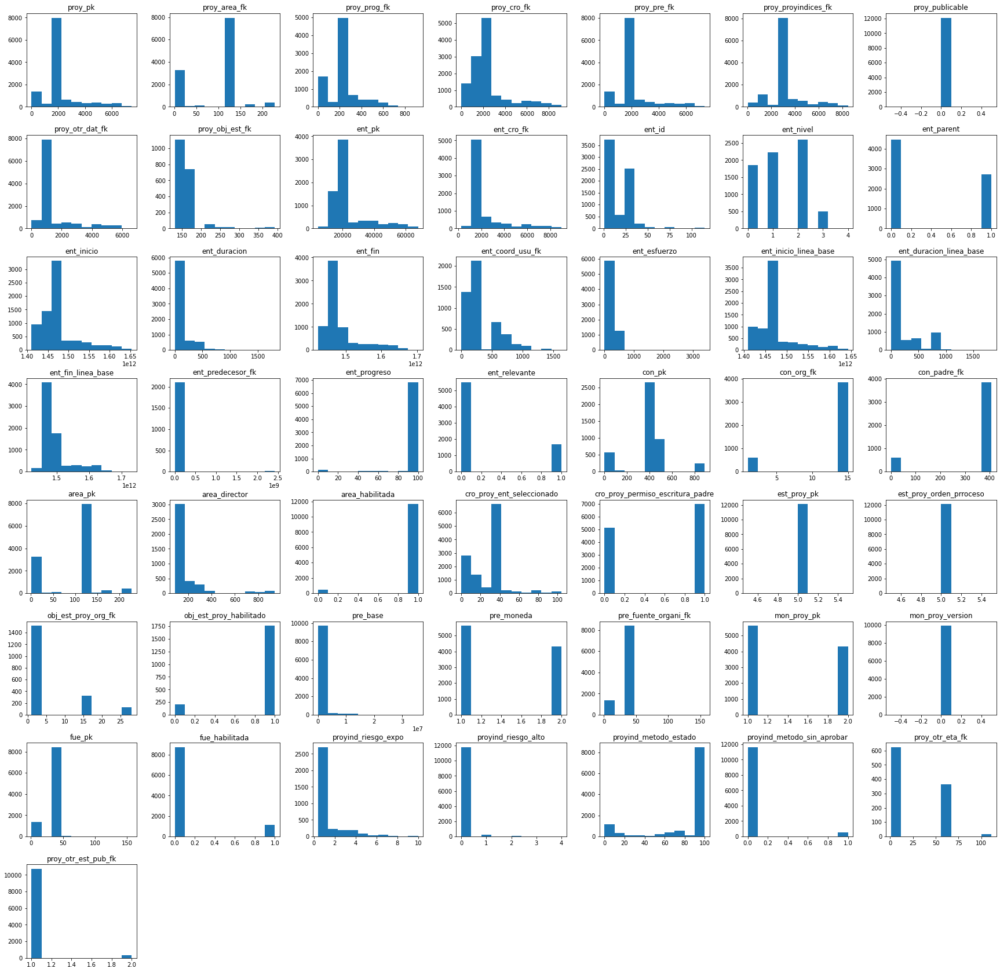

In [284]:
completo.hist(bins=10,figsize=(30,30),grid=False);

In [285]:
completo.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12098 entries, 1 to 15763
Data columns (total 76 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   proy_pk                           12098 non-null  int64  
 1   proy_area_fk                      12098 non-null  int64  
 2   proy_prog_fk                      8746 non-null   float64
 3   proy_cro_fk                       12098 non-null  float64
 4   proy_pre_fk                       12075 non-null  float64
 5   proy_proyindices_fk               12098 non-null  int64  
 6   proy_descripcion                  10651 non-null  string 
 7   proy_objetivo                     12098 non-null  string 
 8   proy_obj_publico                  12098 non-null  string 
 9   proy_situacion_actual             11874 non-null  string 
 10  proy_nombre                       12098 non-null  string 
 11  proy_fecha_crea                   11194 non-null  object 
 12  proy

Extremos 
Conocimiento dado que lo analizamos previamente. con_pk ,con_nombre,con_org_fk,con_padre_fk  
Persona por lo dicho anteriormente area_director 
Estado por que son todos 5 dado que solo tomamos lo finalizado est_proy_pk,est_proy_codigo,est_proy_nombre,est_proy_orden_proceso,obj_est_proy_nombre,obj_est_proy_descripcion,obj_est_proy_org_fk,obj_est_proy_habilitado,proy_otr_eta_fk,proy_otr_est_pub_fk 
Riesgos: proyind_riesgo_expo, proyind_riesgo_ultact,proyind_riesgo_alto
Se extrae el metodo esta asociada al riesgo: proyind_metodo_estado,proyind_metodo_sin_aprobar
Se elimina el indicador por esto mencionabas todo azul: proyind_periodo_inicio,proyind_periodo_fin   
Solo tiene le valor cero mon_proy_version       


In [80]:
completo=data.drop(['proy_usr_adjunto_fk','proy_usr_sponsor_fk','proy_usr_gerente_fk','proy_usr_pmofed_fk','proy_semaforo_amarillo','proy_semaforo_rojo','proy_activo','proyind_fase_color','proyind_avance_par_azul','proyind_anvance_par_rojo','proyind_avance_fin_azul','proyind_anvance_fin_rojo','proyind_fecha_act','proyind_fecha_act_color','proy_usu_adjunto_id','proy_usu_adjunto_primer_apellido','proy_usu_adjunto_primer_nombre','proy_usu_adjunto_cod','proy_usu_gerente_id','proy_usu_gerente_primer_apellido','proy_usu_gerente_primer_nombre','proy_usu_gerente_cod','proy_usu_pmofed_id','proy_usu_pmofed_primer_apellido','proy_usu_pmofed_primer_nombre','proy_usu_pmofed_cod','proy_usu_sponsor_id','proy_usu_sponsor_primer_apellido','proy_usu_sponsor_primer_nombre','proy_usu_sponsor_cod','proy_peso','risk_pk','risk_nombre','risk_fecha_actu','risk_probabilidad','risk_impacto','risk_ent_fk','risk_fecha_limite','risk_efecto','risk_estategia','risk_disparador','risk_contingencia','risk_fecha_superado','risk_usuario_superado_fk','risk_exposicion','lecapr_pk','lecapr_tipo_fk','lecapr_usr_fk','lecapr_fecha','lecapr_desc','tipolec_lecc_apre_pk','tipolec_lecc_apre_codigo','tipolec_lecc_apre_nombre','lecaprcon_con_fk','lecaprcon_lecapr_fk','prog_pk','prog_org_fk','prog_area_fk','prog_est_fk','prog_usr_gerente_fk','prog_usr_adjunto_fk','prog_usr_sponsor_fk','prog_usr_pmofed_fk','prog_progindices_fk','prog_nombre','prog_descripcion','prog_objetivo','prog_obj_publico','prog_semaforo_amarillo','prog_semaforo_rojo','prog_activo','prog_fecha_crea','prog_fecha_act','prog_id_migrado','prog_habilitado','est_prog_pk','est_prog_codigo','est_prog_nombre','est_prog_orden_proceso','obj_est_prog_descripcion','prog_usu_id_adjunto','prog_usu_cod_adjunto','prog_usu_primer_apellido_adjunto','prog_usu_primer_nombre_adjunto','prog_usu_id_gerente','prog_usu_cod_gerente','prog_usu_primer_apellido_gerente','prog_usu_primer_nombre_gerente','prog_usu_id_pmofed','prog_usu_cod_pmofed','prog_usu_primer_apellido_pmofed','prog_usu_primer_nombre_pmofed','prog_usu_id_sponsor','prog_usu_cod_sponsor','prog_usu_primer_apellido_sponsor','prog_usu_primer_nombre_sponsor','con_pk','con_nombre','con_org_fk','con_padre_fk','area_director','est_proy_pk','est_proy_codigo','est_proy_nombre','est_proy_orden_prroceso','obj_est_proy_nombre','obj_est_proy_descripcion','obj_est_proy_org_fk','obj_est_proy_habilitado','proy_otr_eta_fk','proy_otr_est_pub_fk','proyind_riesgo_expo','proyind_riesgo_ultact','proyind_riesgo_alto','proyind_metodo_estado','proyind_metodo_sin_aprobar','proyind_periodo_inicio','proyind_periodo_fin','mon_proy_version'],axis=1)
completo.shape

(12952, 53)

In [252]:
completo.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12098 entries, 1 to 15763
Data columns (total 53 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   proy_pk                           12098 non-null  int64  
 1   proy_area_fk                      12098 non-null  int64  
 2   proy_prog_fk                      8746 non-null   float64
 3   proy_cro_fk                       12098 non-null  float64
 4   proy_pre_fk                       12075 non-null  float64
 5   proy_proyindices_fk               12098 non-null  int64  
 6   proy_descripcion                  10651 non-null  string 
 7   proy_objetivo                     12098 non-null  string 
 8   proy_obj_publico                  12098 non-null  string 
 9   proy_situacion_actual             11874 non-null  string 
 10  proy_nombre                       12098 non-null  string 
 11  proy_fecha_crea                   11194 non-null  object 
 12  proy

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\perez\AppData\Local\Programs\Python\Python310\lib\site-packages\missingno\missingno.py:254: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\perez\AppData\Local\Programs\Python\Python310\lib\site-packages\pandas_profiling\model\missing.py:89: UserWarning:

There was an attempt to generate the Count missing values diagrams, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(missing_diagrams={"Count": False}`)
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/pandas-profiling/issues
(include the error message: 'The number of FixedLocator locations (7), usually from a call to set_ticks, does not match the number of ticklabels (55).')



Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

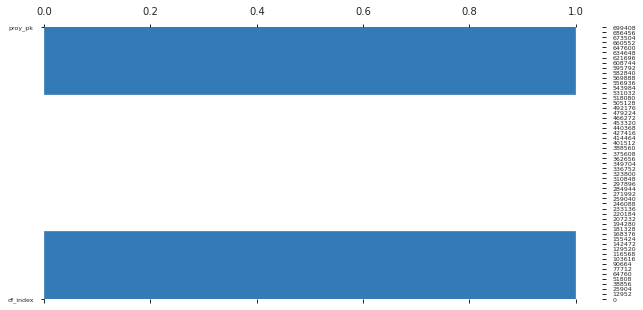

In [191]:
profile = pp.ProfileReport(completo, title = "EDA_completo")
profile.to_file(output_file="reporteEDA_COMPLETO.html") 

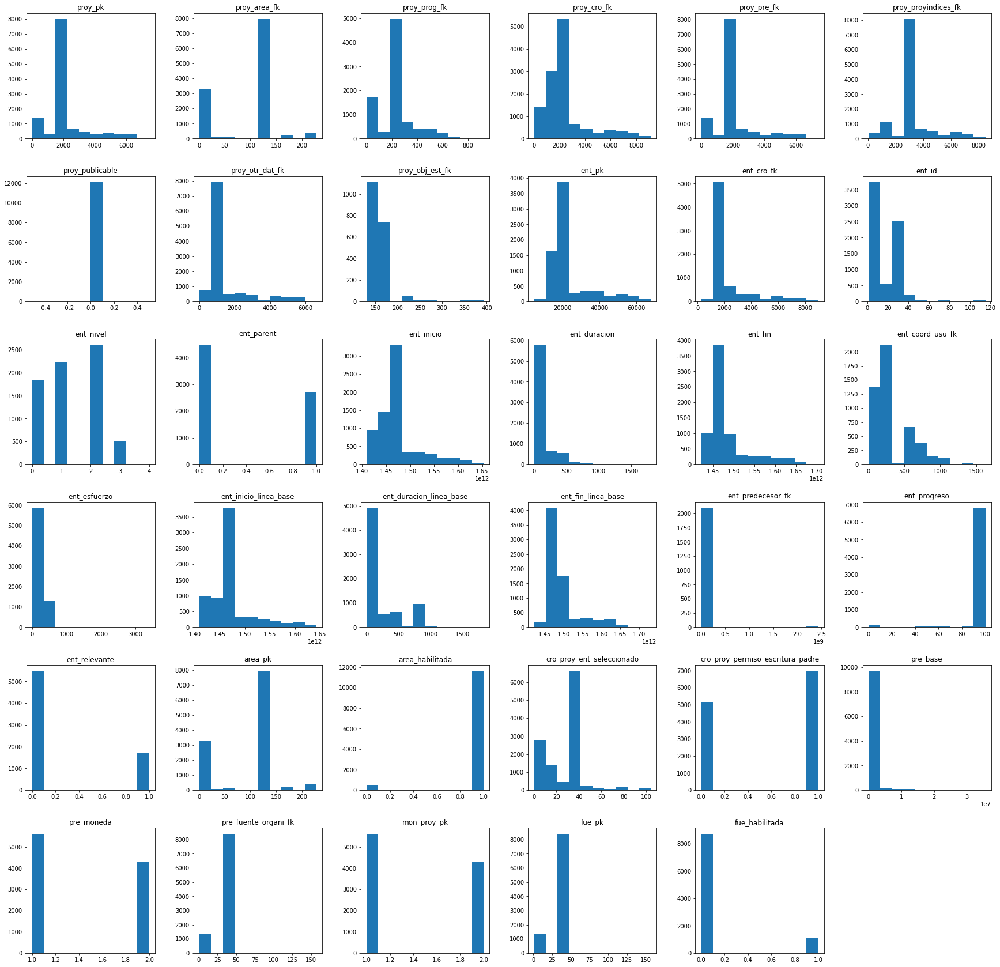

In [287]:
completo.hist(bins=10,figsize=(30,30),grid=False);

In [289]:
completo_corr = completo.corr().transpose()
completo_corr

,proy_pk,proy_area_fk,proy_prog_fk,proy_cro_fk,proy_pre_fk,proy_proyindices_fk,proy_publicable,proy_otr_dat_fk,proy_obj_est_fk,ent_pk,...,area_pk,area_habilitada,cro_proy_ent_seleccionado,cro_proy_permiso_escritura_padre,pre_base,pre_moneda,pre_fuente_organi_fk,mon_proy_pk,fue_pk,fue_habilitada
proy_pk,1.000000,0.096124,0.771090,0.994509,0.999397,0.991846,NaN,0.990060,0.217882,0.974940,...,0.096124,-0.092819,-0.204423,-0.494543,0.318660,-0.072473,0.261820,-0.072473,0.261820,0.013530
proy_area_fk,0.096124,1.000000,0.408748,0.051738,0.075565,0.161612,NaN,-0.117426,0.366665,-0.152927,...,1.000000,-0.159837,0.492069,-0.048487,0.069395,-0.141866,0.694543,-0.141866,0.694543,-0.448779
proy_prog_fk,0.771090,0.408748,1.000000,0.756494,0.764658,0.786023,NaN,0.700070,0.440319,0.792199,...,0.408748,-0.036827,-0.008479,-0.529516,0.259409,-0.219879,0.388191,-0.219879,0.388191,-0.028706
proy_cro_fk,0.994509,0.051738,0.756494,1.000000,0.996525,0.976830,NaN,0.993929,0.215185,0.980199,...,0.051738,-0.123794,-0.250748,-0.491421,0.324811,-0.062061,0.199976,-0.062061,0.199976,0.048278
proy_pre_fk,0.999397,0.075565,0.764658,0.996525,1.000000,0.987692,NaN,0.992214,0.217017,0.975943,...,0.075565,-0.097367,-0.224710,-0.492423,0.321168,-0.069821,0.242352,-0.069821,0.242352,0.024376
proy_proyindices_fk,0.991846,0.161612,0.786023,0.976830,0.987692,1.000000,NaN,0.980313,0.217988,0.968908,...,0.161612,-0.070357,-0.131329,-0.495679,0.302059,-0.075679,0.326609,-0.075679,0.326609,-0.029850
proy_publicable,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
proy_otr_dat_fk,0.990060,-0.117426,0.700070,0.993929,0.992214,0.980313,NaN,1.000000,0.217571,0.978249,...,-0.117426,-0.139969,-0.425746,-0.449287,0.306737,-0.091464,0.098440,-0.091464,0.098440,0.183795
proy_obj_est_fk,0.217882,0.366665,0.440319,0.215185,0.217017,0.217988,NaN,0.217571,1.000000,0.187424,...,0.366665,-0.264581,-0.090553,-0.009828,0.220714,-0.262525,0.284068,-0.262525,0.284068,0.113808
ent_pk,0.974940,-0.152927,0.792199,0.980199,0.975943,0.968908,NaN,0.978249,0.187424,1.000000,...,-0.152927,-0.195829,-0.491707,-0.501389,0.358545,-0.072118,-0.013305,-0.072118,-0.013305,0.217271


In [297]:
df_indice_recet3=completo.reset_index()

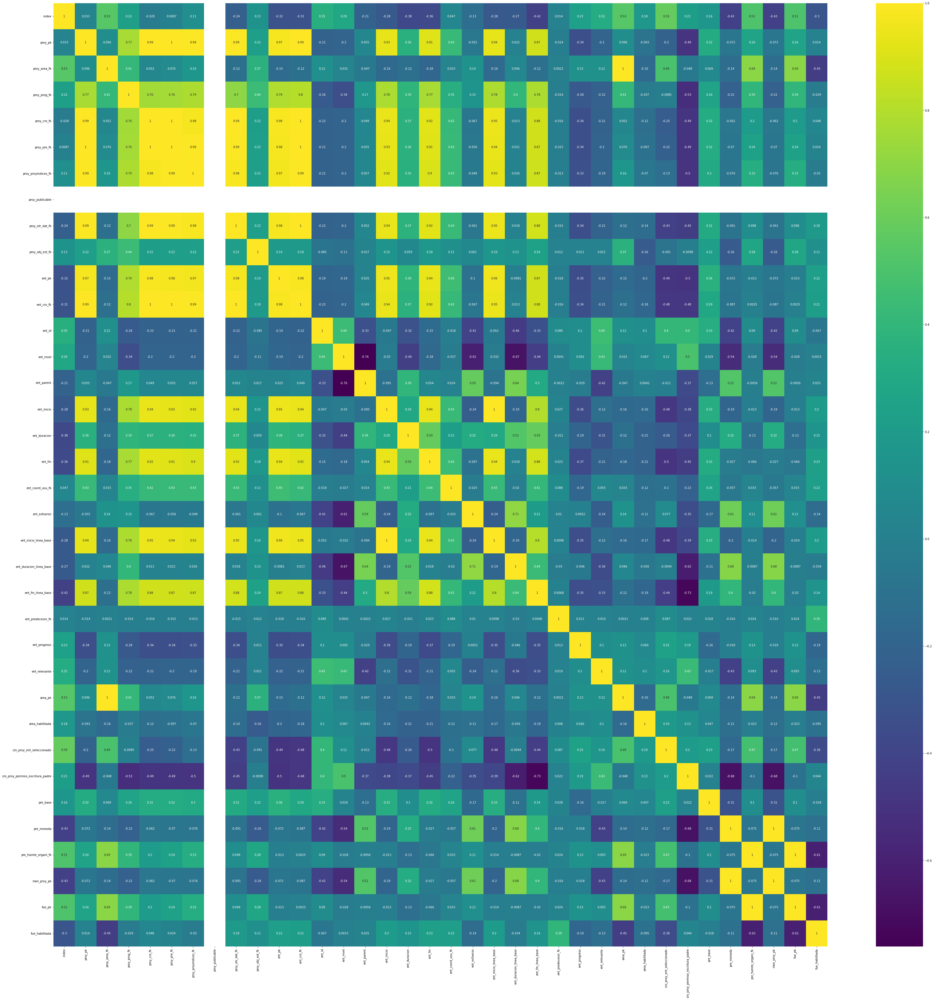

In [298]:
plt.figure(figsize=(60, 60))
sns.heatmap(df_indice_recet3.corr(), annot=True, cmap='viridis')
plt.show()

# Variables determinantes en Proyectos hasta el momento 

Del analisis de la matriz y de los numeros podemos decir que la PK de proyectos posee una alta correlacion con:
Entregables 0.97
Programa 0.99
Cronograma 0.99
Presupuesto 0.99
De analisis anteriores tenemos que
Riesgos 0.97
Lecciones Aprendidas 0.9


In [299]:
# Seperamos las variables categoricas de las variables numericas

num_vars = completo.columns[completo.dtypes != 'object']
cat_vars = completo.columns[completo.dtypes == 'object']

print("Numerical variables:", num_vars)
print("Categorical variables:", cat_vars)

Numerical variables: Index(['proy_pk', 'proy_area_fk', 'proy_prog_fk', 'proy_cro_fk', 'proy_pre_fk',
       'proy_proyindices_fk', 'proy_descripcion', 'proy_objetivo',
       'proy_obj_publico', 'proy_situacion_actual', 'proy_nombre',
       'proy_publicable', 'proy_otr_dat_fk', 'proy_obj_est_fk',
       'proy_factor_impacto', 'ent_pk', 'ent_cro_fk', 'ent_id', 'ent_nombre',
       'ent_nivel', 'ent_parent', 'ent_inicio', 'ent_duracion', 'ent_fin',
       'ent_coord_usu_fk', 'ent_esfuerzo', 'ent_inicio_linea_base',
       'ent_duracion_linea_base', 'ent_fin_linea_base', 'ent_predecesor_fk',
       'ent_descripcion', 'ent_progreso', 'ent_relevante', 'area_pk',
       'area_nombre', 'area_abreviacion', 'area_habilitada',
       'cro_proy_ent_seleccionado', 'cro_proy_permiso_escritura_padre',
       'pre_base', 'pre_moneda', 'pre_fuente_organi_fk', 'mon_proy_pk',
       'mon_proy_nombre', 'mon_proy_signo', 'fue_pk', 'fue_nombre',
       'fue_habilitada'],
      dtype='object')
Categorical 

In [300]:
completo[num_vars].isnull().sum()

proy_pk                                 0
proy_area_fk                            0
proy_prog_fk                         3352
proy_cro_fk                             0
proy_pre_fk                            23
proy_proyindices_fk                     0
proy_descripcion                     1447
proy_objetivo                           0
proy_obj_publico                        0
proy_situacion_actual                 224
proy_nombre                             0
proy_publicable                         0
proy_otr_dat_fk                       914
proy_obj_est_fk                     10130
proy_factor_impacto                 10442
ent_pk                               4912
ent_cro_fk                           4912
ent_id                               4912
ent_nombre                           4912
ent_nivel                            4912
ent_parent                           4912
ent_inicio                           4912
ent_duracion                         4912
ent_fin                           

In [301]:
completo.sample(5)

,proy_pk,proy_area_fk,proy_prog_fk,proy_cro_fk,proy_pre_fk,proy_proyindices_fk,proy_descripcion,proy_objetivo,proy_obj_publico,proy_situacion_actual,...,org_nombre,pre_base,pre_moneda,pre_fuente_organi_fk,mon_proy_pk,mon_proy_nombre,mon_proy_signo,fue_pk,fue_nombre,fue_habilitada
4253,3985,1,293.0,4678.0,3856.0,4978,El proyecto se encuentra en el marco del progr...,El principal objetivo de este proyecto es impl...,Fortalecimiento del rea de TI del MEC UE01 D...,p Se solicita cierre dado que el proyecto va a...,...,AGESIC,NaN,NaN,NaN,NaN,<NA>,<NA>,NaN,<NA>,NaN
13265,1904,116,240.0,1921.0,1758.0,2897,p classwestern langesMX stylemarginleft 029cm ...,p classwestern langesMX stylemarginleft 024cm ...,p classwestern langesMX stylemarginleft 04cm t...,p Con fecha de hoy se publicaron los traacutem...,...,Trmites en Lnea,477020.0,1.0,40.0,1.0,Pesos,$,40.0,BID 2591 GE II,0.0
3673,3060,138,NaN,3537.0,2931.0,4053,p La Red de Traacutemites es un mecanismo que ...,p Lograr que la Red de Traacutemites cuente co...,div Algunos beneficios buscadosdiv div nbspdiv...,p font faceArial sansserifProyecto en transfer...,...,Trmites en Lnea,NaN,NaN,NaN,NaN,<NA>,<NA>,NaN,<NA>,NaN
10013,1741,117,NaN,1686.0,1594.0,2734,p Evolucioacuten del Sistema de Agenda publica...,p span classiceOutTxt idfichajidt357Evoluciona...,div classicePnlGrp recuadro idfichajidt360 p s...,p strongJuniostrongp p Se instalo versioacuten...,...,Trmites en Lnea,85000.0,2.0,40.0,2.0,DÃ³lares,U$S,40.0,BID 2591 GE II,0.0
12532,1904,116,240.0,1921.0,1758.0,2897,p classwestern langesMX stylemarginleft 029cm ...,p classwestern langesMX stylemarginleft 024cm ...,p classwestern langesMX stylemarginleft 04cm t...,p Con fecha de hoy se publicaron los traacutem...,...,Trmites en Lnea,477020.0,1.0,40.0,1.0,Pesos,$,40.0,BID 2591 GE II,0.0


In [294]:
completo.describe(include='all')

,proy_pk,proy_area_fk,proy_prog_fk,proy_cro_fk,proy_pre_fk,proy_proyindices_fk,proy_descripcion,proy_objetivo,proy_obj_publico,proy_situacion_actual,...,org_nombre,pre_base,pre_moneda,pre_fuente_organi_fk,mon_proy_pk,mon_proy_nombre,mon_proy_signo,fue_pk,fue_nombre,fue_habilitada
count,12098.000000,12098.000000,8746.000000,12098.000000,12075.000000,12098.000000,10651,12098,12098,11874,...,12098,1.011900e+04,9918.000000,9833.000000,9918.000000,9918,9918,9833.000000,9833,9833.000000
unique,NaN,NaN,NaN,NaN,NaN,NaN,1008,1395,1255,1404,...,3,NaN,NaN,NaN,NaN,2,2,NaN,12,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,p classwestern langesMX stylemarginleft 029cm ...,p classwestern langesMX stylemarginleft 024cm ...,p classwestern langesMX stylemarginleft 04cm t...,p Con fecha de hoy se publicaron los traacutem...,...,Trmites en Lnea,NaN,NaN,NaN,NaN,Pesos,$,NaN,BID 2591 GE II,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,3840,3840,3840,3840,...,7948,NaN,NaN,NaN,NaN,5619,5619,NaN,6604,NaN
mean,2181.496446,88.748884,241.080494,2349.632253,2058.840828,3101.315507,NaN,NaN,NaN,NaN,...,NaN,7.067249e+05,1.433454,35.437608,1.433454,NaN,NaN,35.437608,NaN,0.112885
std,1313.959740,55.962968,137.083433,1663.329671,1305.734350,1420.526957,NaN,NaN,NaN,NaN,...,NaN,1.770458e+06,0.495577,14.307972,0.495577,NaN,NaN,14.307972,NaN,0.316468
min,2.000000,1.000000,1.000000,2.000000,2.000000,30.000000,NaN,NaN,NaN,NaN,...,NaN,0.000000e+00,1.000000,1.000000,1.000000,NaN,NaN,1.000000,NaN,0.000000
25%,1741.000000,15.000000,228.000000,1686.000000,1594.000000,2734.000000,NaN,NaN,NaN,NaN,...,NaN,8.500000e+04,1.000000,40.000000,1.000000,NaN,NaN,40.000000,NaN,0.000000
50%,1904.000000,116.000000,240.000000,1921.000000,1758.000000,2897.000000,NaN,NaN,NaN,NaN,...,NaN,4.770200e+05,1.000000,40.000000,1.000000,NaN,NaN,40.000000,NaN,0.000000
75%,2093.000000,117.000000,240.000000,2190.000000,1948.000000,3083.000000,NaN,NaN,NaN,NaN,...,NaN,4.770200e+05,2.000000,40.000000,2.000000,NaN,NaN,40.000000,NaN,0.000000


Del analisis anterior se puede obtener que nos interesa profundizar mas en Enrregables, Cronograma, Presupuesto para ello lo agruparemos en un sub dataset como para analizar de forma mas gestionable.

# Entregables

Dado que incide en el proyecto se realiza un EDA de los Entregables.

In [81]:
entregables=completo.drop(['org_nombre','proy_fecha_crea','proy_fecha_act','proy_fecha_est_act','proy_fecha_act_pub','proy_area_fk','proy_prog_fk','proy_cro_fk','proy_pre_fk','proy_proyindices_fk','proy_descripcion','proy_objetivo','proy_obj_publico','proy_situacion_actual','proy_nombre','proy_publicable','proy_otr_dat_fk','proy_obj_est_fk','proy_factor_impacto','area_pk','area_nombre','area_abreviacion','area_habilitada','cro_proy_ent_seleccionado','cro_proy_permiso_escritura_padre','pre_base','pre_moneda','pre_fuente_organi_fk','mon_proy_pk','mon_proy_nombre','mon_proy_signo','fue_pk','fue_nombre','fue_habilitada',],axis=1)
entregables.shape

                     

(12952, 19)

In [82]:
entregables.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12952 entries, 0 to 15763
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   proy_pk                  12952 non-null  int64  
 1   ent_pk                   7251 non-null   float64
 2   ent_cro_fk               7251 non-null   float64
 3   ent_id                   7251 non-null   float64
 4   ent_nombre               7251 non-null   string 
 5   ent_nivel                7251 non-null   float64
 6   ent_parent               7251 non-null   float64
 7   ent_inicio               7251 non-null   float64
 8   ent_duracion             7251 non-null   float64
 9   ent_fin                  7251 non-null   float64
 10  ent_coord_usu_fk         4909 non-null   float64
 11  ent_esfuerzo             7251 non-null   float64
 12  ent_inicio_linea_base    7251 non-null   float64
 13  ent_duracion_linea_base  7251 non-null   float64
 14  ent_fin_linea_base    

El 60% de los proyectos poseen entregables mientras que el restante 40% no los posee.

In [318]:
profile = pp.ProfileReport(entregables, title = "EDA_entregables")
profile.to_file(output_file="EDA_entregables.html") 

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Del enalisis obtuvimos que se generara una nube de palabras para entregble nombre con el fin de conocer que son.
Las variables con alta correlacion son  entr_parent, entre_relevante es similar a los padre y ent_nivel enre ellas graficaremos la variable ent padre para saber el grado de importancia del entregable.
Luego veremos la duracion de los entregables y el esfuerzo

In [320]:
entregebales2=entregables[entregables['ent_nombre'].str.contains('Tramite|Registro|Produccion|agenda|Evolucin|Plan|Taller|Herramienta|Simple|Enseanza|ayuda|Instituciones', case=False)]

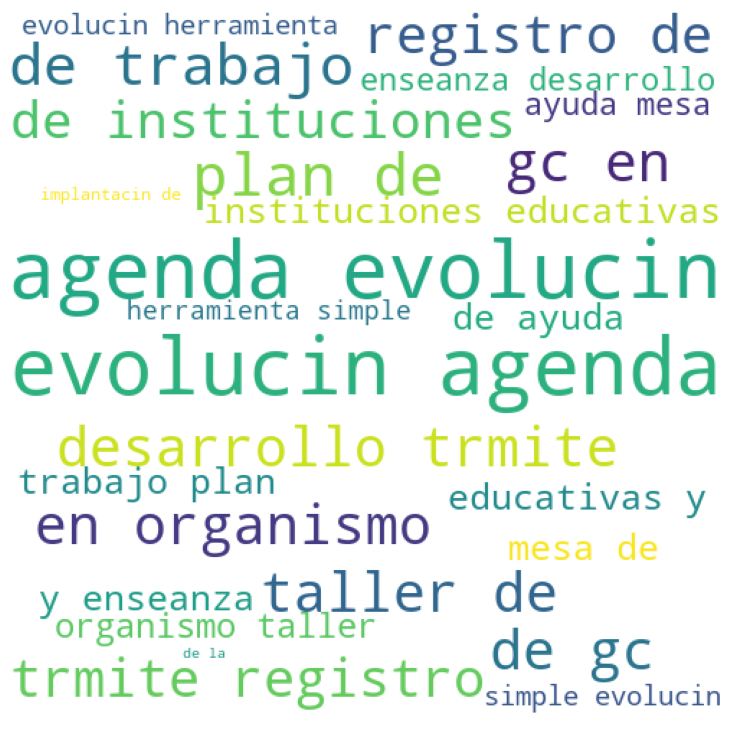

In [322]:
#Nube de palabras para “Group of weather parameters“.
# Python program to generate WordCloud
comment_words = ''
stopwords = set(STOPWORDS)
# iterate through the csv file
for val in entregebales2.ent_nombre:
# typecaste each val to string
    val = str(val)
# split the value
    tokens = val.split()
# Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()   
    comment_words += " ".join(tokens)+" "
wordcloud = WordCloud(width = 500, height = 500,
                    background_color ='white',
                    stopwords = stopwords,
                    min_font_size = 10).generate(comment_words)
# plot the WordCloud image
plt.figure(figsize = (10, 10), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

En la nube de palabras se puede observar los entregables mas relevantes.

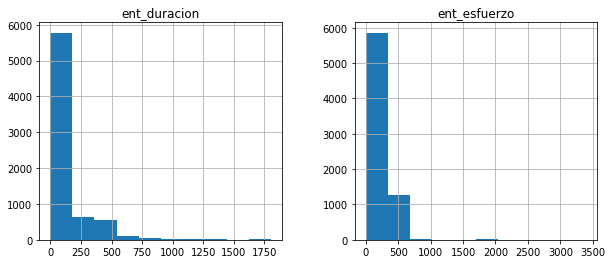

In [326]:
features = ['ent_duracion', 'ent_esfuerzo']
entregables[features].hist(figsize=(10, 4))
plt.show()

El esfuerzo y la duracion es similar se mide en dias y anda alrededro de 0 a 500.

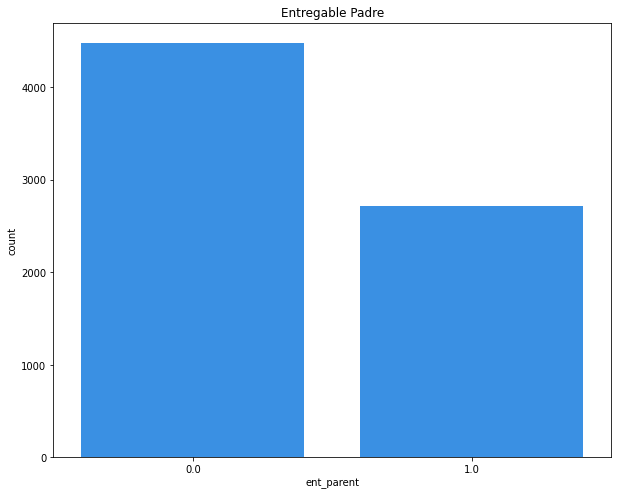

In [327]:
plt.figure(figsize=(10,8))
plt.title('Entregable Padre')
d0 = sns.countplot(data=entregables, x='ent_parent', color='dodgerblue')

In [329]:
entregables['ent_parent'].value_counts() 

0.0    4475
1.0    2711
Name: ent_parent, dtype: int64

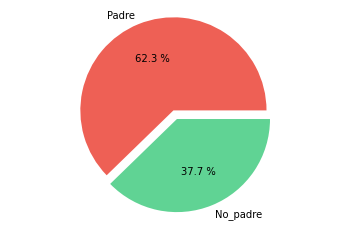

In [330]:
entregables = [4475,2711]
nombres = ["Padre","No_padre"]
colores = ["#EE6055","#60D394"]
desfase = (0, 0.1)
plt.pie(entregables, labels=nombres, autopct="%0.1f %%", colors=colores, explode=desfase)
plt.axis("equal")
plt.show()

El 62.3% de los entregables son de tareas padre.

# Resumen
Se analzian 19 variables con 12098 registros. Se encuentra que el El 60% de los proyectos poseen entregables mientras que el restante 40% no los posee. El 62.3% de los entregables son de tareas padre.
# Recomienda:
1) Que todos los proyectos posee entregables y/o productos definidos.

# Cronograma

A continuacion se analiza el cronograma de proyecto

In [83]:
cronograma=completo.drop(['org_nombre','proy_fecha_crea','proy_fecha_act','proy_fecha_est_act','proy_fecha_act_pub','proy_area_fk','proy_prog_fk','proy_pre_fk','proy_proyindices_fk','proy_descripcion','proy_objetivo','proy_obj_publico','proy_situacion_actual','proy_nombre','proy_publicable','proy_otr_dat_fk','proy_obj_est_fk','proy_factor_impacto','area_pk','area_nombre','area_abreviacion','area_habilitada','pre_base','pre_moneda','pre_fuente_organi_fk','mon_proy_pk','mon_proy_nombre','mon_proy_signo','fue_pk','fue_nombre','fue_habilitada','ent_pk','ent_cro_fk','ent_id','ent_nombre','ent_nivel','ent_parent','ent_inicio','ent_duracion','ent_fin','ent_coord_usu_fk','ent_esfuerzo','ent_inicio_linea_base','ent_duracion_linea_base','ent_fin_linea_base','ent_predecesor_fk','ent_descripcion','ent_progreso','ent_relevante',],axis=1)
cronograma.shape
                    

(12952, 4)

In [338]:
cronograma.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12098 entries, 1 to 15763
Data columns (total 4 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   proy_pk                           12098 non-null  int64  
 1   proy_cro_fk                       12098 non-null  float64
 2   cro_proy_ent_seleccionado         12073 non-null  float64
 3   cro_proy_permiso_escritura_padre  12098 non-null  float64
dtypes: float64(3), int64(1)
memory usage: 472.6 KB


In [344]:
crono_corr = cronograma.corr().transpose()
crono_corr

,proy_pk,proy_cro_fk,cro_proy_ent_seleccionado,cro_proy_permiso_escritura_padre
proy_pk,1.000000,0.994509,-0.204423,-0.494543
proy_cro_fk,0.994509,1.000000,-0.250748,-0.491421
cro_proy_ent_seleccionado,-0.204423,-0.250748,1.000000,0.197854
cro_proy_permiso_escritura_padre,-0.494543,-0.491421,0.197854,1.000000


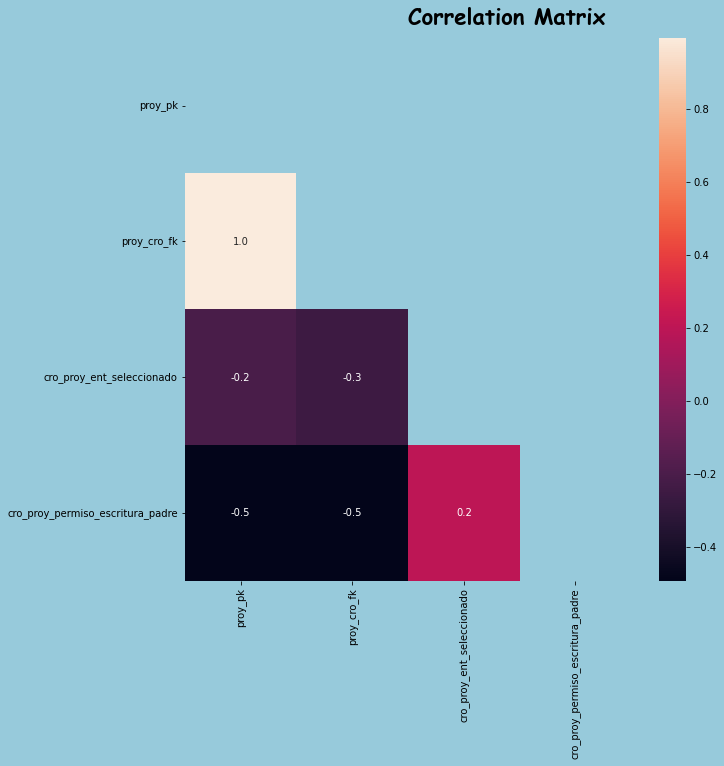

In [345]:
# Using a different way of correlation matrix

background_color = "#97CADB"

fig = plt.figure(figsize=(10,10))
gs = fig.add_gridspec(1,1)
gs.update(wspace=0.3, hspace=0.15)
ax0 = fig.add_subplot(gs[0,0])
fig.patch.set_facecolor(background_color) 
ax0.set_facecolor(background_color) 


mask = np.triu(np.ones_like(crono_corr))
ax0.text(2,-0.1,"Correlation Matrix",fontsize=22, fontweight='bold', fontfamily='cursive', color="#000000")
sns.heatmap(crono_corr,mask=mask,fmt=".1f",annot=True)
plt.show()

Las demas variables posee baja correlacion entre si, pero si observamos que cronograma en proyectos tienen alta correlacion.

Resumen:

Para ver si un proyecto termino en fecha o no no se usa el semaforo sino la fecha inicio y fin con sus torelancias pautadas.

# Presupuesto

Se realiza un EDA del presupuesto del proyecto

In [84]:
completo.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12952 entries, 0 to 15763
Data columns (total 53 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   proy_pk                           12952 non-null  int64  
 1   proy_area_fk                      12952 non-null  int64  
 2   proy_prog_fk                      9196 non-null   float64
 3   proy_cro_fk                       12952 non-null  float64
 4   proy_pre_fk                       12920 non-null  float64
 5   proy_proyindices_fk               12952 non-null  int64  
 6   proy_descripcion                  11229 non-null  string 
 7   proy_objetivo                     12952 non-null  string 
 8   proy_obj_publico                  12952 non-null  string 
 9   proy_situacion_actual             12634 non-null  string 
 10  proy_nombre                       12952 non-null  string 
 11  proy_fecha_crea                   11809 non-null  object 
 12  proy

In [85]:
presupuesto=completo.drop(['org_nombre','proy_cro_fk','cro_proy_ent_seleccionado','cro_proy_permiso_escritura_padre','proy_fecha_crea','proy_fecha_act','proy_fecha_est_act','proy_fecha_act_pub','proy_prog_fk','proy_proyindices_fk','proy_descripcion','proy_objetivo','proy_obj_publico','proy_situacion_actual','proy_nombre','proy_publicable','proy_otr_dat_fk','proy_obj_est_fk','proy_factor_impacto','ent_pk','ent_cro_fk','ent_id','ent_nombre','ent_nivel','ent_parent','ent_inicio','ent_duracion','ent_fin','ent_coord_usu_fk','ent_esfuerzo','ent_inicio_linea_base','ent_duracion_linea_base','ent_fin_linea_base','ent_predecesor_fk','ent_descripcion','ent_progreso','ent_relevante',],axis=1)
presupuesto.shape
                 

(12952, 16)

In [86]:
presupuesto.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12952 entries, 0 to 15763
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   proy_pk               12952 non-null  int64  
 1   proy_area_fk          12952 non-null  int64  
 2   proy_pre_fk           12920 non-null  float64
 3   area_pk               12952 non-null  int64  
 4   area_nombre           12952 non-null  string 
 5   area_abreviacion      12952 non-null  string 
 6   area_habilitada       12952 non-null  int64  
 7   pre_base              10432 non-null  float64
 8   pre_moneda            10146 non-null  float64
 9   pre_fuente_organi_fk  10061 non-null  float64
 10  mon_proy_pk           10146 non-null  float64
 11  mon_proy_nombre       10146 non-null  string 
 12  mon_proy_signo        10146 non-null  string 
 13  fue_pk                10061 non-null  float64
 14  fue_nombre            10061 non-null  string 
 15  fue_habilitada     

In [457]:
presupuesto.sample(5)

,proy_pk,proy_area_fk,proy_pre_fk,area_pk,area_nombre,area_abreviacion,area_habilitada,pre_base,pre_moneda,pre_fuente_organi_fk,mon_proy_pk,mon_proy_nombre,mon_proy_signo,fue_pk,fue_nombre,fue_habilitada
4906,5345,1,5246.0,1,Transformacin Organizacional,TO,1,NaN,NaN,NaN,NaN,<NA>,<NA>,NaN,<NA>,NaN
13156,1904,116,1758.0,116,Implantacin,Imp,1,477020.0,1.0,40.0,1.0,Pesos,$,40.0,BID 2591 GE II,0.0
10789,1904,116,1758.0,116,Implantacin,Imp,1,477020.0,1.0,40.0,1.0,Pesos,$,40.0,BID 2591 GE II,0.0
10294,1904,116,1758.0,116,Implantacin,Imp,1,477020.0,1.0,40.0,1.0,Pesos,$,40.0,BID 2591 GE II,0.0
13369,1904,116,1758.0,116,Implantacin,Imp,1,477020.0,1.0,40.0,1.0,Pesos,$,40.0,BID 2591 GE II,0.0


In [428]:
profile = pp.ProfileReport(presupuesto, title = "EDA_presupuesto")
profile.to_file(output_file="reporteEDA_presupuesto.html") 

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [413]:
df_indice_recet= presupuesto.reset_index()

<Figure size 1080x864 with 0 Axes>

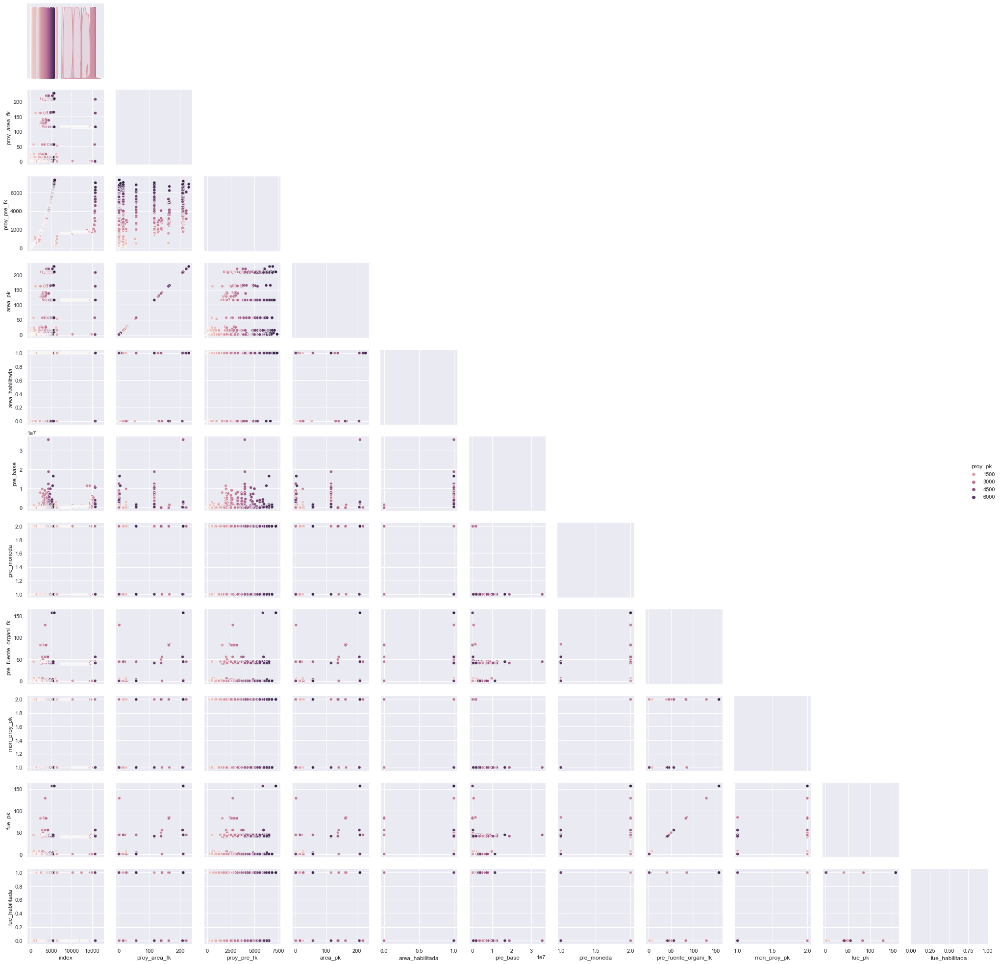

In [418]:
sns.set(style='darkgrid')
plt.figure(figsize=(15,12))
sns.pairplot(df_indice_recet, corner=True, hue='proy_pk')
plt.tight_layout()
plt.show()

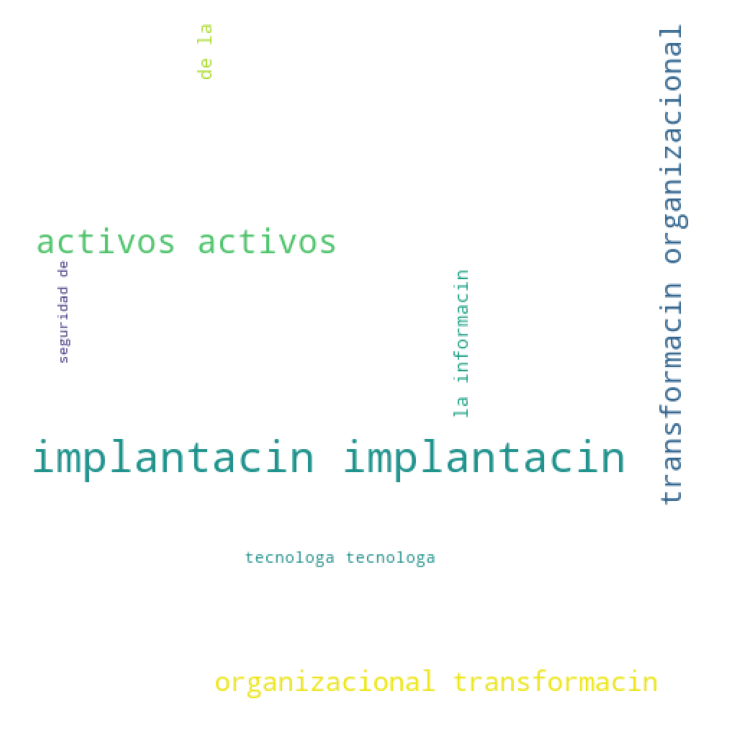

In [419]:
#Nube de palabras para “Group of weather parameters“.
# Python program to generate WordCloud
comment_words = ''
stopwords = set(STOPWORDS)
# iterate through the csv file
for val in presupuesto.area_nombre:
# typecaste each val to string
    val = str(val)
# split the value
    tokens = val.split()
# Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()   
    comment_words += " ".join(tokens)+" "
wordcloud = WordCloud(width = 500, height = 500,
                    background_color ='white',
                    stopwords = stopwords,
                    min_font_size = 10).generate(comment_words)
# plot the WordCloud image
plt.figure(figsize = (10, 10), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

In [420]:
count=presupuesto['area_habilitada'].value_counts() 
count

1    11645
0      453
Name: area_habilitada, dtype: int64

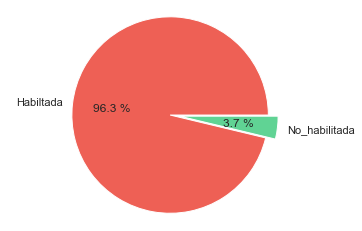

In [421]:
presupuesto = [11645,453]
nombres = ["Habiltada","No_habilitada"]
colores = ["#EE6055","#60D394"]
desfase = (0, 0.1)
plt.pie(presupuesto, labels=nombres, autopct="%0.1f %%", colors=colores, explode=desfase)
plt.axis("equal")
plt.show()

 El 96.3 % registros son de prespuestos de areas habiltadas mientras que el 3.7% es de areas no habilitadas esto es porque en un momento estuvieron habilitadas y se dieron de baja por alguna razon.

In [88]:
ver=presupuesto['pre_base']!= 0
ver

0        False
1        False
2        False
3        False
4        False
         ...  
15758     True
15759     True
15760     True
15762     True
15763     True
Name: pre_base, Length: 12952, dtype: bool

In [89]:
## Se completa pre base con un valor medio
presupuesto['pre_base'].fillna(presupuesto['pre_base'].median(), inplace=True)

In [90]:
presupuesto['pre_base'].sample(5)

13922    477020.0
13943    477020.0
10661    477020.0
1713     316440.0
918           0.0
Name: pre_base, dtype: float64

In [91]:
sns.set_style('darkgrid')
plt.rcParams['font.size'] = 14
plt.rcParams['figure.figsize'] = (20, 9)
plt.rcParams['figure.facecolor'] = '#00000000'
plt.rcParams['lines.linewidth'] = 2
# plt.style.use('fivethirtyeight')

In [92]:
pesos = presupuesto.query("mon_proy_signo == '$'")
dolares = presupuesto.query("mon_proy_signo == 'U$S '")


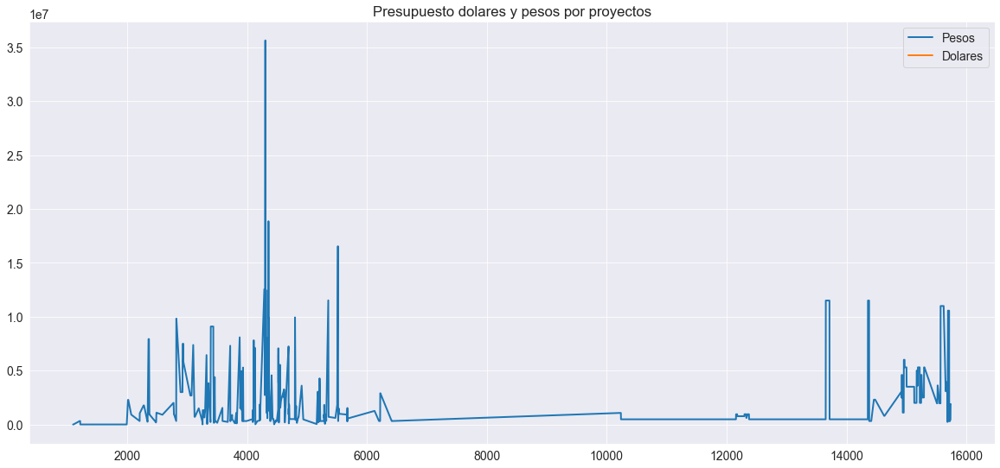

In [93]:
pesos['pre_base'].plot(label = "Pesos")
dolares['pre_base'].plot(label = 'Dolares')

plt.title('Presupuesto dolares y pesos por proyectos')
plt.legend()
plt.show()

La moneda que se toma en este caso no es la moneda del pago del proyecto sino que es la moneda de la adquiscion lo que se recomienda rever este tema. Se realiza mas abajo un EDA exhaustivo de pagos.

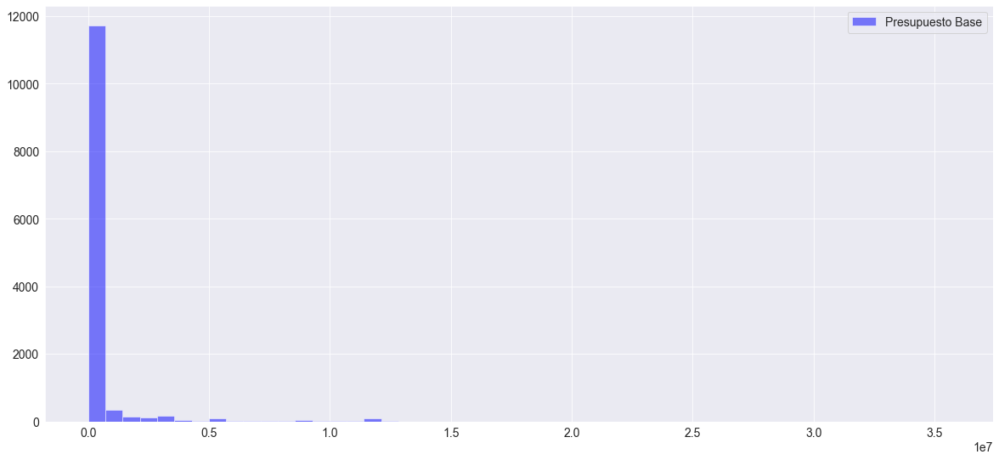

In [94]:
plt.hist(presupuesto['pre_base'], alpha=0.5, label='Presupuesto Base', bins=50, color='b')
plt.legend()
plt.rcParams['figure.figsize'] = (12, 9)

In [95]:
# Para ver los outliers
fig = px.box(presupuesto, y="pre_base")
fig.show()

# MODELO DE PREDICCION DE PROYECTOS 

En base al EDA que hicimos, las variables que inciden en proyectos son cronograma (tiempos), riesgos (alcance), costos (preupuesto), programa, entregables, lecciones aprendidas, fecha por el año en la cual se crea y duracion. En ese sentido, es por ello que realizaremos un modelo predictivo que nos permita identificar si un proyecto terminara con dificultades o no, entendiendo por dificultades es: atrazo en tiempo, sobre o sub ejecuccion de presupuesto, problemas con el alcance del mismo.  Para ello se realiza una analisis de las variables en base a la matriz de correlacion.

Modelo de Regresion Logistica proyecto con dificultad

La regresión logística es un algoritmo de clasificación lineal. La clasificación es un problema en el que la tarea es asignar una categoría/clase a una nueva instancia que aprende las propiedades de cada clase a partir de los datos etiquetados existentes, llamado conjunto de entrenamiento. Ejemplos de problemas de clasificación pueden ser la clasificación de correos electrónicos como spam y no spam, observar la altura, el peso y otros atributos para clasificar a una persona como apta o no apta, etc.

En estadística, el modelo logístico (o modelo logit) se utiliza para modelar la probabilidad de que exista una determinada clase o evento, como pasa/falla, gana/pierde, vivo/muerto o sano/enfermo.

# Modelo de regresion logistica si un proyecto termina con dificultad

In [2]:
df_modelo = pd.read_csv('DataModeloRegresion.csv', engine='python')

In [3]:
df_modelo.info(verbose = True, null_counts = True, buf=None, max_cols=None, memory_usage=None, show_counts=None)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38488 entries, 0 to 38487
Data columns (total 22 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Programa                33256 non-null  object 
 1   Proyecto                38488 non-null  object 
 2   Área                    38488 non-null  object 
 3   Orden                   38488 non-null  int64  
 4   Padre                   38486 non-null  float64
 5   Nombre                  38480 non-null  object 
 6   Tipo                    38488 non-null  object 
 7   Área.1                  36853 non-null  object 
 8   Avance                  37456 non-null  float64
 9   EstadoCronograma        37456 non-null  float64
 10  Inicio plan.            37456 non-null  object 
 11  Fin plan.               38488 non-null  object 
 12  Inicio                  37456 non-null  object 
 13  Fin                     38488 non-null  object 
 14  Duración plan.          37456 non-null

Datos del Dataset:
Estado_Cronograma= Termina Tarde=1 / Termina Bien =0
Tipo_Riesgo= Alto=1/Medio=2/Bajo=3
Tipo_Psp= Sobreejecuccion=1 / Subejecuccion=2 / Correcto=3 / NaN =0
Dificultad= Dificultad =1 / OK=0
Termina en= Tipo 1,2 = 1 dificil / Tipo 3OK=2 / NaN=0


train_test_split() nos permite también, de forma muy sencilla, realizar una división lineal de nuestros datos. Cargamos la librería:

In [4]:
#Eliminan las filas de esos registros
indexNames = df_modelo[df_modelo['Padre']==0].index
# Delete these row indexes from dataFrame

df_modelo.drop(indexNames,inplace=True)

In [5]:
df_modelo.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2424 entries, 0 to 38484
Data columns (total 22 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Programa                2118 non-null   object 
 1   Proyecto                2424 non-null   object 
 2   Área                    2424 non-null   object 
 3   Orden                   2424 non-null   int64  
 4   Padre                   2422 non-null   float64
 5   Nombre                  2421 non-null   object 
 6   Tipo                    2424 non-null   object 
 7   Área.1                  2417 non-null   object 
 8   Avance                  2423 non-null   float64
 9   EstadoCronograma        2423 non-null   float64
 10  Inicio plan.            2423 non-null   object 
 11  Fin plan.               2424 non-null   object 
 12  Inicio                  2423 non-null   object 
 13  Fin                     2424 non-null   object 
 14  Duración plan.          2423 non-null  

In [6]:
df_modelo.sample(5)

,Programa,Proyecto,Área,Orden,Padre,Nombre,Tipo,Área.1,Avance,EstadoCronograma,...,Inicio,Fin,Duración plan.,Duración,Anio,Cantidad_Riesgos,Tipo_Riesgo,Tipo_Presupuesto,Dificultad,Termina en presupuesto
5906,NaN,Transparencia Pasiva 2013,UAIP,1,1.0,Transparencia Pasiva 2013,Tarea,UAIP,100.0,0.0,...,31/12/2012,02/04/2014,457.0,456.0,2013,0,3,0,0,0
30960,Centro de Excelencia de Ciberseguridad,Línea de base de evaluación de impacto,Seguridad de la Información,1,1.0,Línea base de evaluación de Impacto,Tarea,Seguridad de la Información,99.0,1.0,...,28/02/2020,30/04/2021,428.0,428.0,2021,0,3,0,1,0
3267,NaN,Procesos del Área de Tecnología,Tecnología,1,1.0,Procesos del Área de Tecnología,Tarea,Tecnología,80.0,1.0,...,01/06/2012,19/06/2015,1113.0,1113.0,2012,0,3,3,1,2
26873,Gestión Humana,Encuesta de Clima organizacional,Planificación Estratégica,1,1.0,Encuesta de clima,Tarea,Planificación Estratégica,100.0,0.0,...,16/07/2019,27/12/2019,165.0,165.0,2019,0,3,0,0,0
4791,Consolidación TI del Estado 2013,Ampliación Cloud,Tecnología,1,1.0,Ampliación Cloud,Tarea,Infraestructura y Operaciones,100.0,0.0,...,31/12/2012,27/12/2013,360.0,360.0,2013,0,3,0,0,0


In [15]:
! python3 -m pip install scikit-learn

Python was not found; run without arguments to install from the Microsoft Store, or disable this shortcut from Settings > Manage App Execution Aliases.


In [19]:
!pip install sklearn

  Using cached scikit_learn-1.1.3-cp310-cp310-win_amd64.whl (7.5 MB)


In [7]:
from sklearn.model_selection import train_test_split 

In [8]:
train, test = train_test_split(df_modelo, test_size = 0.20, shuffle = False)

Ahora vamos a preparar los datos buscando los datos faltantes

In [130]:
train.isnull().tail() # obtenemos una matrix boleana donde se muestra datos nulos 

,Programa,Proyecto,Área,Orden,Padre,Nombre,Tipo,Área.1,Avance,EstadoCronograma,...,Inicio,Fin,Duración plan.,Duración,Anio,Cantidad_Riesgos,Tipo_Riesgo,Tipo_Presupuesto,Dificultad,Termina en presupuesto
29971,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
29974,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
29994,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
30005,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
30023,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [9]:
train.columns[train.isnull().any()]

Index(['Programa', 'Padre', 'Nombre', 'Área.1', 'Avance', 'EstadoCronograma',
       'Inicio plan.', 'Inicio', 'Duración plan.', 'Duración'],
      dtype='object')

In [10]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1939 entries, 0 to 30023
Data columns (total 22 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Programa                1718 non-null   object 
 1   Proyecto                1939 non-null   object 
 2   Área                    1939 non-null   object 
 3   Orden                   1939 non-null   int64  
 4   Padre                   1937 non-null   float64
 5   Nombre                  1936 non-null   object 
 6   Tipo                    1939 non-null   object 
 7   Área.1                  1933 non-null   object 
 8   Avance                  1938 non-null   float64
 9   EstadoCronograma        1938 non-null   float64
 10  Inicio plan.            1938 non-null   object 
 11  Fin plan.               1939 non-null   object 
 12  Inicio                  1938 non-null   object 
 13  Fin                     1939 non-null   object 
 14  Duración plan.          1938 non-null  

In [11]:
train['Avance'].isnull().sum()

1

In [12]:
train['EstadoCronograma'].isnull().sum()

1

In [13]:
#Eliminan las filas de esos registros
indexNames = train[train['Avance'].isnull()].index
# Delete these row indexes from dataFrame

train.drop(indexNames,inplace=True)

In [14]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1938 entries, 0 to 30023
Data columns (total 22 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Programa                1717 non-null   object 
 1   Proyecto                1938 non-null   object 
 2   Área                    1938 non-null   object 
 3   Orden                   1938 non-null   int64  
 4   Padre                   1936 non-null   float64
 5   Nombre                  1935 non-null   object 
 6   Tipo                    1938 non-null   object 
 7   Área.1                  1932 non-null   object 
 8   Avance                  1938 non-null   float64
 9   EstadoCronograma        1938 non-null   float64
 10  Inicio plan.            1938 non-null   object 
 11  Fin plan.               1938 non-null   object 
 12  Inicio                  1938 non-null   object 
 13  Fin                     1938 non-null   object 
 14  Duración plan.          1938 non-null  

In [15]:
train['EstadoCronograma'].isnull().sum()

0

In [16]:
#Eliminan las filas de esos registros
indexNames = train[train['EstadoCronograma'].isnull()].index
# Delete these row indexes from dataFrame

train.drop(indexNames,inplace=True)

In [17]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1938 entries, 0 to 30023
Data columns (total 22 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Programa                1717 non-null   object 
 1   Proyecto                1938 non-null   object 
 2   Área                    1938 non-null   object 
 3   Orden                   1938 non-null   int64  
 4   Padre                   1936 non-null   float64
 5   Nombre                  1935 non-null   object 
 6   Tipo                    1938 non-null   object 
 7   Área.1                  1932 non-null   object 
 8   Avance                  1938 non-null   float64
 9   EstadoCronograma        1938 non-null   float64
 10  Inicio plan.            1938 non-null   object 
 11  Fin plan.               1938 non-null   object 
 12  Inicio                  1938 non-null   object 
 13  Fin                     1938 non-null   object 
 14  Duración plan.          1938 non-null  

In [18]:
train['EstadoCronograma'].isnull().sum()

0

Como ya tenemos los datos nulos vamos a hacer un mapa de calor para tener una mejor visualizacion

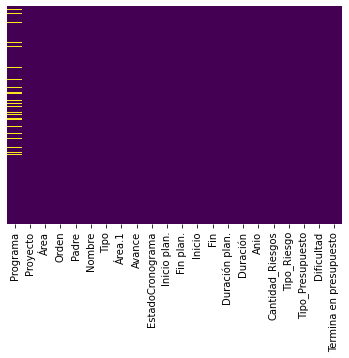

In [19]:
sns.heatmap(train.isnull(),yticklabels=False,cbar=False,cmap='viridis') # eliminamos eje Y , leyenda de las barras
plt.show()

Como se observa los NaN estan en programa, y esta bien que esten dado que no todos los proyectos estan asociados a programa y tampoco tienen porque estar.

Visualizamos rapidamente cuantos proyectos sin dificultades hubieron

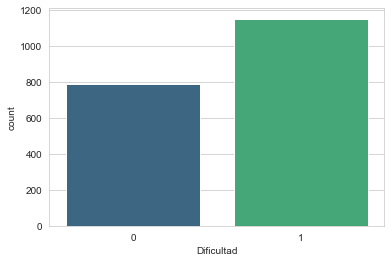

In [20]:
sns.set_style('whitegrid') # Estilo de la grilla 
sns.countplot(x='Dificultad',data=train,palette='viridis') 
plt.show()

In [21]:
dificultad=train['Dificultad'].value_counts() 
dificultad

1    1150
0     788
Name: Dificultad, dtype: int64

In [22]:
dificultaduno=1150
sindificultad=789
total=dificultaduno+ sindificultad
total

1939

In [23]:
(dificultaduno/total)*100

59.30892212480661

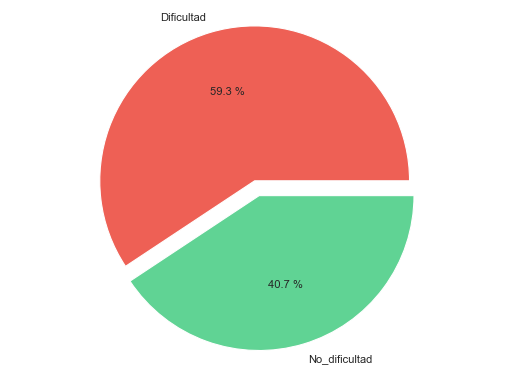

In [24]:
figure(figsize=(8, 6), dpi=80)
dificultad_padre = [1150,789]
nombres = ["Dificultad","No_dificultad"]
colores = ["#EE6055","#60D394"]
desfase = (0, 0.1)
plt.pie(dificultad_padre , labels=nombres, autopct="%0.1f %%", colors=colores, explode=desfase)
plt.axis("equal")
plt.show()

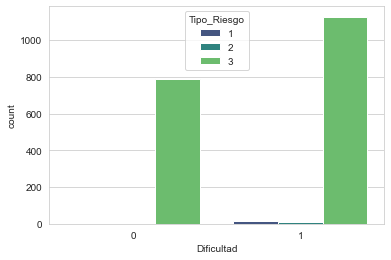

In [25]:
sns.set_style('whitegrid') # Estilo de la grilla 
sns.countplot(x='Dificultad',hue='Tipo_Riesgo',data=train,palette='viridis') 
plt.show()

Riesgo 1 son los altos, los Riesgos 2 son los medios y los riesgos 3 son los bajos.

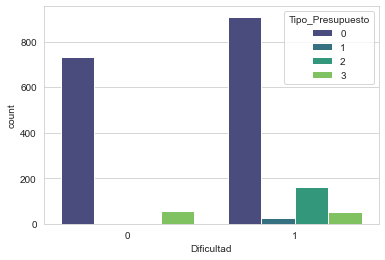

In [26]:
sns.set_style('whitegrid') # Estilo de la grilla 
sns.countplot(x='Dificultad',hue='Tipo_Presupuesto',data=train,palette='viridis') 
plt.show()

Sobreejcuccion son los 1, subeejecuccion son los 2  correcto son los 3, 100 es NaN

Como se observa el tipo de riesgos y el tipo de presupuesto inciden en la determinacion si un poryecto va terminar con dificultad o no. En nuestro caso con riesgo bajo presenta menor dificulta que con riesgo alto. En el caso de presupuesto si es correcto posee menor incidencia que termine con dificultad.

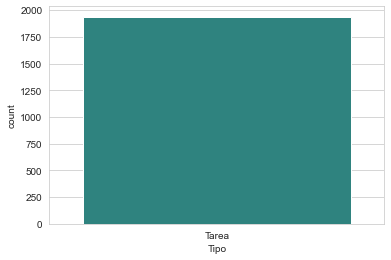

In [68]:
sns.set_style('whitegrid') # Estilo de la grilla 
sns.countplot(x='Tipo',data=train,palette='viridis') 
plt.show()

En este caso hito no no incide

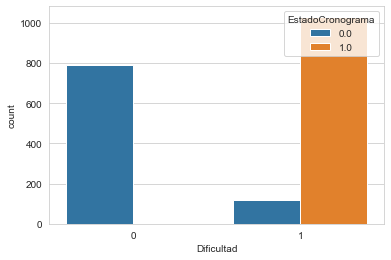

In [69]:
sns.countplot(x='Dificultad',hue='EstadoCronograma',data=train)
plt.show()

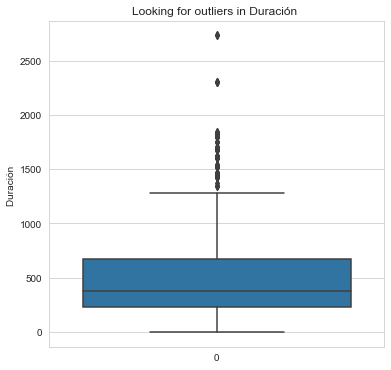

In [70]:
#Let's evaluate our 'Fare' variable.

plt.figure(figsize=(6,6))
sns.boxplot(data=train['Duración'])
plt.title('Looking for outliers in Duración ')
plt.ylabel('Duración ')
plt.show()

Si bien duracion posee oultliers no se ajusta dado que es una varaible valida por la naturaleza del proyecto.

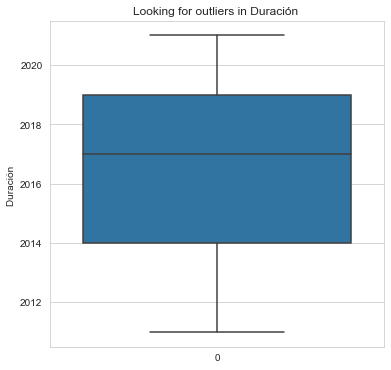

In [71]:
#Let's evaluate our 'Fare' variable.

plt.figure(figsize=(6,6))
sns.boxplot(data=train['Anio'])
plt.title('Looking for outliers in Duración ')
plt.ylabel('Duración ')
plt.show()


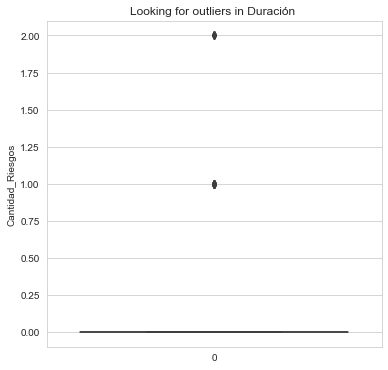

In [72]:
#Let's evaluate our 'Fare' variable.

plt.figure(figsize=(6,6))
sns.boxplot(data=train['Cantidad_Riesgos'])
plt.title('Looking for outliers in Duración ')
plt.ylabel('Cantidad_Riesgos')
plt.show()

Algunos valores atípicos representan variaciones naturales en la población y deben dejarse como están en su conjunto de datos. Estos se denominan valores atípicos verdaderos.

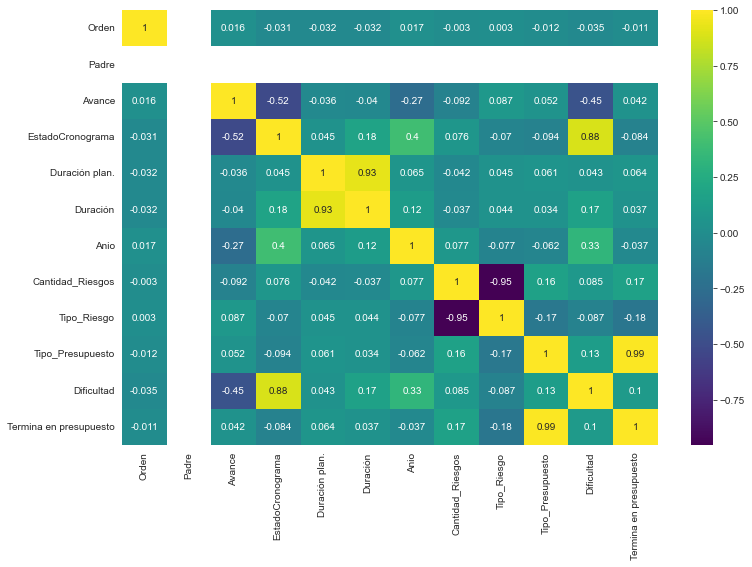

In [73]:
#Plotting a heatmap to find relations between features

plt.figure(figsize=(12, 8))
sns.heatmap(train.corr(), annot=True, cmap='viridis')
plt.show()

Analizando la matriz de correlacion las variables que inciden son: Estado del Cronograma y Avance con dificultad. El campo se riesgos no se visualiza con una correlacion alta respecto a dificultad. En el si le extraemos el filtro por tareas padre da la misma correlacion donde Avance inidce en un -0.64 y en el caso de Estado de Cronograma es 0.98. En el caso de las tareas padre el avance es del -0.45 y el Estado del Cronograma es del 0.88. Evaluar en este caso si lo mejor es filtrar por tarea padre o realizar para todas las tareas del cronograma.

In [531]:
profile = pp.ProfileReport(train, title = "EDA_Dificultad")
profile.to_file(output_file="reporteEDA_dificultad.html") 

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Retiro de las variables que no tienen importancia para nuestra prediccion
Realizamos el retiro de las variables que no tienen importancia dentro del estudio o no son numericos

In [33]:
train.drop(['Tipo_Presupuesto','Termina en presupuesto','Programa','Proyecto','Área','Orden','Padre','Nombre','Área.1','Tipo','Inicio plan.','Fin plan.','Inicio','Fin','Duración plan.','Duración','Cantidad_Riesgos','Tipo_Riesgo','Anio'],axis=1,inplace=True)

In [34]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1938 entries, 0 to 30023
Data columns (total 3 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Avance            1938 non-null   float64
 1   EstadoCronograma  1938 non-null   float64
 2   Dificultad        1938 non-null   int64  
dtypes: float64(2), int64(1)
memory usage: 60.6 KB


In [35]:
train.head(5)

,Avance,EstadoCronograma,Dificultad
0,100.0,0.0,0
22,100.0,0.0,0
70,81.0,1.0,1
104,100.0,0.0,0
119,100.0,0.0,0


Avance es en numeros que son pocentaje de avance por proyecto.
Estado del avance es 1 termina tarde =1 y termina bien =0 es un marge del desviacion del 20%
Dificultad es 1, con dificultad y cero termina bien.

# Construyendo el modelo de regresion :

Separate features and target as X and y

In [36]:
X = train.drop(['Dificultad'], axis=1)
y = train['Dificultad']

Split dataframe in training set and testing set

In [37]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [38]:
X_train.isnull().values.any()

False

In [39]:
X_train.isnull().sum()

Avance              0
EstadoCronograma    0
dtype: int64

In [40]:
from sklearn.linear_model import LogisticRegression

# Instantiate Logistic Regression

model = LogisticRegression()

In [41]:
# Fit the data

model.fit(X_train, y_train)

LogisticRegression()

In [151]:
# Make predictions
y_pred = model.predict(X_test)
y_pred

array([1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0,
       0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0,
       0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1,
       0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1,
       1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1,
       0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1,
       0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1,
       0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0,
       1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0,
       1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1,
       0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1,
       0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0,

In [152]:
# Check the accuracy score

from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.metrics import roc_auc_score

accuracy_score(y_test, y_pred)

0.9329896907216495

In [153]:
# Confusion Matrix

dificultad_cm = confusion_matrix(y_pred, y_test)
dificultad_cm

array([[164,  24],
       [  2, 198]], dtype=int64)

Grafica la Matriz Confusion

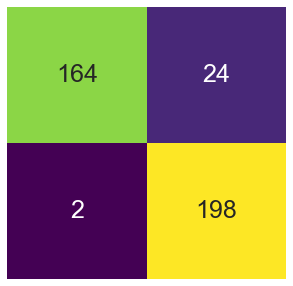

In [154]:
# convert the ndarray to a pandas dataframe
cm_df = pd.DataFrame(dificultad_cm)
# set the size of the figure
plt.figure(figsize = (5,5))
sns.heatmap(cm_df, 
           annot=True, annot_kws={"size": 25},
           fmt="d",         # decimals format
           xticklabels=False, 
           yticklabels=False,
           cmap="viridis", 
           cbar=False)
plt.show()

Esatas 4  opciones  se conocen como la matriz de confusión.  Veamos de nuevo esos  4 resultados posibles:

Verdadero positivo: El valor real es positivo y  la prueba predijo tambien que era positivo. O bien una persona está enferma y la prueba así lo demuestra.
Verdadero negativo: El valor real  es negativo y la prueba predijo tambien que el resultado era negativo. O bien la persona no está enferma y la prueba así lo  demuestra.
Falso negativo: El valor real es positivo, y la prueba predijo  que el resultado es negativo. La persona está enferma, pero la prueba dice de manera incorrecta que no lo está. Esto es lo que en estadística se conoce como error tipo II
Falso positivo: El valor real es negativo, y la prueba predijo  que el resultado es positivo. La persona no está enferma, pero la prueba nos dice de manera incorrecta que silo está.
Esto es lo que en estadística se conoce como error tipo I
A partir de estas 4 opciones  surgen las métricas de la matriz de confusión :  Por una parte la exactitud y la precisión y por otra la Sensibilidad y la Especificidad. 

https://www.juanbarrios.com/la-matriz-de-confusion-y-sus-metricas/

Usemos GridSearch para ver cuáles serían los mejores hiperparámetros para nuestro modelo de regresión logística.

El siguiente código muestra una cuadrícula que busca los hiperparámetros clave para LogisticRegression en un conjunto de datos de clasificación binaria, en este caso, nuestro conjunto de datos.

In [87]:
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression

# define models and parameters

model = LogisticRegression()
solvers = ['newton-cg', 'lbfgs', 'liblinear']
penalty = ['l2']
c_values = [100, 10, 1.0, 0.1, 0.01]

# define grid search

grid = dict(solver=solvers,penalty=penalty,C=c_values)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(X, y)

# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.938065 using {'C': 100, 'penalty': 'l2', 'solver': 'newton-cg'}
0.938065 (0.018774) with: {'C': 100, 'penalty': 'l2', 'solver': 'newton-cg'}
0.938065 (0.018774) with: {'C': 100, 'penalty': 'l2', 'solver': 'lbfgs'}
0.938065 (0.018774) with: {'C': 100, 'penalty': 'l2', 'solver': 'liblinear'}
0.938065 (0.018774) with: {'C': 10, 'penalty': 'l2', 'solver': 'newton-cg'}
0.938065 (0.018774) with: {'C': 10, 'penalty': 'l2', 'solver': 'lbfgs'}
0.938065 (0.018774) with: {'C': 10, 'penalty': 'l2', 'solver': 'liblinear'}
0.937721 (0.019419) with: {'C': 1.0, 'penalty': 'l2', 'solver': 'newton-cg'}
0.937721 (0.019419) with: {'C': 1.0, 'penalty': 'l2', 'solver': 'lbfgs'}
0.938065 (0.018774) with: {'C': 1.0, 'penalty': 'l2', 'solver': 'liblinear'}
0.935486 (0.019457) with: {'C': 0.1, 'penalty': 'l2', 'solver': 'newton-cg'}
0.935486 (0.019457) with: {'C': 0.1, 'penalty': 'l2', 'solver': 'lbfgs'}
0.938065 (0.018774) with: {'C': 0.1, 'penalty': 'l2', 'solver': 'liblinear'}
0.935486 (0.019457) wit

Solver newton-cg solo admite penalizaciones 'l2' o 'ninguna', es por eso que solo incluimos 'l2'.

Observaciones: De hecho, obtuvimos una mejor puntuación primero. Confirmemos esto obteniendo de nuevo la matriz de confusión.

In [88]:
# Hypertune parameters

optimized_model = LogisticRegression(C= 0.1, penalty='l2', solver= 'newton-cg')

In [89]:
# Fit the data

optimized_model.fit(X_train, y_train)

LogisticRegression(C=0.1, solver='newton-cg')

In [90]:
# Make predictions
y_pred = optimized_model.predict(X_test)
y_pred

array([1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0,
       0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0,
       0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1,
       0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1,
       1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1,
       0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1,
       0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1,
       0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0,
       1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0,
       1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1,
       0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1,
       0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0,

In [91]:
# Check the accuracy score

from sklearn.metrics import accuracy_score, confusion_matrix

accuracy_score(y_pred, y_test)

0.9304123711340206

In [92]:
# Confusion Matrix

confusion_matrix(y_pred, y_test)

array([[163,  24],
       [  3, 198]], dtype=int64)

Eliminación de características recursivas

Dado un estimador externo que asigna pesos a las características, la eliminación recursiva de características (RFE) consiste en seleccionar características considerando recursivamente conjuntos de características cada vez más pequeños. Primero, el estimador se entrena en el conjunto inicial de características y la importancia de cada característica se obtiene a través de un atributo coef_ o mediante un atributo feature_importances_. Luego, las características menos importantes se eliminan del conjunto actual de funciones. Ese procedimiento se repite recursivamente en el conjunto eliminado hasta que finalmente se alcanza el número deseado de funciones para seleccionar.

In [93]:
from sklearn.feature_selection import RFE

# create the RFE model and select 9 attributes
rfe = RFE(model, n_features_to_select=9)
rfe = rfe.fit(X, y)

# summarize the selection of the attributes
print('Selected features: %s' % list(X.columns[rfe.support_]))

Selected features: ['Avance', 'EstadoCronograma']


Clasificación de funciones con eliminación recursiva de funciones y validación cruzada

RFECV realiza RFE en un ciclo de validación cruzada para encontrar el número óptimo o el mejor número de características. A continuación, se aplica una eliminación recursiva de características en regresión logística con ajuste automático del número de características seleccionadas con validación cruzada.

Optimal number of features: 1
Selected features: ['EstadoCronograma']


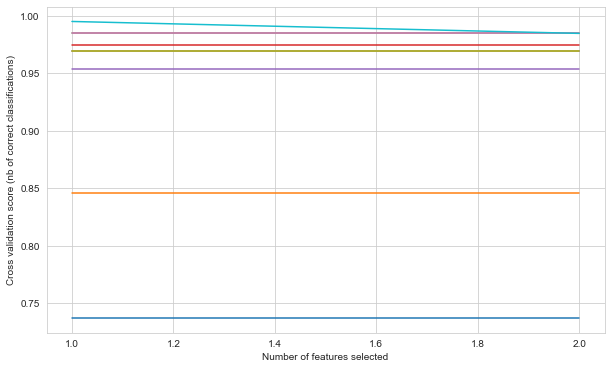

In [94]:
from sklearn.feature_selection import RFECV

# Create the RFE object and compute a cross-validated score.
# The "accuracy" scoring is proportional to the number of correct classifications

rfecv = RFECV(estimator=LogisticRegression(), step=1, cv=10, scoring='accuracy')
rfecv.fit(X, y)

print("Optimal number of features: %d" % rfecv.n_features_)
print('Selected features: %s' % list(X.columns[rfecv.support_]))

# Plot number of features VS. cross-validation scores

plt.figure(figsize=(10,6))
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score (nb of correct classifications)")
plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_)
plt.show()

In [95]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, classification_report, precision_score, recall_score 
from sklearn.metrics import confusion_matrix, precision_recall_curve, roc_curve, auc, log_loss

Selected_features = ['Avance', 'EstadoCronograma']

# create new X (selected features) 
new_X = train[Selected_features]

# 10-fold cross-validation logistic regression, using the best hyperparameters gridsearch got for us.

logreg = LogisticRegression(C= 0.1, penalty='l2', solver= 'newton-cg')

# Use cross_val_score function
# We are passing the entirety of X and y, not X_train or y_train anymore.
# cv=10 for 10 folds
# scoring = {'accuracy', 'neg_log_loss', 'roc_auc'} for evaluation metric

scores_accuracy = cross_val_score(logreg, new_X, y, cv=10, scoring='accuracy')
scores_log_loss = cross_val_score(logreg, new_X, y, cv=10, scoring='neg_log_loss')
scores_auc = cross_val_score(logreg, new_X, y, cv=10, scoring='roc_auc')

print('K-fold cross-validation results:')
print(logreg.__class__.__name__+" average accuracy is %2.3f" % scores_accuracy.mean())
print(logreg.__class__.__name__+" average log_loss is %2.3f" % -scores_log_loss.mean())
print(logreg.__class__.__name__+" average auc is %2.3f" % scores_auc.mean())

K-fold cross-validation results:
LogisticRegression average accuracy is 0.936
LogisticRegression average log_loss is 0.227
LogisticRegression average auc is 0.945


In [96]:
# Let's fit our entire train data with this model

logreg.fit(new_X,y)

LogisticRegression(C=0.1, solver='newton-cg')

En el siguiente código, veamos cómo generar nuestras predicciones y guardarlas en un archivo de predicciones con el Id correcto.

In [97]:


#Adding the column survived to clean test set in order to make predictions

train['Dificultad'] = logreg.predict(train[Selected_features])

#Creating a final predictions dataframe

submission = train[['Dificultad','Dificultad']]


submission.to_csv("submission.csv", index=False)

Mirar la cola de la predccion

In [98]:
submission.tail()

,Dificultad,Dificultad
29971,0,0
29974,1,1
29994,1,1
30005,1,1
30023,1,1


In [99]:
submission.head(5)

,Dificultad,Dificultad
0,0,0
22,0,0
70,1,1
104,0,0
119,0,0


In [100]:
submission.sample(5)

,Dificultad,Dificultad
13874,0,0
11867,0,0
15203,1,1
19014,0,0
27908,0,0


# Probamos el modelo con nuevos datos que le ingresamos

In [102]:
print(classification_report(y_pred, y_test))

              precision    recall  f1-score   support

           0       0.98      0.87      0.92       187
           1       0.89      0.99      0.94       201

    accuracy                           0.93       388
   macro avg       0.94      0.93      0.93       388
weighted avg       0.94      0.93      0.93       388



In [52]:
x_nuevo = pd.DataFrame({'Avance': [100], 'EstadoCronograma': [0]})

In [54]:
x_nuevo 

,Avance,EstadoCronograma
0,100,0


In [55]:
model.predict(x_nuevo)


array([0], dtype=int64)

In [157]:
x_nuevo1 = pd.DataFrame({'Avance': [0], 'EstadoCronograma': [1]})

In [158]:
model.predict(x_nuevo1)

array([1], dtype=int64)

In [161]:
# Save the model
filename ='modelregresiondificultad.sav'
pickle.dump(model, open(filename, 'wb'))

# Modelo si un proyecto terminara fuera de presupuesto sub o sobre prespuesto.

En base al analisis anterior ya tenemos evaluadas las variables es por ello que vamos a proceder a la parte del modelo

In [288]:
df_model1 = pd.read_csv('DataModeloRegresion.csv', engine='python')

In [290]:
#Eliminan las filas de esos registros
indexNames = df_model1[df_model1['Padre']==0].index
# Delete these row indexes from dataFrame
df_model1.drop(indexNames,inplace=True)

In [291]:
#Eliminan las filas de esos registros que son NaN que son igual 0
indexNames = df_model1[df_model1['Termina en presupuesto']==0].index
# Delete these row indexes from dataFrame
df_model1.drop(indexNames,inplace=True)

In [292]:
train, test = train_test_split(df_model1, test_size = 0.20, shuffle = False)

In [293]:
train.drop(['Dificultad','EstadoCronograma','Programa','Proyecto','Área','Orden','Padre','Nombre','Área.1','Tipo','Inicio plan.','Fin plan.','Inicio','Fin','Duración','Cantidad_Riesgos','Anio'],axis=1,inplace=True)

In [294]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 264 entries, 708 to 26582
Data columns (total 5 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Avance                  264 non-null    float64
 1   Duración plan.          264 non-null    float64
 2   Tipo_Riesgo             264 non-null    int64  
 3   Tipo_Presupuesto        264 non-null    int64  
 4   Termina en presupuesto  264 non-null    int64  
dtypes: float64(2), int64(3)
memory usage: 12.4 KB


In [295]:
#Renombramos la columna en termina en presupuesto por no termina en presupiesto 
train = train.rename(columns={'Termina en presupuesto':'No_termina_presupuesto'})
train.columns

Index(['Avance', 'Duración plan.', 'Tipo_Riesgo', 'Tipo_Presupuesto',
       'No_termina_presupuesto'],
      dtype='object')

In [296]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 264 entries, 708 to 26582
Data columns (total 5 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Avance                  264 non-null    float64
 1   Duración plan.          264 non-null    float64
 2   Tipo_Riesgo             264 non-null    int64  
 3   Tipo_Presupuesto        264 non-null    int64  
 4   No_termina_presupuesto  264 non-null    int64  
dtypes: float64(2), int64(3)
memory usage: 12.4 KB


In [297]:
train['Duración plan.'].isnull().sum()

0

In [298]:
#Eliminan las filas de esos registros
indexNames = train[train['Duración plan.'].isnull()].index
# Delete these row indexes from dataFrame

train.drop(indexNames,inplace=True)

In [299]:
train['Tipo_Riesgo'].isnull().sum()

0

In [300]:
train['Tipo_Presupuesto'].isnull().sum()

0

In [301]:
train['No_termina_presupuesto'].isnull().sum()

0

In [302]:
#Eliminan las filas de esos registros
indexNames = train[train['Avance'].isnull()].index
# Delete these row indexes from dataFrame

train.drop(indexNames,inplace=True)

In [303]:
train['Avance'].isnull().sum()

0

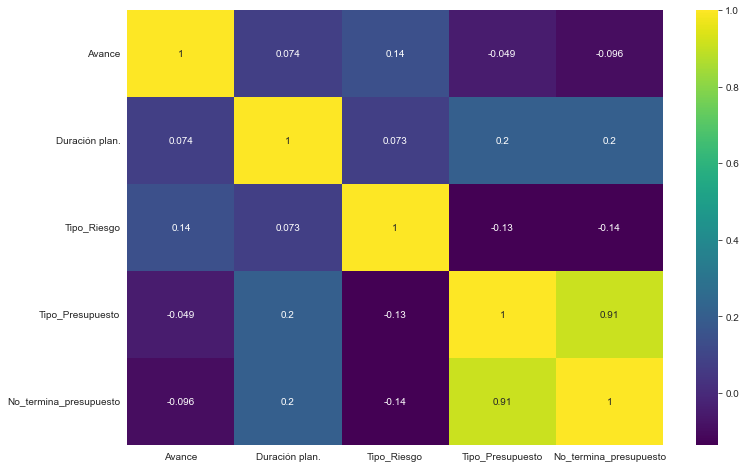

In [304]:
#Plotting a heatmap to find relations between features

plt.figure(figsize=(12, 8))
sns.heatmap(train.corr(), annot=True, cmap='viridis')
plt.show()

Se probo el modelo con las variables de Tipo_prsupuesto, Tipo_Riesgo, Duracion plan. y Avance, el mejor score nos da Tipo_presupuesto con Duracion plan que nos predice si y proyecto No_termina en presupuesto.

In [305]:
train.drop(['Tipo_Riesgo','Avance'],axis=1,inplace=True)

Construyendo el Modelo

Separate features and target as X and y

In [306]:
X = train.drop(['No_termina_presupuesto'], axis=1)
y = train['No_termina_presupuesto']

In [307]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [308]:
from sklearn.linear_model import LogisticRegression

# Instantiate Logistic Regression

modelo = LogisticRegression()

In [309]:
# Fit the data

modelo.fit(X_train, y_train)

LogisticRegression()

In [310]:
# Make predictions
y_pred = optimized_model.predict(X_test)
y_pred

array([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int64)

In [276]:
# Check the accuracy score

from sklearn.metrics import accuracy_score, confusion_matrix

accuracy_score(y_pred, y_test)

0.770618556701031

In [311]:
# Confusion Matrix

presupuesto_cm = confusion_matrix(y_pred, y_test)
presupuesto_cm

array([[ 0, 32, 20],
       [ 0,  0,  1],
       [ 0,  0,  0]], dtype=int64)

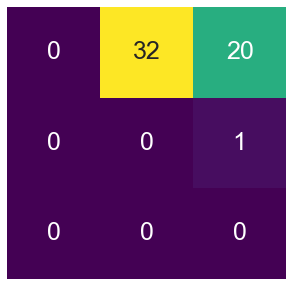

In [312]:
# convert the ndarray to a pandas dataframe
cm_df = pd.DataFrame(presupuesto_cm)
# set the size of the figure
plt.figure(figsize = (5,5))
sns.heatmap(cm_df, 
           annot=True, annot_kws={"size": 25},
           fmt="d",         # decimals format
           xticklabels=False, 
           yticklabels=False,
           cmap="viridis", 
           cbar=False)
plt.show()

In [313]:
from sklearn.feature_selection import RFE

# create the RFE model and select 9 attributes
rfe = RFE(model, n_features_to_select=9)
rfe = rfe.fit(X, y)

# summarize the selection of the attributes
print('Selected features: %s' % list(X.columns[rfe.support_]))

Selected features: ['Duración plan.', 'Tipo_Presupuesto']


Optimal number of features: 1
Selected features: ['Tipo_Presupuesto']


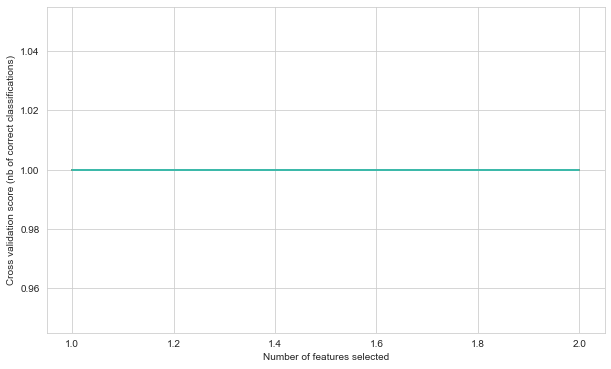

In [315]:
from sklearn.feature_selection import RFECV

# Create the RFE object and compute a cross-validated score.
# The "accuracy" scoring is proportional to the number of correct classifications

rfecv = RFECV(estimator=LogisticRegression(), step=1, cv=10, scoring='accuracy')
rfecv.fit(X, y)

print("Optimal number of features: %d" % rfecv.n_features_)
print('Selected features: %s' % list(X.columns[rfecv.support_]))

# Plot number of features VS. cross-validation scores

plt.figure(figsize=(10,6))
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score (nb of correct classifications)")
plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_)
plt.show()

In [316]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, classification_report, precision_score, recall_score 
from sklearn.metrics import confusion_matrix, precision_recall_curve, roc_curve, auc, log_loss

Selected_features = ['Duración plan.', 'Tipo_Presupuesto']

# create new X (selected features) 
new_X = train[Selected_features]

# 10-fold cross-validation logistic regression, using the best hyperparameters gridsearch got for us.

logreg = LogisticRegression(C= 0.1, penalty='l2', solver= 'newton-cg')

# Use cross_val_score function
# We are passing the entirety of X and y, not X_train or y_train anymore.
# cv=10 for 10 folds
# scoring = {'accuracy', 'neg_log_loss', 'roc_auc'} for evaluation metric

scores_accuracy = cross_val_score(logreg, new_X, y, cv=10, scoring='accuracy')
scores_log_loss = cross_val_score(logreg, new_X, y, cv=10, scoring='neg_log_loss')
scores_auc = cross_val_score(logreg, new_X, y, cv=10, scoring='roc_auc')

print('K-fold cross-validation results:')
print(logreg.__class__.__name__+" average accuracy is %2.3f" % scores_accuracy.mean())
print(logreg.__class__.__name__+" average log_loss is %2.3f" % -scores_log_loss.mean())
print(logreg.__class__.__name__+" average auc is %2.3f" % scores_auc.mean())

K-fold cross-validation results:
LogisticRegression average accuracy is 1.000
LogisticRegression average log_loss is 0.233
LogisticRegression average auc is 1.000


En este caso como borramos los registros que tienen NaN podemos probar solo con 264 registros lo cual es un valor bajo para un modelo rpresentando el 0.1% en datos de los valores totales y por dicho motivo lo descartamos por no se un modelo predictor quedandos con el modelo en dificultad.

In [317]:
# Let's fit our entire train data with this model

logreg.fit(new_X,y)

LogisticRegression(C=0.1, solver='newton-cg')

In [318]:
#Adding the column survived to clean test set in order to make predictions

train['No_termina_presupuesto'] = logreg.predict(train[Selected_features])

#Creating a final predictions dataframe

submission = train[['No_termina_presupuesto', 'No_termina_presupuesto']]


submission.to_csv("submission.csv", index=False)

In [286]:
submission.tail()

,No_termina_presupuesto,No_termina_presupuesto
29971,0,0
29974,0,0
29994,0,0
30005,0,0
30023,0,0


Revisar: https://www.kaggle.com/code/alexbonella/prediccion-titanic-regresion-logistica

Vamos a utilizar pandas profile para eso usamos los siguientes links
https://www.kaggle.com/code/danielsilvaavila/big-data-analysis
https://pandas-profiling.ydata.ai/docs/master/pages/getting_started/overview.html https://www.kaggle.com/code/alexbonella/prediccion-titanic-regresion-logistica

# MODELO TIME SERIES DE PREDICCION DEL COMPORTAMIENTO DEL PRESUPUESTO 


Es importante conocer como es el comportamiento del sistema en cuanto al pago y sus adquisiones, donde el monto se registra con la modena original, la adquisición está definida en pesos, el pago sería en pesos, peros si la adquisición es en dólares, entonces ese monto del pago representa dólares.





In [62]:
df_pagos = pd.read_csv("pagos_moneda_filtro_campos.csv", engine="python", sep=',', quotechar='"', error_bad_lines=False)

In [63]:
df_pagos.sample(5)

,pag_pk,pag_fecha_planificada,pag_importe_planificado,pag_fecha_real,pag_importe_real,pag_confirmar,mon_pk,mon_nombre
5294,13898,2020-10-26 00:00:00,48954.0,2020-12-31 00:00:00,0.0,1.0,1,Pesos
14037,2074,2016-09-29 00:00:00,880.0,2016-08-03 00:00:00,550.0,1.0,2,Dlares
7484,20116,2019-12-29 00:00:00,0.0,2019-11-25 00:00:00,3923.0,1.0,1,Pesos
17717,16890,2019-10-30 00:00:00,2977.0,2019-10-30 00:00:00,0.0,1.0,2,Dlares
16247,11471,2018-10-30 00:00:00,1485.0,2018-07-02 00:00:00,0.0,1.0,2,Dlares


In [64]:
df_pagos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20238 entries, 0 to 20237
Data columns (total 8 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   pag_pk                   20238 non-null  int64  
 1   pag_fecha_planificada    20238 non-null  object 
 2   pag_importe_planificado  20238 non-null  float64
 3   pag_fecha_real           19563 non-null  object 
 4   pag_importe_real         19760 non-null  float64
 5   pag_confirmar            17952 non-null  float64
 6   mon_pk                   20238 non-null  int64  
 7   mon_nombre               20238 non-null  object 
dtypes: float64(3), int64(2), object(3)
memory usage: 1.2+ MB


In [65]:
df_pagos['pag_confirmar'].isnull().sum()

2286

En este caso serian un 12% de los registros que posee NaN y se eliminaran del data set, dado que palicar promedio no tendria sentido y sustituir por cero tampoco porque estariamos cambiando su valor.

In [66]:
#Eliminan las filas de esos registros
indexNames = df_pagos[df_pagos['pag_confirmar'].isnull()].index
# Delete these row indexes from dataFrame

df_pagos.drop(indexNames,inplace=True)

In [67]:
df_pagos['pag_confirmar'].isnull().sum()

0

In [68]:
df_pagos.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17952 entries, 106 to 20233
Data columns (total 8 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   pag_pk                   17952 non-null  int64  
 1   pag_fecha_planificada    17952 non-null  object 
 2   pag_importe_planificado  17952 non-null  float64
 3   pag_fecha_real           17647 non-null  object 
 4   pag_importe_real         17643 non-null  float64
 5   pag_confirmar            17952 non-null  float64
 6   mon_pk                   17952 non-null  int64  
 7   mon_nombre               17952 non-null  object 
dtypes: float64(3), int64(2), object(3)
memory usage: 1.2+ MB


Del analisis del profile los datos que vamos analizar queremos quedarnos con= Pago_Pk, pago_fecha_planificado, pago_importe_planificado, pago_fecha_real, pago_import_real, pag_confirmar =1. En este caso nos interesa el pago confirmar=1 dado que son los pagos confirmados por el responsable de los proyectos/programas. Descartamos los no confirmados con el fin de quedarnos con los datos certeros. 
Es conveniente recordar que para el modelo de prediccion vamos a proyectar sobre los datos reales.
Y no se realizar una apertura por proveedor. 

In [69]:
#Eliminan las filas de esos registros de los no confirmados.
indexNames = df_pagos[df_pagos['pag_confirmar']==0].index
# Delete these row indexes from dataFrame
df_pagos.drop(indexNames,inplace=True)

In [70]:
df_pagos.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16039 entries, 106 to 20226
Data columns (total 8 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   pag_pk                   16039 non-null  int64  
 1   pag_fecha_planificada    16039 non-null  object 
 2   pag_importe_planificado  16039 non-null  float64
 3   pag_fecha_real           16039 non-null  object 
 4   pag_importe_real         16039 non-null  float64
 5   pag_confirmar            16039 non-null  float64
 6   mon_pk                   16039 non-null  int64  
 7   mon_nombre               16039 non-null  object 
dtypes: float64(3), int64(2), object(3)
memory usage: 1.1+ MB


In [108]:
profile = pp.ProfileReport(df_pagos, title = "EDA_Pagos")
profile.to_file(output_file="reporteEDA_Pagos.html") 

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [71]:
Financial_companies = df_pagos[df_pagos['mon_nombre']=='Pesos']
count_fc = Financial_companies.groupby(['mon_nombre'])['mon_nombre'].count()
count_fc

mon_nombre
Pesos    10795
Name: mon_nombre, dtype: int64

In [72]:
Financial_companies = df_pagos[df_pagos['mon_nombre']=='Dlares']
count_fc = Financial_companies.groupby(['mon_nombre'])['mon_nombre'].count()
count_fc

mon_nombre
Dlares    5242
Name: mon_nombre, dtype: int64

In [73]:
Financial_companies = df_pagos[df_pagos['mon_nombre']=='Euros']
count_fc = Financial_companies.groupby(['mon_nombre'])['mon_nombre'].count()
count_fc

mon_nombre
Euros    2
Name: mon_nombre, dtype: int64

El 67% de los pagos son pesos. El 32% es en dolares, el 1% Euros.

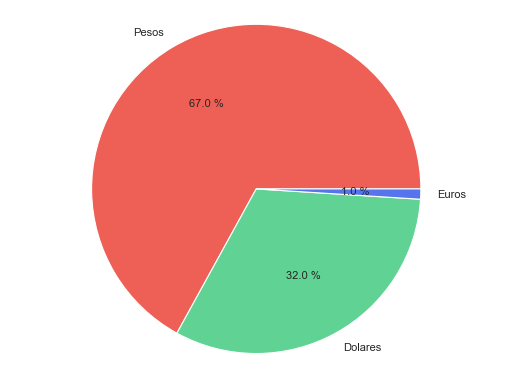

In [74]:
figure(figsize=(8, 6), dpi=80)
non_nombre_grf = [67,32,1]
nombres = ["Pesos","Dolares","Euros"]
colores = ["#EE6055","#60D394","#5574ee"]
desfase = (0,0,0)
plt.pie(non_nombre_grf , labels=nombres, autopct="%0.1f %%", colors=colores, explode=desfase)
plt.axis("equal")
plt.show()

In [113]:
df_pagos.describe()

,pag_pk,pag_importe_planificado,pag_importe_real,pag_confirmar,mon_pk
count,16039.000000,1.603900e+04,1.603900e+04,16039.0,16039.000000
mean,16462.551219,1.779726e+05,1.728435e+05,1.0,1.327078
std,9184.632990,7.335349e+05,8.001071e+05,0.0,0.469426
min,125.000000,-4.306824e+06,-4.306824e+06,1.0,1.000000
25%,8760.500000,1.000000e+03,1.145000e+03,1.0,1.000000
50%,15624.000000,1.090000e+04,1.049280e+04,1.0,1.000000
75%,24214.500000,9.737700e+04,8.066050e+04,1.0,2.000000
max,35348.000000,1.196341e+07,3.900148e+07,1.0,3.000000


In [114]:
import plotly.express as px
fig = px.box(df_pagos, y="pag_importe_real")
fig.show()

In [115]:
import plotly.express as px
fig = px.box(df_pagos, y="pag_importe_planificado")
fig.show()

In [75]:
df_indice_recet= df_pagos.reset_index()

<Figure size 1080x864 with 0 Axes>

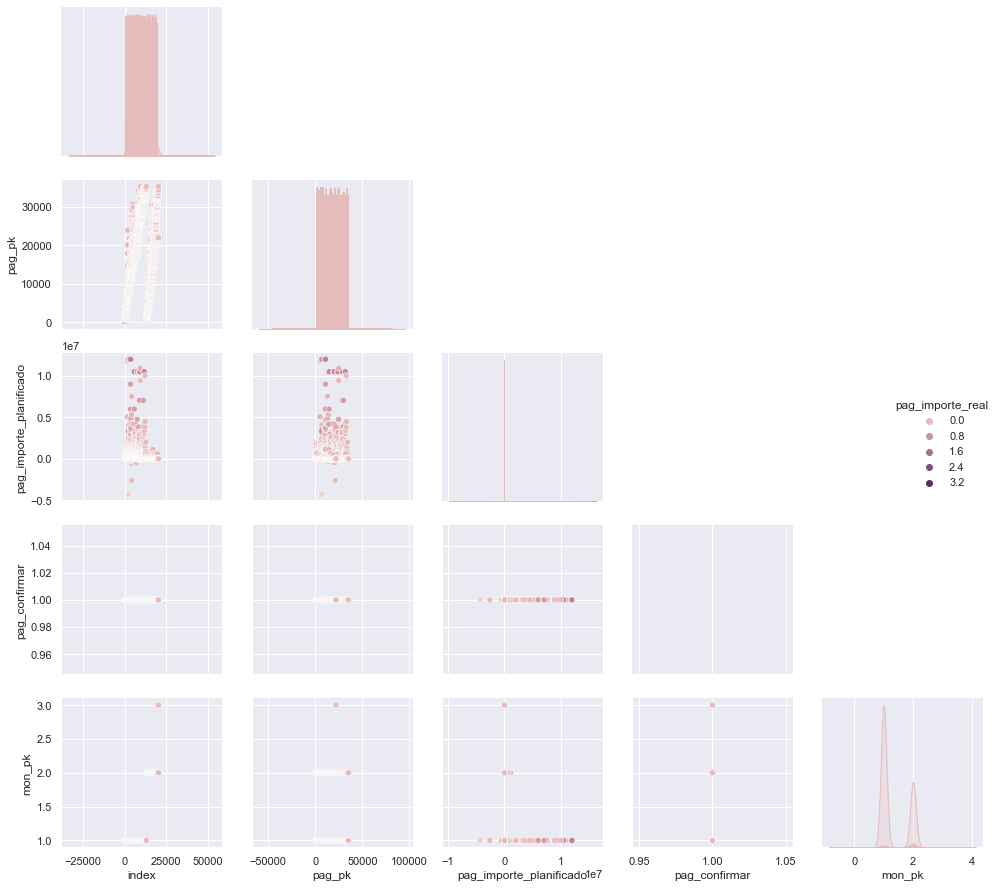

In [76]:
sns.set(style='darkgrid')
plt.figure(figsize=(15,12))
sns.pairplot(df_indice_recet, corner=True, hue="pag_importe_real")
plt.tight_layout()
plt.show()

Podemos observar que pago real respecto al planificado esta bastante crecano, confirmandose debajo con la matriz de correlacion la cual indica una correlacion positiva de 0.76.

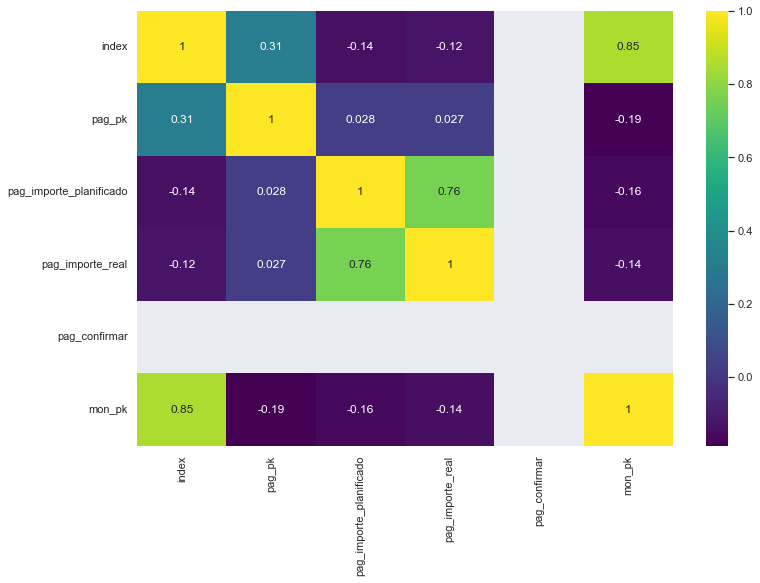

In [77]:
plt.figure(figsize=(12, 8))
sns.heatmap(df_indice_recet.corr(), annot=True, cmap='viridis')
plt.show()

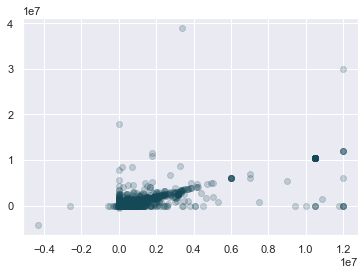

In [78]:
import matplotlib.pyplot as plt

plt.scatter(df_pagos['pag_importe_planificado'], df_pagos['pag_importe_real'], color = "#154957", alpha = 0.2)
plt.show()

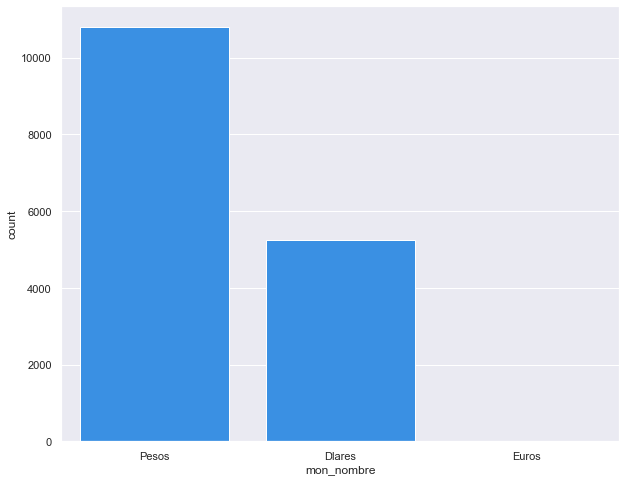

In [79]:
plt.figure(figsize=(10,8))
d0 = sns.countplot(data=df_indice_recet, x='mon_nombre', color='dodgerblue') 

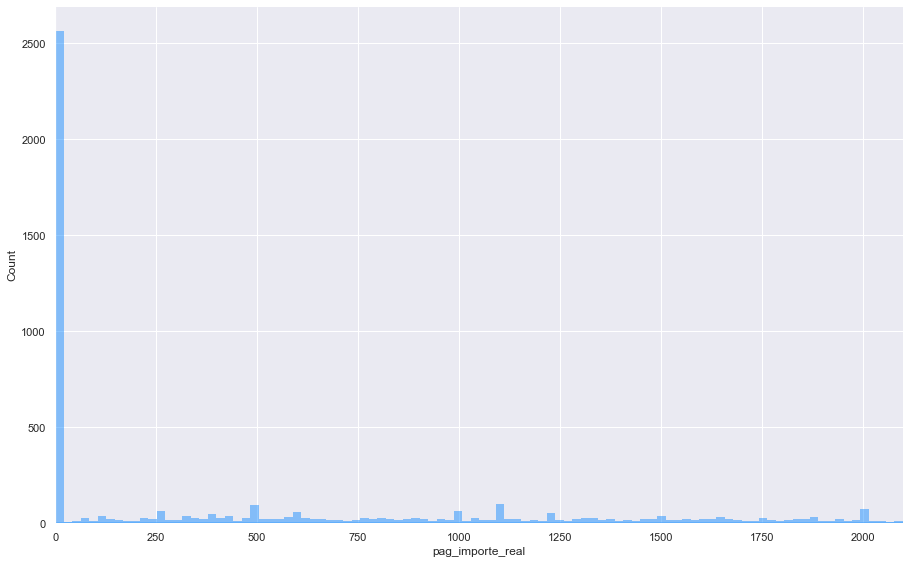

In [147]:
d2 = sns.displot(data=df_indice_recet, x='pag_importe_real', kde=True, height=8, aspect=1.6, bins=100, binrange=(0, 2100), color='dodgerblue')
d2.set(xlabel='pag_importe_real')
plt.xlim(0, 2100)
plt.show()

In [148]:
#Cambio de los tipo objetos a tipo fecha 
df_pagos['pag_fecha_planificada'] = pd.to_datetime(df_pagos['pag_fecha_planificada'])
df_pagos['pag_fecha_real'] = pd.to_datetime(df_pagos['pag_fecha_real'])

df_pagos.head()

,pag_pk,pag_fecha_planificada,pag_importe_planificado,pag_fecha_real,pag_importe_real,pag_confirmar,mon_pk,mon_nombre
106,125,2012-11-23,25205.0,2012-11-23,25205.0,1.0,1,Pesos
107,427,2012-12-28,25205.0,2012-12-28,25205.0,1.0,1,Pesos
108,428,2013-05-10,17644.0,2013-05-10,17644.0,1.0,1,Pesos
109,429,2013-06-21,17644.0,2013-06-21,17644.0,1.0,1,Pesos
110,430,2013-07-26,40328.0,2013-07-26,40328.0,1.0,1,Pesos


In [149]:
sns.set_style('darkgrid')
plt.rcParams['font.size'] = 14
plt.rcParams['figure.figsize'] = (20, 9)
plt.rcParams['figure.facecolor'] = '#00000000'
plt.rcParams['lines.linewidth'] = 2
# plt.style.use('fivethirtyeight')

In [150]:

dfi=df_pagos.set_index('pag_fecha_real', drop=True, append=False, inplace=False, verify_integrity=False)
dfi

,pag_pk,pag_fecha_planificada,pag_importe_planificado,pag_importe_real,pag_confirmar,mon_pk,mon_nombre
pag_fecha_real,,,,,,,
2012-11-23,125,2012-11-23,25205.0,25205.0,1.0,1,Pesos
2012-12-28,427,2012-12-28,25205.0,25205.0,1.0,1,Pesos
2013-05-10,428,2013-05-10,17644.0,17644.0,1.0,1,Pesos
2013-06-21,429,2013-06-21,17644.0,17644.0,1.0,1,Pesos
2013-07-26,430,2013-07-26,40328.0,40328.0,1.0,1,Pesos
...,...,...,...,...,...,...,...
2022-07-20,34386,2022-07-08,0.0,9207.0,1.0,2,Dlares
2022-08-26,35288,2022-09-05,0.0,9385.0,1.0,2,Dlares
2022-09-08,35304,2022-09-08,0.0,120.0,1.0,2,Dlares


In [151]:
pesos =dfi.query("mon_nombre == 'Pesos'")
dolares = dfi.query("mon_nombre == 'Dlares'")
euros = dfi.query("mon_nombre == 'Euro'")

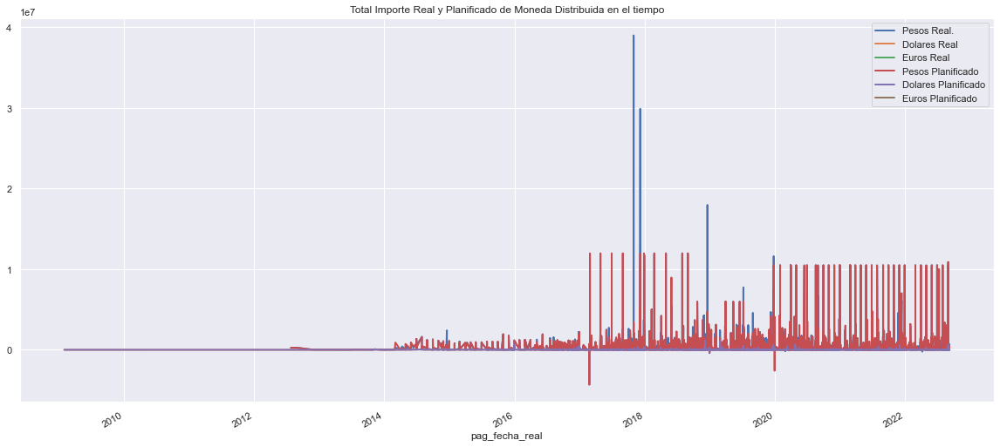

In [152]:
pesos['pag_importe_real'].plot(label = "Pesos Real.")
dolares['pag_importe_real'].plot(label = 'Dolares Real')

euros['pag_importe_real'].plot(label = 'Euros Real')
pesos['pag_importe_planificado'].plot(label = "Pesos Planificado")
dolares['pag_importe_planificado'].plot(label = 'Dolares Planificado')

euros['pag_importe_planificado'].plot(label = 'Euros Planificado')

plt.title('Total Importe Real y Planificado de Moneda Distribuida en el tiempo')
plt.legend()
plt.show()

Se observa que incide años electorales, y la estacionalidad donde se cocentra la mayor ejecucion en diciembre fin de año.

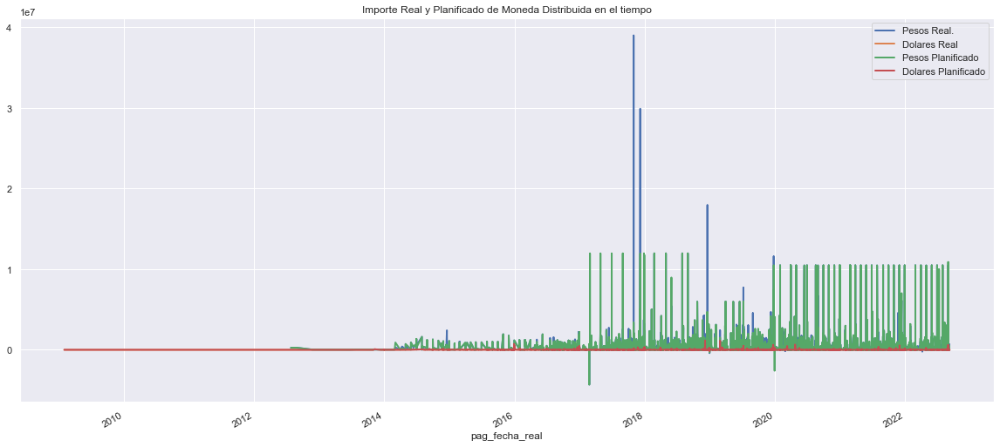

In [153]:
pesos['pag_importe_real'].plot(label = "Pesos Real.")
dolares['pag_importe_real'].plot(label = 'Dolares Real')


pesos['pag_importe_planificado'].plot(label = "Pesos Planificado")
dolares['pag_importe_planificado'].plot(label = 'Dolares Planificado')

plt.title('Importe Real y Planificado de Moneda Distribuida en el tiempo')
plt.legend()
plt.show()

Se puede observar el valor planificado en contraste con el valor real donde se observa que en el 2019 es año electoral, donde no hay presupuesto asignado lo cual afecta a la hora de desarrollar proyectos.

In [154]:
df_pagos=dfi.reset_index()

In [155]:
df_pagos.sample(2)

,pag_fecha_real,pag_pk,pag_fecha_planificada,pag_importe_planificado,pag_importe_real,pag_confirmar,mon_pk,mon_nombre
3785,2018-11-06,12529,2018-09-14,9129.0,2883.0,1.0,1,Pesos
6876,2020-04-30,19968,2020-04-30,10474559.0,10474559.0,1.0,1,Pesos


# MODELO PREDICCION DEL PRESUPUESTO PESOS

In [167]:
#Eliminan las filas de esos registros
indexNames = df_pagos[df_pagos['mon_pk']==2].index
# Delete these row indexes from dataFrame

df_pagos.drop(indexNames,inplace=True)

In [168]:
df_pagos.sample(5)

,pag_fecha_real,pag_pk,pag_fecha_planificada,pag_importe_planificado,pag_importe_real,pag_confirmar,mon_pk,mon_nombre
3940,2019-09-30,12483,2019-09-30,17583.0,0.0,1.0,1,Pesos
9022,2021-11-30,26497,2021-09-30,20139.0,39169.0,1.0,1,Pesos
2369,2018-08-21,9317,2018-09-30,1500.0,1678.0,1.0,1,Pesos
7494,2020-11-12,22377,2020-12-29,18808.0,16457.0,1.0,1,Pesos
9995,2021-12-13,32841,2021-12-31,0.0,916784.0,1.0,1,Pesos


In [169]:
pagos_modelo_pesos=df_pagos.drop(['pag_pk','pag_fecha_planificada','pag_importe_planificado','pag_confirmar','mon_pk','mon_nombre'],axis=1)
pagos_modelo_pesos.shape

(10797, 2)

In [170]:
pagos_modelo_pesos.sample(5)

,pag_fecha_real,pag_importe_real
9198,2022-02-28,0.0
7946,2021-02-28,6525.0
10259,2022-03-08,10836.0
4090,2019-05-14,0.0
4663,2019-08-31,7545.0


In [171]:
#Eliminan las filas de esos registros por debaje del 1% del valor medior dado que se suprimen 8% de registros es despeciable.
indexNames = pagos_modelo_pesos[pagos_modelo_pesos['pag_importe_real']<=3019.0].index
# Delete these row indexes from dataFrame

pagos_modelo_pesos.drop(indexNames,inplace=True)

In [172]:
#Eliminamos las filtas por encima de 12 millones dado que son los outlier del boxplot.
indexNames = pagos_modelo_pesos[pagos_modelo_pesos['pag_importe_real']>1200000].index
# Delete these row indexes from dataFrame

pagos_modelo_pesos.drop(indexNames,inplace=True)

In [173]:
pagos_modelo_pesos.sort_values(['pag_fecha_real', 'pag_importe_real'],ascending=False) 
pagos_modelo_pesos

,pag_fecha_real,pag_importe_real
0,2012-11-23,25205.0
1,2012-12-28,25205.0
2,2013-05-10,17644.0
3,2013-06-21,17644.0
4,2013-07-26,40328.0
...,...,...
10790,2022-06-23,220665.0
10791,2022-06-23,12948.0
10792,2022-07-15,57340.0
10793,2022-01-05,22276.0


In [174]:
pagos_modelo_pesos.head(5)

,pag_fecha_real,pag_importe_real
0,2012-11-23,25205.0
1,2012-12-28,25205.0
2,2013-05-10,17644.0
3,2013-06-21,17644.0
4,2013-07-26,40328.0


In [175]:
pagos_modelo_pesos.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7911 entries, 0 to 10794
Data columns (total 2 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   pag_fecha_real    7911 non-null   datetime64[ns]
 1   pag_importe_real  7911 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 185.4 KB


In [176]:
pagos_modelo_pesos['pag_importe_real'].max()

1198528.0

In [177]:
pagos_modelo_pesos['pag_importe_real'].mean()

159137.37717481985

In [178]:
pagos_modelo_pesos['pag_importe_real'].min()

3031.0

Generalmente usamos diagramas de dispersión para encontrar la correlación entre dos variables.  Con el gráfico que se muestra a continuación, podemos dibujar fácilmente una línea de tendencia. Estas características proporcionan una buena dispersión de puntos.


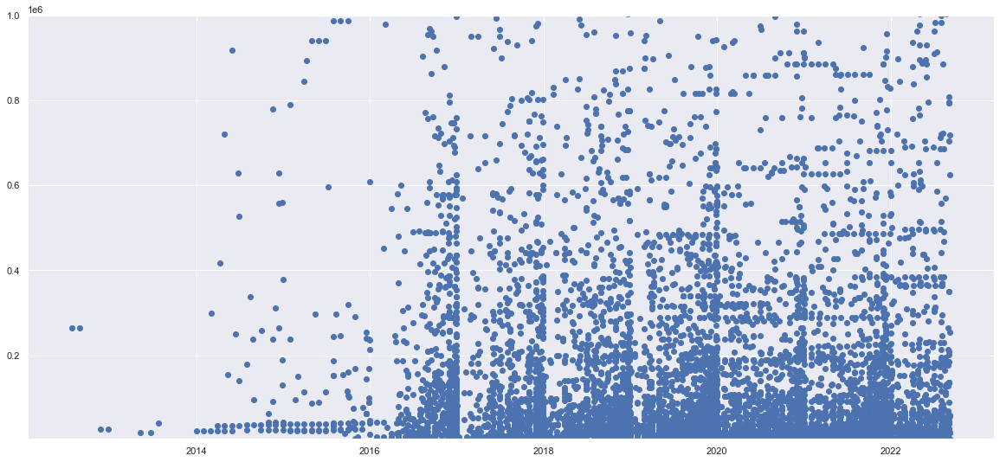

In [179]:
# Importar el módulo pyplot con el alias plt
import matplotlib.pyplot as plt
# Crear la figura y los ejes
fig, ax = plt.subplots()
# Dibujar puntos
ax.scatter(x = pagos_modelo_pesos['pag_fecha_real'], y = pagos_modelo_pesos['pag_importe_real'])
plt.ylim(3031.0, 1000000.0)
# Guardar el gráfico en formato png
plt.savefig('diagrama-dispersion.png')
# Mostrar el gráfico
plt.show()

Se observa que apartir del 2014 es cuando se comienzan a realizar los pagos hasta el 2022, poor tanto entendemos que la prediccion deberia de ser en el 2014 en adelante. Asimismo se observa que en diciembre se acumulan todos los pagos, lo que es cuando se tiene que ejecutar el presupuesto.

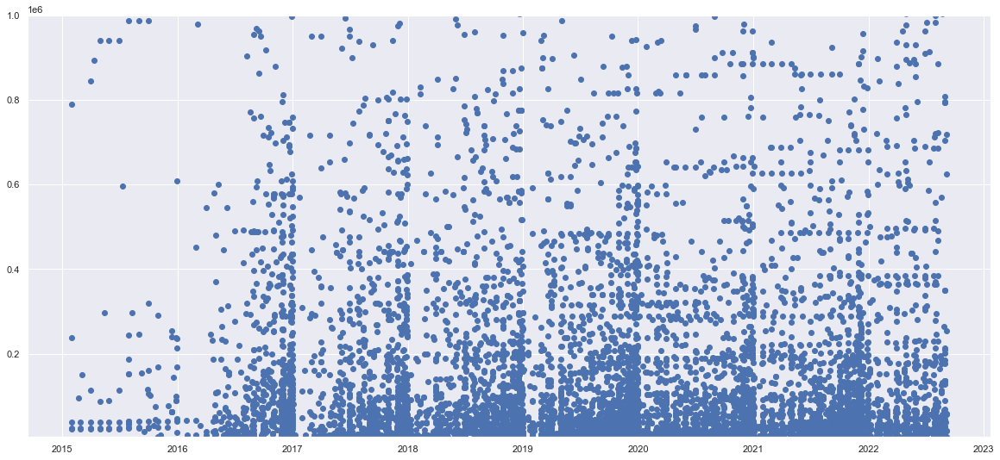

In [180]:
sp = pagos_modelo_pesos.rename(columns={'pag_fecha_real': 'ds','pag_importe_real': 'y'})
sp_sample = sp[(sp.ds.dt.year>2014)]
# Crear la figura y los ejes
fig, ax = plt.subplots()
# Dibujar puntos
ax.scatter(x = sp_sample ['ds'], y = sp_sample ['y'])
plt.ylim(3031.0, 1000000.0)
# Guardar el gráfico en formato png
plt.savefig('diagrama-dispersion.png')
# Mostrar el gráfico
plt.show()

In [181]:
model1 = Prophet(interval_width=0.95)
model1.add_country_holidays(country_name='UY')
model1.fit(sp_sample)

17:11:38 - cmdstanpy - INFO - Chain [1] start processing
17:11:41 - cmdstanpy - INFO - Chain [1] done processing


In [203]:
future = model1.make_future_dataframe(periods=30, freq="B")
forecast = model1.predict(future)

forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
1251,2022-10-13,168980.569877,-286591.609815,584866.967780
1252,2022-10-14,166904.687149,-253934.822903,608599.165725
1253,2022-10-17,172000.031024,-257452.262971,593008.706396
1254,2022-10-18,165363.936389,-257627.764878,561568.111496
1255,2022-10-19,160532.580910,-268282.001218,590937.339209


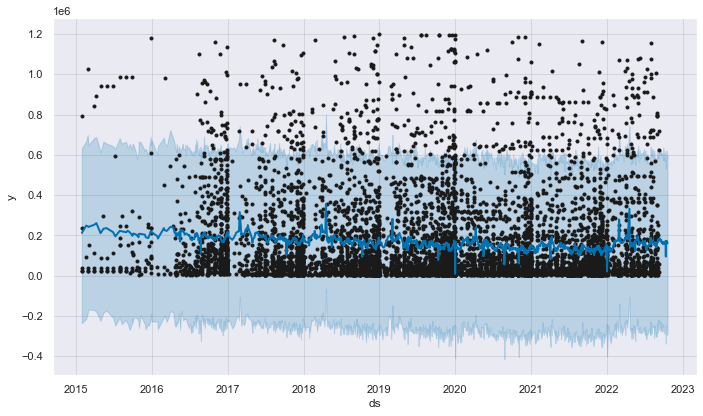

In [183]:
fig = model1.plot(forecast)

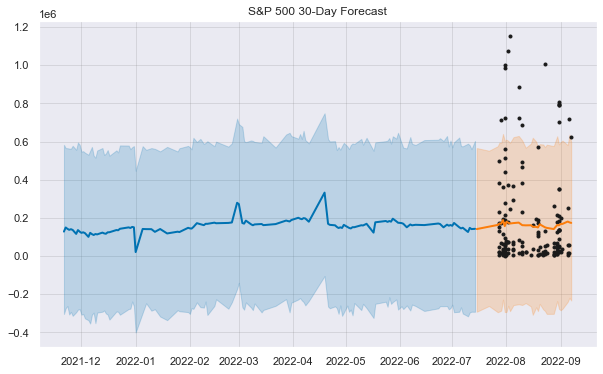

In [184]:
def custom_forecast_plot():
    forecast_length = 30

    prior_df = sp[(sp.ds.dt.year>2014)]
    forecast_df = sp[(sp.ds.dt.year==2021) & (sp.ds.dt.month==1)]
    all_df = pd.concat([prior_df, forecast_df]).sort_values('ds')
    all_df.head()

    all_df_sample = all_df[-forecast_length*5:]
    forecast_sample = forecast[forecast['ds'].isin(all_df["ds"].values)].sort_values('ds')

    prior_vis_df = forecast_sample[-forecast_length*5:-forecast_length]
    forecast_vis_df = forecast_sample[-forecast_length:]

    fig = plt.figure(figsize=(10,6))
    ax = fig.add_subplot(111)

    ax.plot(all_df_sample['ds'].dt.to_pydatetime(), all_df_sample["y"], '.k')

    ax.plot(prior_vis_df['ds'].dt.to_pydatetime(), prior_vis_df['yhat'], ls='-', c='#0072B2')
    ax.fill_between(prior_vis_df['ds'].dt.to_pydatetime(), prior_vis_df['yhat_lower'], prior_vis_df['yhat_upper'], color='#0072B2', alpha=0.2)

    ax.plot(forecast_vis_df['ds'].dt.to_pydatetime(), forecast_vis_df['yhat'], ls='-', c='#fc7d0b')
    ax.fill_between(forecast_vis_df['ds'].dt.to_pydatetime(), forecast_vis_df['yhat_lower'], forecast_vis_df['yhat_upper'], color='#fc7d0b', alpha=0.2)
    ax.grid(True, which='major', c='gray', ls='-', lw=1, alpha=0.2)

    ax.set_title('S&P 500 30-Day Forecast')
    plt.show(sns)
    
custom_forecast_plot()

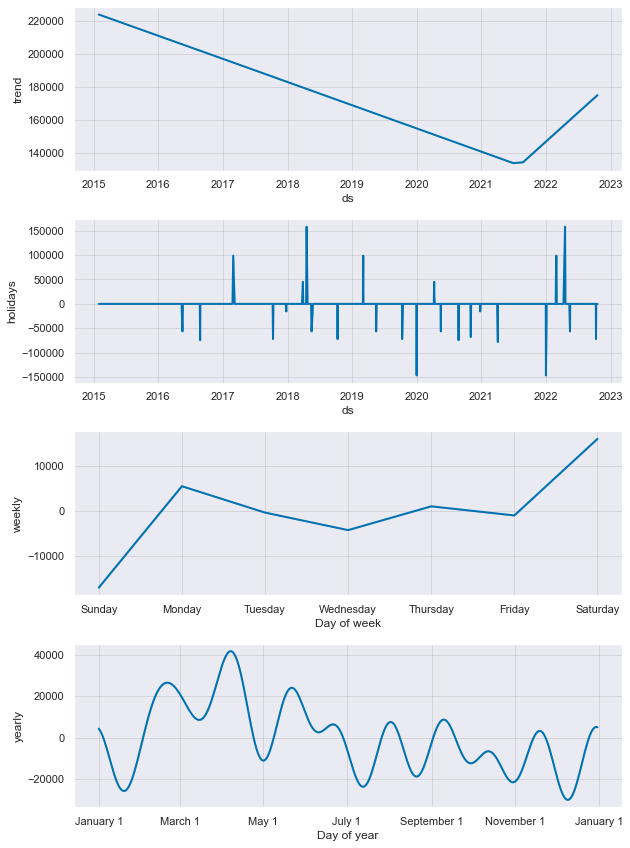

In [185]:
fig = model1.plot_components(forecast)

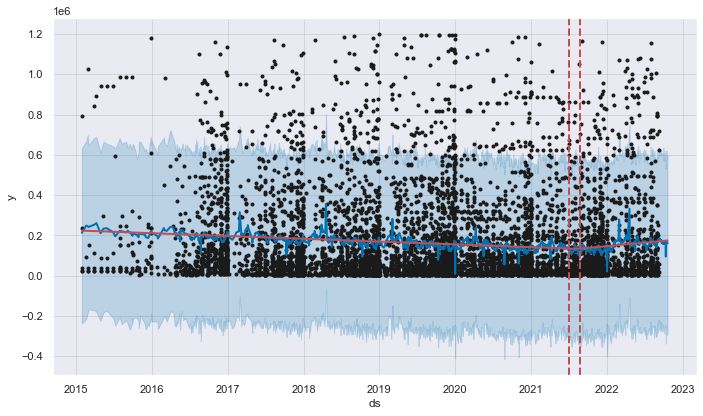

In [186]:
fig = model1.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), model1, forecast)

17:12:04 - cmdstanpy - INFO - Chain [1] start processing
17:12:07 - cmdstanpy - INFO - Chain [1] done processing


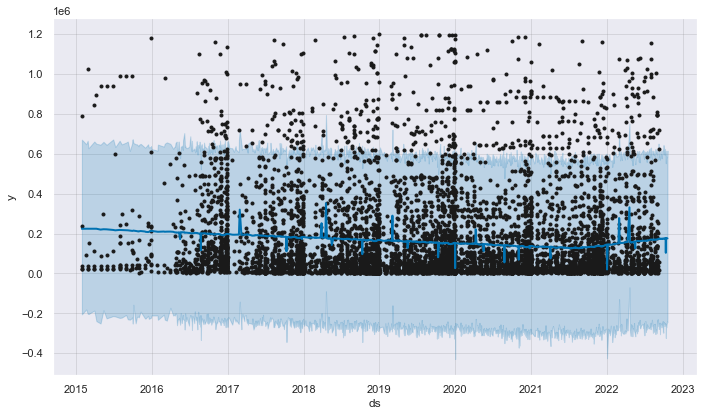

In [187]:
model4 = Prophet(interval_width=0.95, seasonality_prior_scale=0.001)
model4.add_country_holidays(country_name='UY')
forecast = model4.fit(sp_sample).predict(future)
fig = model4.plot(forecast)

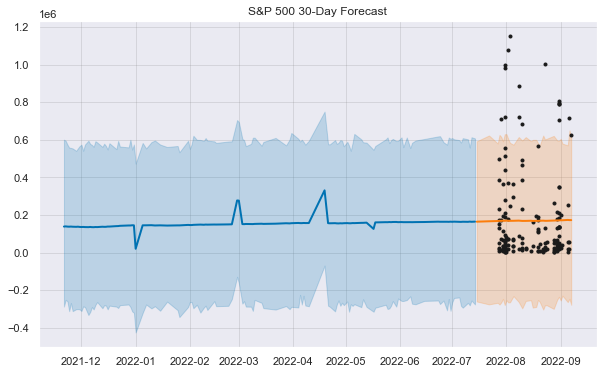

In [188]:
custom_forecast_plot()

17:12:33 - cmdstanpy - INFO - Chain [1] start processing
17:12:34 - cmdstanpy - INFO - Chain [1] done processing


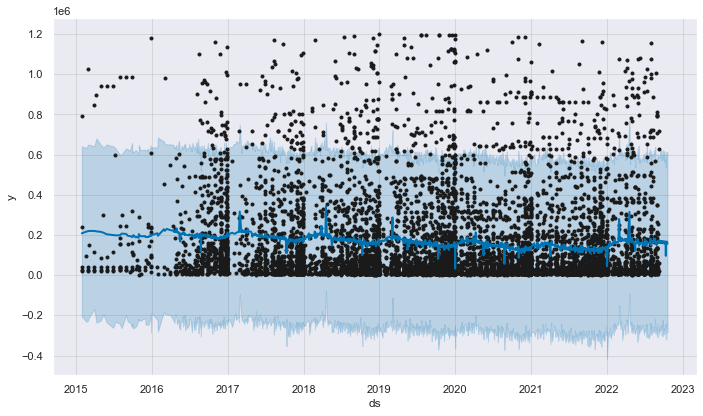

In [190]:
model5 = Prophet(interval_width=0.95, weekly_seasonality=True)
model5.add_seasonality(name='yearly', period=365, fourier_order=2)
model5.add_country_holidays(country_name='UY')
forecast = model5.fit(sp_sample).predict(future)
fig = model5.plot(forecast)

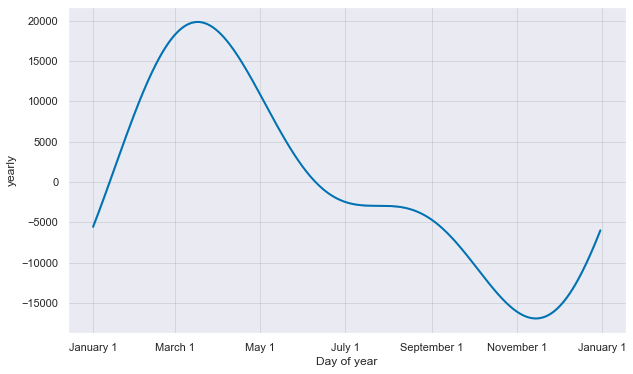

In [191]:
fig = plot_yearly(model5)

17:12:45 - cmdstanpy - INFO - Chain [1] start processing
17:12:51 - cmdstanpy - INFO - Chain [1] done processing


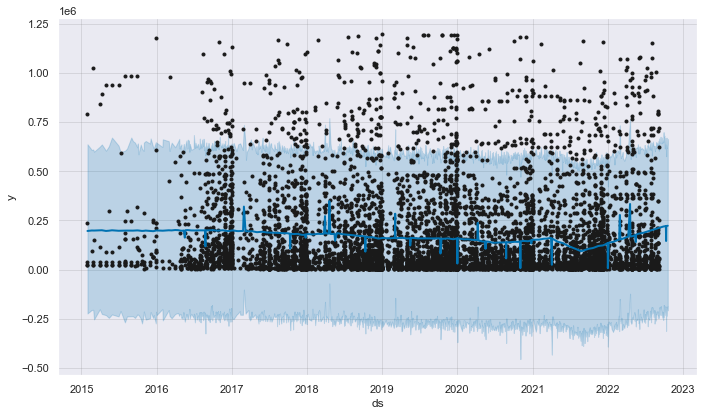

In [192]:
final_model_pesos = Prophet(interval_width=0.95, weekly_seasonality=False,seasonality_prior_scale=0.001,changepoint_prior_scale=0.9)
final_model_pesos.add_seasonality(name='yearly', period=365, fourier_order=8)
final_model_pesos.add_country_holidays(country_name='UY')
forecast = final_model_pesos.fit(sp_sample).predict(future)
fig = final_model_pesos.plot(forecast)

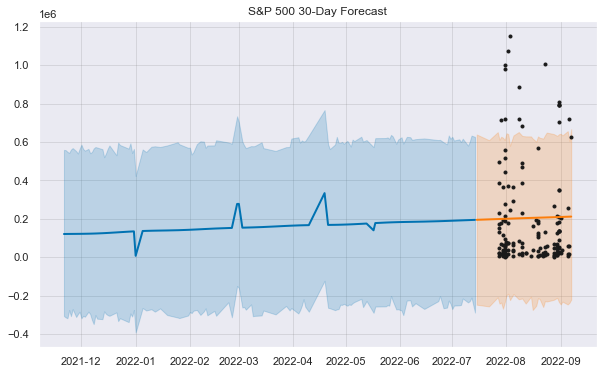

In [193]:
custom_forecast_plot()

# MODELO DE PREDICCION DE PRESUPUESTO DOLARES

In [212]:
df_pagos_dolares = pd.read_csv("pagos_moneda_filtro_campos.csv", engine="python", sep=',', quotechar='"', error_bad_lines=False)

In [213]:
#Eliminan las filas de esos registros
indexNames = df_pagos_dolares[df_pagos_dolares['pag_confirmar'].isnull()].index
# Delete these row indexes from dataFrame

df_pagos_dolares.drop(indexNames,inplace=True)

In [23]:
#Eliminan las filas de esos registros de los no confirmados.
indexNames = df_pagos_dolares[df_pagos_dolares['pag_confirmar']==0].index
# Delete these row indexes from dataFrame
df_pagos_dolares.drop(indexNames,inplace=True)

In [24]:
#Eliminan las filas de esos registros
indexNames = df_pagos_dolares[df_pagos_dolares['mon_pk']==1 & 3].index
# Delete these row indexes from dataFrame
df_pagos_dolares.drop(indexNames,inplace=True)

In [25]:
df_pagos_dolares.sample(5)

,pag_pk,pag_fecha_planificada,pag_importe_planificado,pag_fecha_real,pag_importe_real,pag_confirmar,mon_pk,mon_nombre
16664,11765,2018-06-30 00:00:00,5410.0,2018-06-30 00:00:00,5251.0,1.0,2,Dlares
18963,27360,2021-02-26 00:00:00,923.0,2021-11-18 00:00:00,1020.0,1.0,2,Dlares
15351,6617,2017-06-30 00:00:00,220.0,2017-10-06 00:00:00,220.0,1.0,2,Dlares
15990,8345,2017-10-15 00:00:00,0.0,2017-11-03 00:00:00,116.0,1.0,2,Dlares
17034,13911,2019-03-31 00:00:00,6600.0,2019-03-31 00:00:00,3659.0,1.0,2,Dlares


In [26]:
df_pagos_dolares=df_pagos_dolares.drop(['pag_pk','pag_fecha_planificada','pag_importe_planificado','pag_confirmar','mon_pk','mon_nombre'],axis=1)
df_pagos_dolares.shape

(5244, 2)

In [27]:
df_pagos_dolares.sample(5)

,pag_fecha_real,pag_importe_real
14770,2017-08-03 00:00:00,5018.0
13873,2016-12-15 00:00:00,9457.0
15601,2018-05-29 00:00:00,3594.0
15957,2017-11-10 00:00:00,0.0
17351,2020-04-30 00:00:00,597.0


In [28]:
df_pagos_dolares.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5244 entries, 13186 to 20226
Data columns (total 2 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   pag_fecha_real    5244 non-null   object 
 1   pag_importe_real  5244 non-null   float64
dtypes: float64(1), object(1)
memory usage: 122.9+ KB


In [29]:
df_pagos_dolares['pag_importe_real'].max()

1150000.0

In [30]:
df_pagos_dolares['pag_importe_real'].min()

-976.0

In [31]:
df_pagos_dolares['pag_importe_real'].mean()

9407.202526697178

In [32]:
#Eliminan las filas de esos registros por debaje del 1% del valor medior dado que se suprimen 8% de registros es despeciable.
indexNames = df_pagos_dolares[df_pagos_dolares['pag_importe_real']==0].index
# Delete these row indexes from dataFrame

df_pagos_dolares.drop(indexNames,inplace=True)

In [33]:
#Eliminan las filas de esos registros por debaje del 1% del valor medior dado que se suprimen 8% de registros es despeciable.
indexNames = df_pagos_dolares[df_pagos_dolares['pag_importe_real']>500000].index
# Delete these row indexes from dataFrame

df_pagos_dolares.drop(indexNames,inplace=True)

In [34]:
df_pagos_dolares.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4432 entries, 13186 to 20226
Data columns (total 2 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   pag_fecha_real    4432 non-null   object 
 1   pag_importe_real  4432 non-null   float64
dtypes: float64(1), object(1)
memory usage: 103.9+ KB


In [40]:
#Cambio de los tipo objetos a tipo fecha 

df_pagos_dolares['pag_fecha_real'] = pd.to_datetime(df_pagos_dolares['pag_fecha_real'])

df_pagos_dolares.head()

,pag_fecha_real,pag_importe_real
13186,2014-04-28,5246.40
13187,2014-05-27,15739.20
13188,2014-09-15,20985.60
13189,2014-10-14,10492.80
13190,2015-02-28,1722.64


In [41]:
df_pagos_dolares.sort_values(['pag_fecha_real', 'pag_importe_real'],ascending=False) 
df_pagos_dolares

,pag_fecha_real,pag_importe_real
13186,2014-04-28,5246.40
13187,2014-05-27,15739.20
13188,2014-09-15,20985.60
13189,2014-10-14,10492.80
13190,2015-02-28,1722.64
...,...,...
20116,2022-07-20,9207.00
20117,2022-08-26,9385.00
20221,2022-09-08,120.00
20223,2020-03-17,800.00


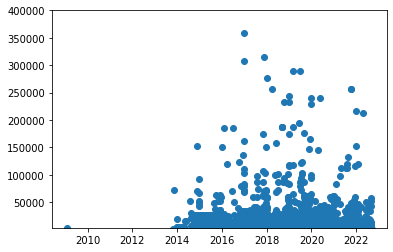

In [43]:

# Crear la figura y los ejes
fig, ax = plt.subplots()
# Dibujar puntos
ax.scatter(x = df_pagos_dolares['pag_fecha_real'], y = df_pagos_dolares['pag_importe_real'])
plt.ylim(3031.0, 400000.0)
# Guardar el gráfico en formato png
plt.savefig('diagrama-dispersion.png')
# Mostrar el gráfico
plt.show()

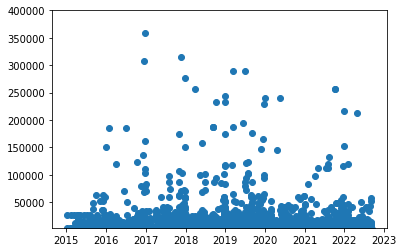

In [46]:
sp = df_pagos_dolares.rename(columns={'pag_fecha_real': 'ds','pag_importe_real': 'y'})
sp_sample1 = sp[(sp.ds.dt.year>2014)]
# Crear la figura y los ejes
fig, ax = plt.subplots()
# Dibujar puntos
ax.scatter(x = sp_sample1 ['ds'], y = sp_sample1 ['y'])
plt.ylim(3031.0, 400000.0)
# Guardar el gráfico en formato png
plt.savefig('diagrama-dispersion.png')
# Mostrar el gráfico
plt.show()

In [47]:
model11 = Prophet(interval_width=0.95)
model11.add_country_holidays(country_name='UY')
model11.fit(sp_sample1)

20:30:56 - cmdstanpy - INFO - Chain [1] start processing
20:30:57 - cmdstanpy - INFO - Chain [1] done processing


In [48]:
future = model11.make_future_dataframe(periods=30, freq="B")
forecast = model11.predict(future)

forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
1119,2022-10-14,10598.276383,-39813.802710,58862.932563
1120,2022-10-17,13062.124821,-38021.667512,62975.061069
1121,2022-10-18,12089.167706,-37068.397801,61459.678484
1122,2022-10-19,10529.724484,-41699.532776,58394.523951
1123,2022-10-20,8473.125030,-42330.831303,59596.341844


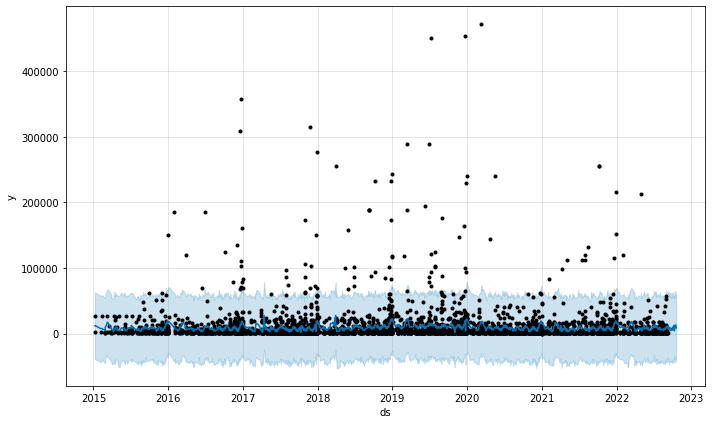

In [51]:
fig = model11.plot(forecast)

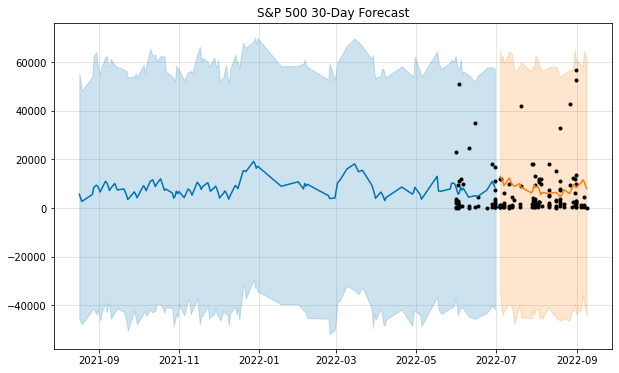

In [52]:
def custom_forecast_plot():
    forecast_length = 30

    prior_df = sp[(sp.ds.dt.year>2014)]
    forecast_df = sp[(sp.ds.dt.year==2021) & (sp.ds.dt.month==1)]
    all_df = pd.concat([prior_df, forecast_df]).sort_values('ds')
    all_df.head()

    all_df_sample = all_df[-forecast_length*5:]
    forecast_sample = forecast[forecast['ds'].isin(all_df["ds"].values)].sort_values('ds')

    prior_vis_df = forecast_sample[-forecast_length*5:-forecast_length]
    forecast_vis_df = forecast_sample[-forecast_length:]

    fig = plt.figure(figsize=(10,6))
    ax = fig.add_subplot(111)

    ax.plot(all_df_sample['ds'].dt.to_pydatetime(), all_df_sample["y"], '.k')

    ax.plot(prior_vis_df['ds'].dt.to_pydatetime(), prior_vis_df['yhat'], ls='-', c='#0072B2')
    ax.fill_between(prior_vis_df['ds'].dt.to_pydatetime(), prior_vis_df['yhat_lower'], prior_vis_df['yhat_upper'], color='#0072B2', alpha=0.2)

    ax.plot(forecast_vis_df['ds'].dt.to_pydatetime(), forecast_vis_df['yhat'], ls='-', c='#fc7d0b')
    ax.fill_between(forecast_vis_df['ds'].dt.to_pydatetime(), forecast_vis_df['yhat_lower'], forecast_vis_df['yhat_upper'], color='#fc7d0b', alpha=0.2)
    ax.grid(True, which='major', c='gray', ls='-', lw=1, alpha=0.2)

    ax.set_title('S&P 500 30-Day Forecast')
    plt.show(sns)
    
custom_forecast_plot()

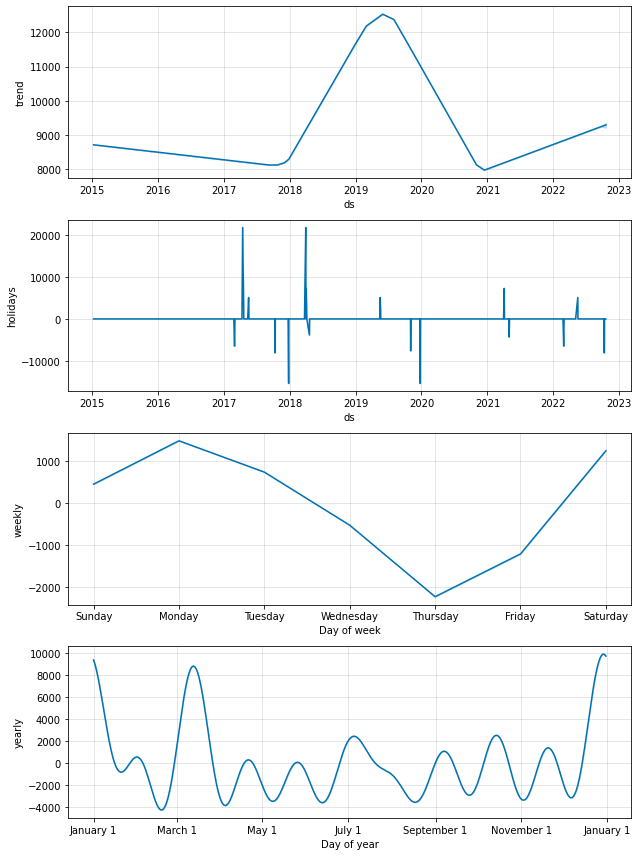

In [53]:
fig = model11.plot_components(forecast)

20:36:34 - cmdstanpy - INFO - Chain [1] start processing
20:36:36 - cmdstanpy - INFO - Chain [1] done processing


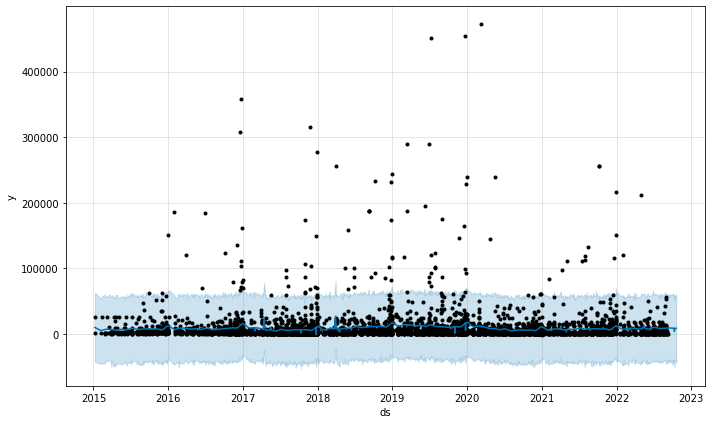

In [59]:
final_model_dolares = Prophet(interval_width=0.95, weekly_seasonality=False,seasonality_prior_scale=0.001,changepoint_prior_scale=0.9)
final_model_dolares .add_seasonality(name='yearly', period=365, fourier_order=8)
final_model_dolares .add_country_holidays(country_name='UY')
forecast = final_model_dolares.fit(sp_sample1).predict(future)
fig = final_model_dolares .plot(forecast)

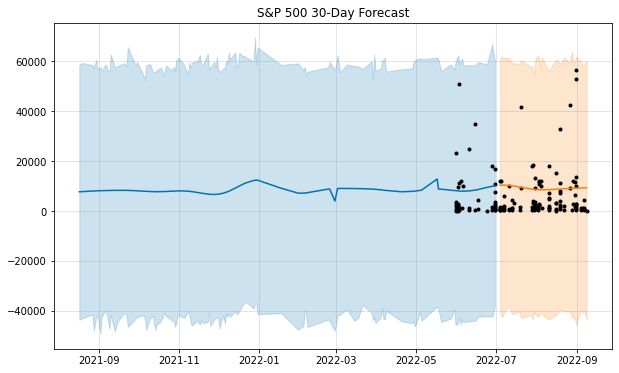

In [60]:
custom_forecast_plot()

In [66]:
# Save the model
filename ='modelspersos.sav'
pickle.dump(final_model_pesos, open(filename, 'wb'))

In [68]:
# Save the model
filename ='modelsdolares.sav'
pickle.dump(final_model_dolares, open(filename, 'wb'))

# Recomendaciones

1. Mejorar el registro de riesgos mas exhaustivo y con mayor detalle, dado que solo 13 representan los mas aplicados.
2. El promedio da entre 7 y 8 riesgos por proyecto se visualiza pocos riesgos por proyectos.
3. Se recomienda tener indvidualizadas las oportunidades por alguna forma
4. Seria bueno tener una categorizacion de los riesgos estandarizada.
5. Se recomienda generar respuesta a los riesgos dado que el 40% no se tiene.
6. Se recomienda revisar la documentacion de las lecciones aprendidas asi como el proceso de generacion de las mismas.
7. Que todos los proyectos posee entregables y/o productos definidos.
8. La moneda que se toma en este caso no es la moneda del pago del proyecto sino que es la moneda de la adquiscion lo que se recomienda rever este tema.
9. Mantener los criterios de ponderacion de los riesgos dado que su distribucion es adecuada.
10. Todos los proyectos deberian tener descripciones, objetivos y beneficios
11. Que los tableros de wekan en Title board se asocien por el numero de ID  con siges para mantener la traza.
12. Todos los proyectos tiene que tener situacion actual.
13. Uniformizar los criterios de los semaforos, amarillos y rojos en base a ciertas variables con el fin de que los datos se analizen sin sesgos.
14. Se recomienda que todos los proyectos tengan entregables / productos asociados.
15. Se recomienda cargar la estimacion de presupuesto con el fin de tener una linea base del mismo dado que solo el 25% posee le mismo.
16. Se recomienda revisar la estructura de la tablas, por ejemplo pagos no tiene id moneda hay que ir por adquisicion para obtener la misma.
17. Mejorar la calidad de los datos, por ejemplo lecciones aprendidas.
18. En el caso de los Riesgos mejorar la calidad muchas veces se incorporan de forma obligatoria y no terminan de reflejar los riesgos reales que sirven para una analisis de datos.
19. Mejoras le escala de presupuesto por ejemplo: Tipo_Presupuesto	Subejecuccion	$ - Posible Subejecución Más de 30% de desviación
	Correcto	"$ - Ejecución dentro de lo Planificado Menos de 15 de desviación Sobreejecuccion	"$ - Posible Sobre-Ejecución
 Más de 20% de desviación"


Nota https://www.kaggle.com/code/stpeteishii/sp500-companies-annual-growth-rate-ranking  https://www.kaggle.com/code/brendanartley/forecasting-stocks-w-prophet 
https://www.kaggle.com/code/faryarmemon/s-p-500-stock-analysis-for-beginners

https://www.kaggle.com/code/ravinderkotwal/optiver-volatility-prediction-eda
https://git-lfs.github.com/

Indicators: https://s-ai-f.github.io/Time-Series/time-series-forecasting.html

https://facebook.github.io/prophet/docs/trend_changepoints.html

#Prueba modelo

In [61]:
df_modelo = pd.read_csv('DataModeloRegresion.csv', engine='python')
#Eliminan las filas de esos registros
indexNames = df_modelo[df_modelo['Padre']==0].index
# Delete these row indexes from dataFrame
df_modelo.drop(indexNames,inplace=True)
from sklearn.model_selection import train_test_split 
train, test = train_test_split(df_modelo, test_size = 0.20, shuffle = False)
#Eliminan las filas de esos registros
indexNames = train[train['Avance'].isnull()].index
# Delete these row indexes from dataFrame
train.drop(indexNames,inplace=True)
#Eliminan las filas de esos registros
indexNames = train[train['EstadoCronograma'].isnull()].index
# Delete these row indexes from dataFrame
train.drop(indexNames,inplace=True)
train.drop(['Tipo_Presupuesto','Termina en presupuesto','Programa','Proyecto','Área','Orden','Padre','Nombre','Área.1','Tipo','Inicio plan.','Fin plan.','Inicio','Fin','Duración plan.','Duración','Cantidad_Riesgos','Tipo_Riesgo','Anio'],axis=1,inplace=True)
X = train.drop(['Dificultad'], axis=1)
y = train['Dificultad']
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
from sklearn.linear_model import LogisticRegression
# Instantiate Logistic Regression
model = LogisticRegression()
# Fit the data
model.fit(X_train, y_train)
x_nuevo = pd.DataFrame({'Avance':[81],'EstadoCronograma': [0]})
print(x_nuevo)
resultadoPorcentaje = model.predict(x_nuevo)
resultadoPorcentaje 

   Avance  EstadoCronograma
0      81                 0


array([0], dtype=int64)